# PEER TO PEER LENDING LOAN STATUS PREDICTION

### OBJECTIVE:
**Bondora is a peer to peer lending platform in Estonia.Bondora serves as an online community for investing in personal debt starting at €1, and enables borrowers to receive funding directly from investors.But it is often associated with risk. The borrower's may default on the loan.**

**To mitigate this issue, we decided to build a Machine Learning model. We have collected past data on the loan borrowers & developed a strong ML Model to classify if any new borrower is likely to default or not.**

## Import neessary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv("finance.csv")

C:\Users\Biji\AppData\Local\Temp\ipykernel_6064\453512322.py:1: DtypeWarning: Columns (34,37,38,80,82,83,89,90) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv("finance.csv")


In [3]:
pd.set_option("display.max_columns",None)

## Data claiming / Preprocessing

In [4]:
df

,ReportAsOfEOD,LoanId,LoanNumber,ListedOnUTC,BiddingStartedOn,BidsPortfolioManager,BidsApi,BidsManual,UserName,NewCreditCustomer,LoanApplicationStartedDate,LoanDate,ContractEndDate,FirstPaymentDate,MaturityDate_Original,MaturityDate_Last,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,DateOfBirth,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,NrOfDependants,EmploymentStatus,EmploymentDurationCurrentEmployer,EmploymentPosition,WorkExperience,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeFromPension,IncomeFromFamilyAllowance,IncomeFromSocialWelfare,IncomeFromLeavePay,IncomeFromChildSupport,IncomeOther,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,ActiveScheduleFirstPaymentReached,PlannedPrincipalTillDate,PlannedInterestTillDate,LastPaymentOn,CurrentDebtDaysPrimary,DebtOccuredOn,CurrentDebtDaysSecondary,DebtOccuredOnForSecondary,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,DefaultDate,PrincipalOverdueBySchedule,PlannedPrincipalPostDefault,PlannedInterestPostDefault,EAD1,EAD2,PrincipalRecovery,InterestRecovery,RecoveryStage,StageActiveSince,ModelVersion,Rating,EL_V0,Rating_V0,EL_V1,Rating_V1,Rating_V2,Status,Restructured,ActiveLateCategory,WorseLateCategory,CreditScoreEsMicroL,CreditScoreEsEquifaxRisk,CreditScoreFiAsiakasTietoRiskGrade,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalWriteOffs,InterestAndPenaltyWriteOffs,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsBefoleLoan,PreviousEarlyRepaymentsCountBeforeLoan,GracePeriodStart,GracePeriodEnd,NextPaymentDate,NextPaymentNr,NrOfScheduledPayments,ReScheduledOn,PrincipalDebtServicingCost,InterestAndPenaltyDebtServicingCost,ActiveLateLastPaymentCategory
0,2020-01-27,F0660C80-83F3-4A97-8DA0-9C250112D6EC,659,2009-06-11 16:40:39,2009-06-11 16:40:39,0,0,115.0410,KARU,True,2009-06-11 16:40:39,2009-06-16,2010-07-06,2009-07-27,2010-06-25,2010-06-25,17,5,2.0,1,61,1947-11-26,1.0,EE,319.5582,115.0408,30.00,12,NaN,HARJU,TALLINN,7,3.0,1.0,0,3.0,UpTo3Years,klienditeenindaja,MoreThan25Years,7.0,NaN,6000.0,0.0,0.0,0.0,0.0,0.0,4500.0,10500.0,0,0.00,0,0.00,0.00,25,True,1800.0000,319.0800,2010-07-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,91-120,NaN,NaN,NaN,NaN,115.0408,20.4222,0.00,0.00,0.00,0.00,1,83.0852,0.0000,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,NaN
1,2020-01-27,978BB85B-1C69-4D51-8447-9C240104A3A2,654,2009-06-10 15:48:57,2009-06-10 15:48:57,0,0,140.6057,koort681,False,2009-06-10 15:48:57,2009-06-15,2009-07-07,2009-07-15,2009-07-15,2009-07-15,20,4,2.0,1,48,1960-11-05,1.0,EE,191.7349,140.6057,25.00,1,NaN,IDA-VIRU,KOHTLA-JARVE,7,5.0,4.0,0,3.0,MoreThan5Years,Õppealajuhataja lasteaias,MoreThan25Years,16.0,NaN,8300.0,0.0,0.0,0.0,0.0,0.0,2500.0,10800.0,0,0.00,0,0.00,0.00,15,True,2200.0000,45.8300,2009-07-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,NaN,NaN,NaN,NaN,NaN,140.6057,2.0227,0.00,0.00,0.00,0.00,2,255.6467,258.6256,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,NaN
2,2020-01-27,EA44027E-7FA7-4BB2-846D-9C1F013C8A22,641,2009-06-05 19:12:29,2009-06-05 19:12:29,0,0,319.5580,0ie,True,2009-06-05 19:12:29,2009-06-15,NaN,2009-07-27,2011-02-25,2014-05-13,20,6,2.0,1,58,1950-11-13,1.0,EE,319.5582,319.5409,25.00,20,NaN,PÄRNU,PÄRNU,2,4.0,1.0,0,3.0,UpTo4Years,teenindaja,MoreThan25Years,9.0,NaN,5000.0,0.0,0.0,0.0,0.0,0.0,2000.0,7000.0,0,0.00,0,0.00,0.00,25,True,319.5409,197.2926,2012-10-01,2813.0,2012-05-14,2935.0,2012-01-13,NaN,NaN,NaN,NaN,2012-07-16,116.35,236.97,38.24,279.5049,270.7323,163.1549,50.99,NaN,2016-03-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Late,True,180+,180+,NaN,NaN,NaN,NaN,203.1909,59.7626,0.00,0.00,116

In [5]:
df.shape

(134529, 112)

In [6]:
df.head()

,ReportAsOfEOD,LoanId,LoanNumber,ListedOnUTC,BiddingStartedOn,BidsPortfolioManager,BidsApi,BidsManual,UserName,NewCreditCustomer,LoanApplicationStartedDate,LoanDate,ContractEndDate,FirstPaymentDate,MaturityDate_Original,MaturityDate_Last,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,DateOfBirth,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,NrOfDependants,EmploymentStatus,EmploymentDurationCurrentEmployer,EmploymentPosition,WorkExperience,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeFromPension,IncomeFromFamilyAllowance,IncomeFromSocialWelfare,IncomeFromLeavePay,IncomeFromChildSupport,IncomeOther,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,ActiveScheduleFirstPaymentReached,PlannedPrincipalTillDate,PlannedInterestTillDate,LastPaymentOn,CurrentDebtDaysPrimary,DebtOccuredOn,CurrentDebtDaysSecondary,DebtOccuredOnForSecondary,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,DefaultDate,PrincipalOverdueBySchedule,PlannedPrincipalPostDefault,PlannedInterestPostDefault,EAD1,EAD2,PrincipalRecovery,InterestRecovery,RecoveryStage,StageActiveSince,ModelVersion,Rating,EL_V0,Rating_V0,EL_V1,Rating_V1,Rating_V2,Status,Restructured,ActiveLateCategory,WorseLateCategory,CreditScoreEsMicroL,CreditScoreEsEquifaxRisk,CreditScoreFiAsiakasTietoRiskGrade,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalWriteOffs,InterestAndPenaltyWriteOffs,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsBefoleLoan,PreviousEarlyRepaymentsCountBeforeLoan,GracePeriodStart,GracePeriodEnd,NextPaymentDate,NextPaymentNr,NrOfScheduledPayments,ReScheduledOn,PrincipalDebtServicingCost,InterestAndPenaltyDebtServicingCost,ActiveLateLastPaymentCategory
0,2020-01-27,F0660C80-83F3-4A97-8DA0-9C250112D6EC,659,2009-06-11 16:40:39,2009-06-11 16:40:39,0,0,115.0410,KARU,True,2009-06-11 16:40:39,2009-06-16,2010-07-06,2009-07-27,2010-06-25,2010-06-25,17,5,2.0,1,61,1947-11-26,1.0,EE,319.5582,115.0408,30.0,12,NaN,HARJU,TALLINN,7,3.0,1.0,0,3.0,UpTo3Years,klienditeenindaja,MoreThan25Years,7.0,NaN,6000.0,0.0,0.0,0.0,0.0,0.0,4500.0,10500.0,0,0.0,0,0.0,0.0,25,True,1800.0000,319.0800,2010-07-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,91-120,NaN,NaN,NaN,NaN,115.0408,20.4222,0.0,0.0,0.00,0.00,1,83.0852,0.0000,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN
1,2020-01-27,978BB85B-1C69-4D51-8447-9C240104A3A2,654,2009-06-10 15:48:57,2009-06-10 15:48:57,0,0,140.6057,koort681,False,2009-06-10 15:48:57,2009-06-15,2009-07-07,2009-07-15,2009-07-15,2009-07-15,20,4,2.0,1,48,1960-11-05,1.0,EE,191.7349,140.6057,25.0,1,NaN,IDA-VIRU,KOHTLA-JARVE,7,5.0,4.0,0,3.0,MoreThan5Years,Õppealajuhataja lasteaias,MoreThan25Years,16.0,NaN,8300.0,0.0,0.0,0.0,0.0,0.0,2500.0,10800.0,0,0.0,0,0.0,0.0,15,True,2200.0000,45.8300,2009-07-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,NaN,NaN,NaN,NaN,NaN,140.6057,2.0227,0.0,0.0,0.00,0.00,2,255.6467,258.6256,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN
2,2020-01-27,EA44027E-7FA7-4BB2-846D-9C1F013C8A22,641,2009-06-05 19:12:29,2009-06-05 19:12:29,0,0,319.5580,0ie,True,2009-06-05 19:12:29,2009-06-15,NaN,2009-07-27,2011-02-25,2014-05-13,20,6,2.0,1,58,1950-11-13,1.0,EE,319.5582,319.5409,25.0,20,NaN,PÄRNU,PÄRNU,2,4.0,1.0,0,3.0,UpTo4Years,teenindaja,MoreThan25Years,9.0,NaN,5000.0,0.0,0.0,0.0,0.0,0.0,2000.0,7000.0,0,0.0,0,0.0,0.0,25,True,319.5409,197.2926,2012-10-01,2813.0,2012-05-14,2935.0,2012-01-13,NaN,NaN,NaN,NaN,2012-07-16,116.35,236.97,38.24,279.5049,270.7323,163.1549,50.99,NaN,2016-03-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Late,True,180+,180+,NaN,NaN,NaN,NaN,203.1909,59.7626,0.0,0.0,116.35,414.07,0,0.0000,

In [7]:
df.describe()

,LoanNumber,BidsPortfolioManager,BidsApi,BidsManual,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,Gender,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeFromPension,IncomeFromFamilyAllowance,IncomeFromSocialWelfare,IncomeFromLeavePay,IncomeFromChildSupport,IncomeOther,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,PlannedPrincipalTillDate,PlannedInterestTillDate,CurrentDebtDaysPrimary,CurrentDebtDaysSecondary,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,PrincipalOverdueBySchedule,PlannedPrincipalPostDefault,PlannedInterestPostDefault,EAD1,EAD2,PrincipalRecovery,InterestRecovery,RecoveryStage,ModelVersion,EL_V0,EL_V1,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalWriteOffs,InterestAndPenaltyWriteOffs,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsBefoleLoan,PreviousEarlyRepaymentsCountBeforeLoan,NextPaymentNr,NrOfScheduledPayments,PrincipalDebtServicingCost,InterestAndPenaltyDebtServicingCost
count,1.345290e+05,134529.000000,134529.000000,134529.000000,134529.000000,134529.000000,134484.000000,134529.000000,134529.000000,134484.000000,134529.000000,134529.000000,134529.000000,134529.000000,127844.000000,134529.000000,134484.000000,134484.000000,134332.000000,134443.000000,132877.000000,134529.000000,134529.000000,134529.000000,134529.000000,134529.000000,134529.000000,134529.000000,1.345290e+05,134529.000000,1.345290e+05,134529.000000,134484.000000,134484.000000,134529.000000,54459.000000,130587.000000,48518.000000,52250.000000,131893.000000,131893.000000,131893.000000,131893.000000,119692.000000,42915.000000,42915.000000,42915.000000,42915.000000,42915.000000,42915.000000,77241.000000,131893.000000,4569.000000,12922.000000,71722.00000,134529.000000,134529.000000,59129.000000,59129.000000,134529.000000,134529.000000,134529.000000,134529.000000,91368.000000,58026.000000,134529.000000,97788.000000,97788.000000,59129.000000,59129.000000
mean,9.449392e+05,966.452876,29.111664,559.332590,13.374640,3.907908,2.817257,2.827874,40.819295,0.442097,2727.947540,2543.872472,35.889583,46.151573,119.083443,0.343026,3.680713,-0.109165,0.153716,1.381708,3.357511,437.143384,18.802698,5.682848,2.390005,3.253239,2.359142,43.112825,1.724150e+03,3.181797,5.620270e+02,0.187313,7.769024,122.239119,11.143188,994.558014,708.883798,593.448019,612.733053,0.149255,0.409065,0.136558,0.252434,232.959918,849.838695,1099.982243,2351.471556,1909.285140,336.213893,15.150365,1.473440,4.718408,0.192519,0.186687,952.37584,761.476162,488.397102,24.574728,86.820368,1769.281104,701.567107,1.487620,2868.652401,928.395548,320.743805,0.069903,5.178795,50.126795,5.264702,89.851455
std,4.786738e+05,1355.686016,150.159148,750.360512,4.992375,1.726192,1.407908,1.959802,12.348693,0.636083,2374.439168,2170.128183,26.288644,15.202688,114.737919,3.311925,1.174134,1.555404,1.940581,4.880079,2.844225,1786.569939,150.849487,38.385899,36.791193,77.523767,28.459953,459.081430,4.970166e+03,3.424242,3.383163e+04,0.896455,16.259688,692.480442,7.044104,1654.973527,1276.371901,569.495276,607.882018,0.119853,0.314768,0.075794,0.149629,721.414596,1271.781752,1514.736356,2084.825355,1939.821339,825.994549,177.149905,0.499297,1.883788,0.187765,0.170862,102.71751,1371.557801,827.805133,243.837975,781.437462,2030.546309,2514.595572,2.396148,4507.046575,2042.348751,1561.799076,0.359461,7.674427,12.519530,57.800582,287.449052
min,3.700000e+01,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,31.955800,6.390000,3.000000,1.000000,0.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.0000

In [8]:
for i in df:
    print(i," : ",df[i].isnull().sum())

ReportAsOfEOD  :  0
LoanId  :  0
LoanNumber  :  0
ListedOnUTC  :  0
BiddingStartedOn  :  0
BidsPortfolioManager  :  0
BidsApi  :  0
BidsManual  :  0
UserName  :  0
NewCreditCustomer  :  0
LoanApplicationStartedDate  :  0
LoanDate  :  0
ContractEndDate  :  75546
FirstPaymentDate  :  0
MaturityDate_Original  :  0
MaturityDate_Last  :  0
ApplicationSignedHour  :  0
ApplicationSignedWeekday  :  0
VerificationType  :  45
LanguageCode  :  0
Age  :  0
DateOfBirth  :  0
Gender  :  45
Country  :  0
AppliedAmount  :  0
Amount  :  0
Interest  :  0
LoanDuration  :  0
MonthlyPayment  :  6685
County  :  36840
City  :  9794
UseOfLoan  :  0
Education  :  45
MaritalStatus  :  45
NrOfDependants  :  98929
EmploymentStatus  :  197
EmploymentDurationCurrentEmployer  :  876
EmploymentPosition  :  98439
WorkExperience  :  98007
OccupationArea  :  86
HomeOwnershipType  :  1652
IncomeFromPrincipalEmployer  :  0
IncomeFromPension  :  0
IncomeFromFamilyAllowance  :  0
IncomeFromSocialWelfare  :  0
IncomeFromLeav

In [9]:
list1=[]
for i in df:
    if df[i].isnull().sum()>67264:
        list1.append(i)
print(list1)
print(len(list1))

['ContractEndDate', 'NrOfDependants', 'EmploymentPosition', 'WorkExperience', 'PlannedPrincipalTillDate', 'CurrentDebtDaysPrimary', 'DebtOccuredOn', 'CurrentDebtDaysSecondary', 'DebtOccuredOnForSecondary', 'DefaultDate', 'PlannedPrincipalPostDefault', 'PlannedInterestPostDefault', 'EAD1', 'EAD2', 'PrincipalRecovery', 'InterestRecovery', 'EL_V0', 'Rating_V0', 'EL_V1', 'Rating_V1', 'Rating_V2', 'ActiveLateCategory', 'CreditScoreEsEquifaxRisk', 'CreditScoreFiAsiakasTietoRiskGrade', 'PrincipalWriteOffs', 'InterestAndPenaltyWriteOffs', 'PreviousEarlyRepaymentsBefoleLoan', 'GracePeriodStart', 'GracePeriodEnd', 'NextPaymentDate', 'ReScheduledOn', 'PrincipalDebtServicingCost', 'InterestAndPenaltyDebtServicingCost', 'ActiveLateLastPaymentCategory']
34


In [10]:
list_nouse=["ReportAsOfEOD","LoanId","LoanNumber","UserName","IncomeFromFamilyAllowance","IncomeFromSocialWelfare","IncomeFromLeavePay",
            "IncomeFromChildSupport","IncomeOther","IncomeFromPension"]

In [11]:
df.drop(list_nouse,axis=1,inplace=True)

In [12]:
df

,ListedOnUTC,BiddingStartedOn,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,LoanApplicationStartedDate,LoanDate,ContractEndDate,FirstPaymentDate,MaturityDate_Original,MaturityDate_Last,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,DateOfBirth,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,NrOfDependants,EmploymentStatus,EmploymentDurationCurrentEmployer,EmploymentPosition,WorkExperience,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,ActiveScheduleFirstPaymentReached,PlannedPrincipalTillDate,PlannedInterestTillDate,LastPaymentOn,CurrentDebtDaysPrimary,DebtOccuredOn,CurrentDebtDaysSecondary,DebtOccuredOnForSecondary,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,DefaultDate,PrincipalOverdueBySchedule,PlannedPrincipalPostDefault,PlannedInterestPostDefault,EAD1,EAD2,PrincipalRecovery,InterestRecovery,RecoveryStage,StageActiveSince,ModelVersion,Rating,EL_V0,Rating_V0,EL_V1,Rating_V1,Rating_V2,Status,Restructured,ActiveLateCategory,WorseLateCategory,CreditScoreEsMicroL,CreditScoreEsEquifaxRisk,CreditScoreFiAsiakasTietoRiskGrade,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalWriteOffs,InterestAndPenaltyWriteOffs,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsBefoleLoan,PreviousEarlyRepaymentsCountBeforeLoan,GracePeriodStart,GracePeriodEnd,NextPaymentDate,NextPaymentNr,NrOfScheduledPayments,ReScheduledOn,PrincipalDebtServicingCost,InterestAndPenaltyDebtServicingCost,ActiveLateLastPaymentCategory
0,2009-06-11 16:40:39,2009-06-11 16:40:39,0,0,115.0410,True,2009-06-11 16:40:39,2009-06-16,2010-07-06,2009-07-27,2010-06-25,2010-06-25,17,5,2.0,1,61,1947-11-26,1.0,EE,319.5582,115.0408,30.00,12,NaN,HARJU,TALLINN,7,3.0,1.0,0,3.0,UpTo3Years,klienditeenindaja,MoreThan25Years,7.0,NaN,6000.0,10500.0,0,0.00,0,0.00,0.00,25,True,1800.0000,319.0800,2010-07-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,91-120,NaN,NaN,NaN,NaN,115.0408,20.4222,0.00,0.00,0.00,0.00,1,83.0852,0.0000,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,NaN
1,2009-06-10 15:48:57,2009-06-10 15:48:57,0,0,140.6057,False,2009-06-10 15:48:57,2009-06-15,2009-07-07,2009-07-15,2009-07-15,2009-07-15,20,4,2.0,1,48,1960-11-05,1.0,EE,191.7349,140.6057,25.00,1,NaN,IDA-VIRU,KOHTLA-JARVE,7,5.0,4.0,0,3.0,MoreThan5Years,Õppealajuhataja lasteaias,MoreThan25Years,16.0,NaN,8300.0,10800.0,0,0.00,0,0.00,0.00,15,True,2200.0000,45.8300,2009-07-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,NaN,NaN,NaN,NaN,NaN,140.6057,2.0227,0.00,0.00,0.00,0.00,2,255.6467,258.6256,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,NaN
2,2009-06-05 19:12:29,2009-06-05 19:12:29,0,0,319.5580,True,2009-06-05 19:12:29,2009-06-15,NaN,2009-07-27,2011-02-25,2014-05-13,20,6,2.0,1,58,1950-11-13,1.0,EE,319.5582,319.5409,25.00,20,NaN,PÄRNU,PÄRNU,2,4.0,1.0,0,3.0,UpTo4Years,teenindaja,MoreThan25Years,9.0,NaN,5000.0,7000.0,0,0.00,0,0.00,0.00,25,True,319.5409,197.2926,2012-10-01,2813.0,2012-05-14,2935.0,2012-01-13,NaN,NaN,NaN,NaN,2012-07-16,116.35,236.97,38.24,279.5049,270.7323,163.1549,50.99,NaN,2016-03-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Late,True,180+,180+,NaN,NaN,NaN,NaN,203.1909,59.7626,0.00,0.00,116.35,414.07,0,0.0000,0.0000,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,180+
3,2009-06-13 12:01:20,2009-06-13 12:01:20,0,0,57.5205,True,2009-06-13 12:01:20,2009-06-15,2010-09-15,2009-07-15,2010-09-15,2010-09-15,12,7,2.0,1,23,1986-03-29,1.0,EE,127.8233,57.5205,45.00,15,NaN,HARJU,PALDISKI,0,2.0,3.0,1,NaN,UpTo2Years,juhtmekoitja,2To5Years,1.0,NaN,11000.0,11600.0,0,0.00,0,0.00,0.00,15,True,900.0000,293.1000,2010-09-15,NaN,Na

In [13]:
def mmm(x):
    print("mean",x.mean())
    print("median",x.median())
    print("mode",x.mode())

## Exploratory data analysis
### Univariate analysis

In [14]:
df["BidsPortfolioManager"].value_counts()

BidsPortfolioManager
0        4535
525       928
500       890
1000      702
3000      635
         ... 
3584        1
8635        1
10145       1
3968        1
5530        1
Name: count, Length: 5730, dtype: int64

In [15]:
mmm(df["BidsPortfolioManager"])

mean 966.4528763314974
median 465.0
mode 0    0
Name: BidsPortfolioManager, dtype: int64


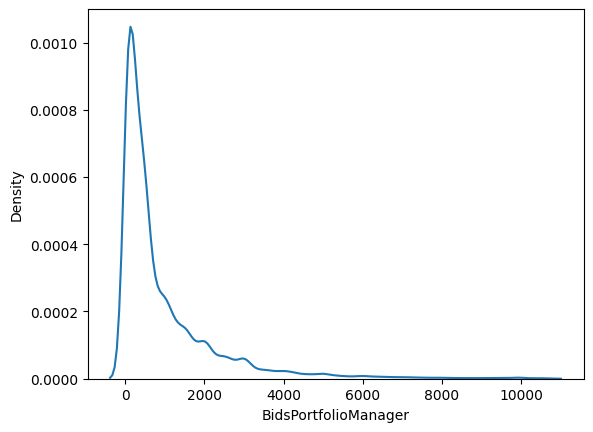

In [16]:
sns.kdeplot(df["BidsPortfolioManager"])
plt.show()

In [17]:
df["BidsApi"].value_counts()

BidsApi
0       85209
5        5653
1        4857
10       3594
2        3217
        ...  
339         1
1822        1
749         1
2222        1
317         1
Name: count, Length: 1002, dtype: int64

In [18]:
mmm(df["BidsApi"])

mean 29.111663656163355
median 0.0
mode 0    0
Name: BidsApi, dtype: int64


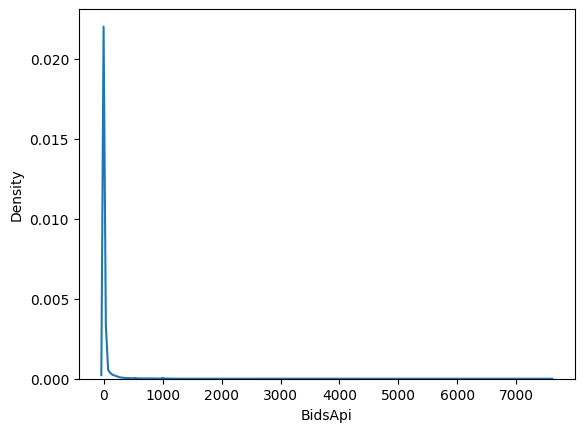

In [19]:
sns.kdeplot(df["BidsApi"])
plt.show()

In [20]:
df["BidsManual"].value_counts()

BidsManual
5.0       9538
0.0       9103
1.0       2391
2.0       1027
3.0        754
          ... 
5945.0       1
4485.0       1
5225.0       1
4480.0       1
6295.0       1
Name: count, Length: 4308, dtype: int64

In [21]:
mmm(df["BidsManual"])

mean 559.332589749422
median 317.0
mode 0    5.0
Name: BidsManual, dtype: float64


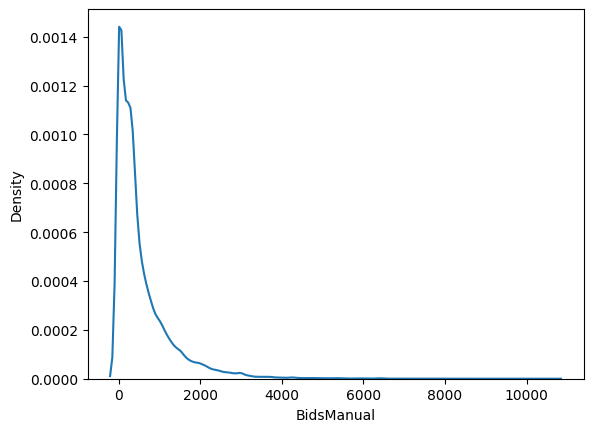

In [22]:
sns.kdeplot(df["BidsManual"])
plt.show()

In [23]:
df["NewCreditCustomer"].value_counts()

NewCreditCustomer
True     77808
False    56721
Name: count, dtype: int64

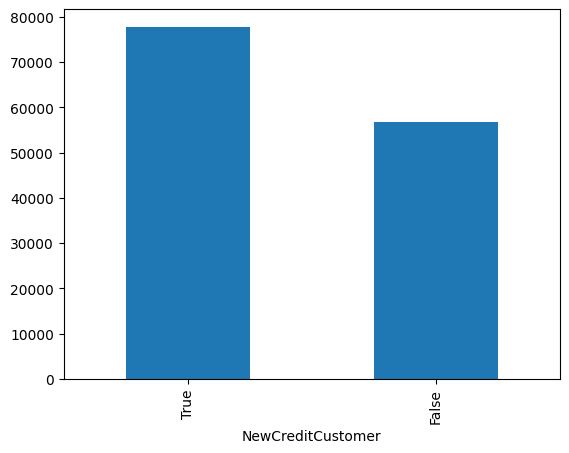

In [24]:
df["NewCreditCustomer"].value_counts().plot(kind="bar")
plt.show()

In [25]:
df["ApplicationSignedHour"].value_counts()

ApplicationSignedHour
12    10874
11    10862
10    10623
14    10197
13    10111
15     9684
16     9180
9      8143
17     7937
18     7006
19     6243
20     5431
8      5161
21     4385
22     3484
7      3110
0      3008
23     2599
6      1891
1      1561
5       945
2       908
4       601
3       585
Name: count, dtype: int64

In [26]:
mmm(df["ApplicationSignedHour"])

mean 13.374640412104453
median 13.0
mode 0    12
Name: ApplicationSignedHour, dtype: int64


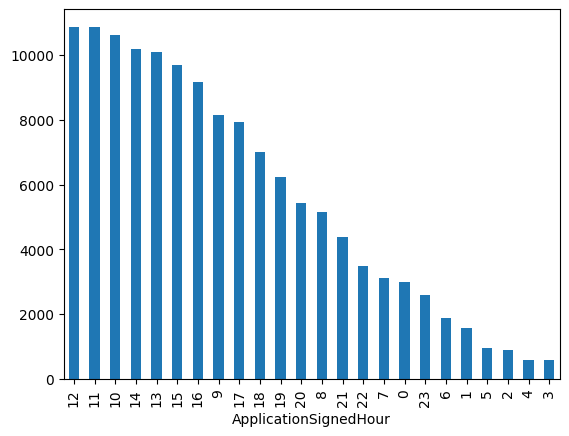

In [27]:
df["ApplicationSignedHour"].value_counts().plot(kind="bar")
plt.show()

In [28]:
df["ApplicationSignedWeekday"].value_counts()

ApplicationSignedWeekday
3    25446
2    23728
5    23033
4    22830
6    19364
1    10272
7     9856
Name: count, dtype: int64

In [29]:
df["VerificationType"].value_counts()

VerificationType
4.0    74572
1.0    48648
3.0     9428
2.0     1828
0.0        8
Name: count, dtype: int64

In [30]:
df["LanguageCode"].value_counts()

LanguageCode
1     64299
4     32155
6     24103
3     12694
2       967
9       295
22        6
5         5
15        1
10        1
13        1
7         1
21        1
Name: count, dtype: int64

In [31]:
df["Age"].value_counts()

Age
34    4083
29    3985
37    3959
31    3959
35    3958
      ... 
77       3
1        2
71       2
76       1
74       1
Name: count, Length: 62, dtype: int64

In [32]:
mmm(df["Age"])

mean 40.819295467891685
median 40.0
mode 0    34
Name: Age, dtype: int64


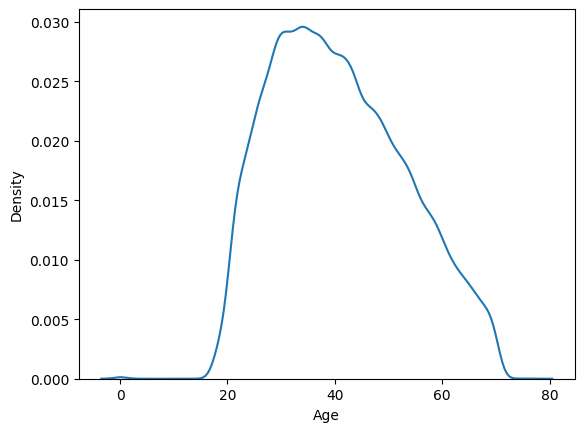

In [33]:
sns.kdeplot(df["Age"])
plt.show()

In [34]:
df["Gender"].value_counts()

Gender
0.0    85650
1.0    38213
2.0    10621
Name: count, dtype: int64

In [35]:
df["Country"].value_counts()

Country
EE    77335
FI    32650
ES    24248
SK      296
Name: count, dtype: int64

In [36]:
mmm(df["AppliedAmount"])

mean 2727.94753966431
median 2125.0
mode 0    530.0
Name: AppliedAmount, dtype: float64


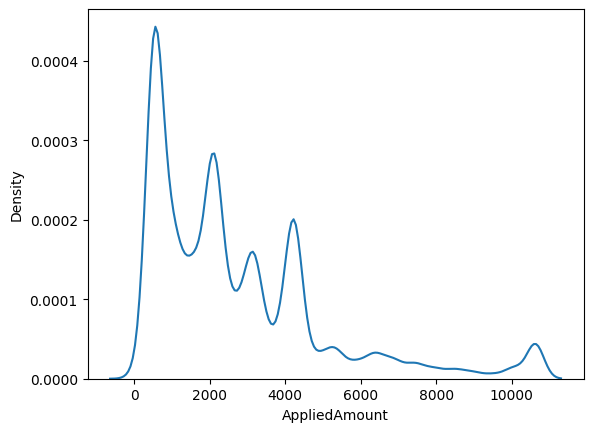

In [37]:
sns.kdeplot(df["AppliedAmount"])
plt.show()

In [38]:
df[df["AppliedAmount"]<50]

,ListedOnUTC,BiddingStartedOn,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,LoanApplicationStartedDate,LoanDate,ContractEndDate,FirstPaymentDate,MaturityDate_Original,MaturityDate_Last,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,DateOfBirth,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,NrOfDependants,EmploymentStatus,EmploymentDurationCurrentEmployer,EmploymentPosition,WorkExperience,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,ActiveScheduleFirstPaymentReached,PlannedPrincipalTillDate,PlannedInterestTillDate,LastPaymentOn,CurrentDebtDaysPrimary,DebtOccuredOn,CurrentDebtDaysSecondary,DebtOccuredOnForSecondary,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,DefaultDate,PrincipalOverdueBySchedule,PlannedPrincipalPostDefault,PlannedInterestPostDefault,EAD1,EAD2,PrincipalRecovery,InterestRecovery,RecoveryStage,StageActiveSince,ModelVersion,Rating,EL_V0,Rating_V0,EL_V1,Rating_V1,Rating_V2,Status,Restructured,ActiveLateCategory,WorseLateCategory,CreditScoreEsMicroL,CreditScoreEsEquifaxRisk,CreditScoreFiAsiakasTietoRiskGrade,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalWriteOffs,InterestAndPenaltyWriteOffs,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsBefoleLoan,PreviousEarlyRepaymentsCountBeforeLoan,GracePeriodStart,GracePeriodEnd,NextPaymentDate,NextPaymentNr,NrOfScheduledPayments,ReScheduledOn,PrincipalDebtServicingCost,InterestAndPenaltyDebtServicingCost,ActiveLateLastPaymentCategory
55,2009-03-16 18:56:52,2009-03-16 18:56:52,0,0,31.9558,True,2009-03-16 18:56:52,2009-03-17,2009-06-07,2009-05-07,2009-05-07,2009-05-07,18,2,2.0,1,23,1985-04-10,0.0,EE,31.9558,31.9558,30.0,1,NaN,HARJU,TALLINN,8,3.0,3.0,0,2.0,NaN,Kokk,2To5Years,NaN,NaN,3400.0,4000.0,0,0.0,0,0.0,0.0,7,True,500.0000,20.4400,2009-04-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,NaN,NaN,NaN,NaN,NaN,31.9558,0.7516,0.0,0.00,0.00,0.00,0,0.0000,0.0000,0.0000,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,NaN
144,2009-05-15 20:24:08,2009-05-15 20:24:08,0,0,38.3471,True,2009-05-15 20:24:08,2009-05-16,2009-06-09,2009-07-10,2009-07-10,2009-07-10,20,6,2.0,1,19,1989-08-11,0.0,EE,38.3470,38.3471,25.0,1,NaN,TARTU,RÕNGU,7,2.0,3.0,1,3.0,UpTo3Years,Transpordi tööline,2To5Years,1.0,NaN,6000.0,6000.0,0,0.0,0,0.0,0.0,10,True,600.0000,22.2900,2009-06-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,NaN,NaN,NaN,NaN,NaN,38.3471,0.6282,0.0,0.00,0.00,0.00,1,51.1268,3.9996,0.0000,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,NaN
249,2009-09-24 16:13:19,2009-09-24 16:13:19,0,0,31.9558,False,2009-09-24 16:13:19,2009-09-25,2009-10-26,2009-10-27,2009-10-27,2009-10-27,17,5,2.0,1,24,1985-04-10,0.0,EE,31.9558,31.9558,29.0,1,NaN,HARJU,TALLINN,0,3.0,3.0,0,2.0,NaN,Kokk,2To5Years,9.0,NaN,3300.0,3900.0,0,0.0,0,0.0,0.0,27,True,500.0000,10.6600,2009-10-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,NaN,NaN,NaN,NaN,NaN,31.9558,0.6302,0.0,0.00,0.00,0.00,1,31.9558,32.7074,0.0000,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,NaN
363,2009-12-03 09:55:23,2009-12-03 09:55:23,0,0,31.9558,False,2009-12-03 09:55:23,2009-12-05,2010-01-11,2010-01-11,2010-01-11,2010-01-11,9,5,2.0,1,22,1987-11-04,0.0,EE,31.9558,31.9558,49.0,1,NaN,HARJU,TALLINN,3,5.0,3.0,0,5.0,UpTo3Years,Tegevjuht,5To10Years,11.0,NaN,20000.0,20000.0,0,0.0,0,0.0,0.0,10,True,500.0000,7.0300,2010-01-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,NaN,NaN,NaN,NaN,NaN,31.9558,0.4493,0.0,0.00,0.00,0.00,3,690.24

In [39]:
mmm(df["Amount"])

mean 2543.87247248177
median 2125.0
mode 0    530.0
Name: Amount, dtype: float64


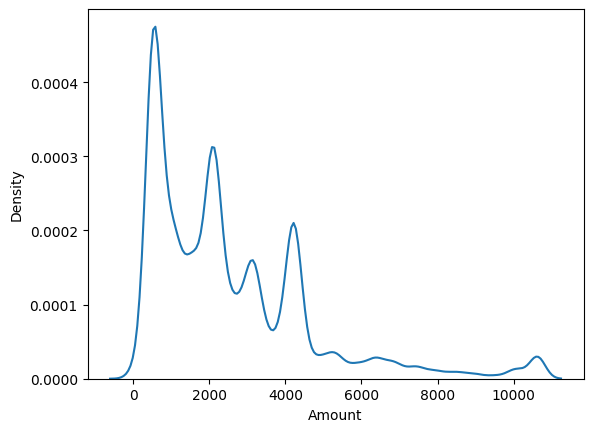

In [40]:
sns.kdeplot(df["Amount"])
plt.show()

In [41]:
mmm(df["Interest"])

mean 35.889583063874696
median 30.93
mode 0    59.73
Name: Interest, dtype: float64


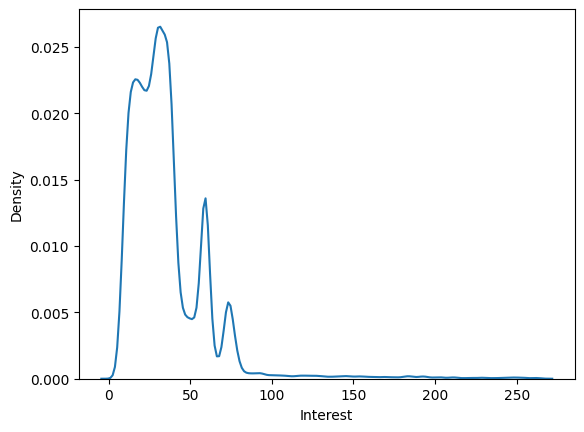

In [42]:
sns.kdeplot(df["Interest"])
plt.show()

In [43]:
df["LoanDuration"].value_counts()

LoanDuration
60    64378
36    45286
48     9532
24     5181
12     3835
18     2467
6      1027
9       994
30      819
3       636
1       177
2        44
5        34
4        27
10       20
20       16
8        14
15       13
7         9
16        7
22        2
14        2
11        1
19        1
21        1
13        1
17        1
42        1
27        1
52        1
38        1
Name: count, dtype: int64

In [44]:
mmm(df["LoanDuration"])

mean 46.151573266730594
median 48.0
mode 0    60
Name: LoanDuration, dtype: int64


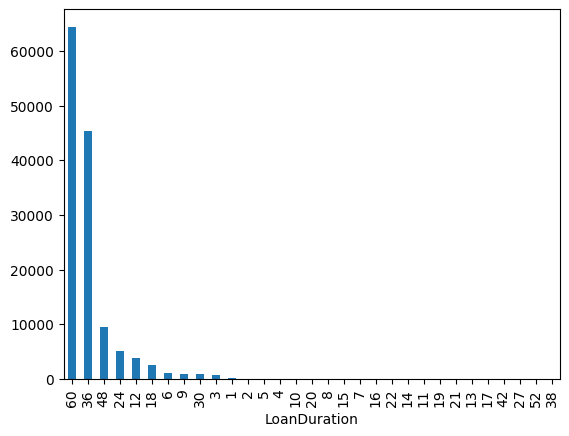

In [45]:
df["LoanDuration"].value_counts().plot(kind="bar")
plt.show()

In [46]:
df["MonthlyPayment"].value_counts()

MonthlyPayment
0.00      3627
237.84    2321
113.31    2134
138.34    1628
184.45    1377
          ... 
322.43       1
594.12       1
441.24       1
910.90       1
126.31       1
Name: count, Length: 25281, dtype: int64

In [47]:
mmm(df["MonthlyPayment"])

mean 119.0834428678702
median 97.38
mode 0    0.0
Name: MonthlyPayment, dtype: float64


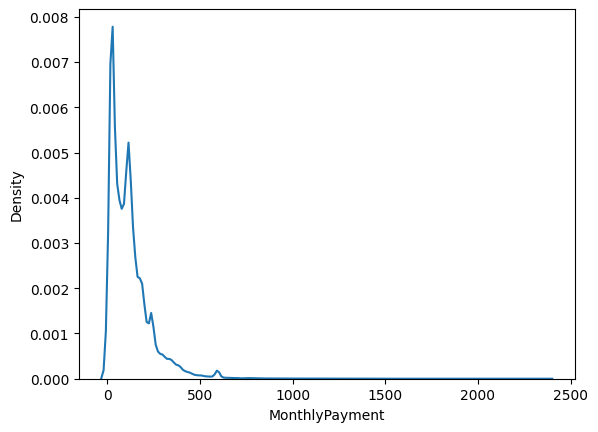

In [48]:
sns.kdeplot(df["MonthlyPayment"])
plt.show()

In [49]:
df["County"].value_counts()

County
Harju maakond         22224
HARJU                  8108
Tartu maakond          6181
UUSIMAA                6076
Ida-Viru maakond       4197
                      ...  
KILVAKKALA                1
IRUN GIPUZKOA             1
PÄRNUMAA   PÄRNU          1
ETELÄ - POHJANMAA         1
POHJOIS-POHJOINMAA        1
Name: count, Length: 1010, dtype: int64

In [50]:
df["City"].nunique()

7733

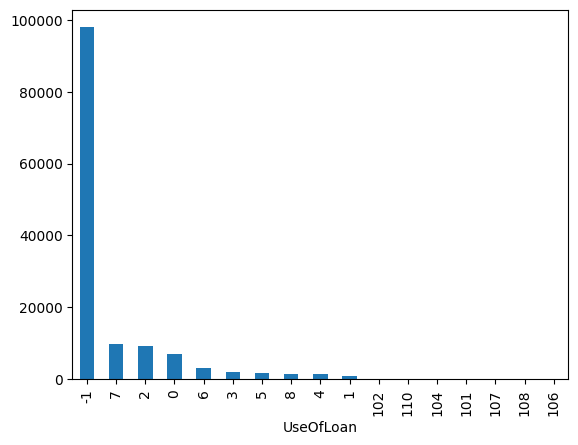

In [51]:
df["UseOfLoan"].value_counts().plot(kind="bar")
plt.show()

In [52]:
df["Education"].value_counts()

Education
 4.0    51330
 5.0    35398
 3.0    29260
 1.0    12057
 2.0     6427
 0.0        8
-1.0        4
Name: count, dtype: int64

In [53]:
df["MaritalStatus"].value_counts()

MaritalStatus
-1.0    97946
 3.0    12400
 1.0    10752
 2.0     9400
 4.0     3377
 5.0      601
 0.0        8
Name: count, dtype: int64

In [54]:
df["NrOfDependants"].value_counts()

NrOfDependants
0         15152
1          6144
0.0        4893
2          3655
1.0        2196
2.0        1375
3          1175
3.0         422
4           307
4.0         115
5            93
5.0          25
6            16
7            10
6.0           7
10Plus        6
7.0           5
8.0           2
10            2
Name: count, dtype: int64

In [55]:
df["EmploymentStatus"].value_counts()

EmploymentStatus
-1.0    97946
 3.0    30060
 5.0     2007
 6.0     1800
 4.0     1303
 2.0     1184
 0.0       32
Name: count, dtype: int64

In [56]:
df["EmploymentDurationCurrentEmployer"].value_counts()

EmploymentDurationCurrentEmployer
MoreThan5Years    52089
UpTo5Years        28411
UpTo1Year         24187
Retiree            7552
UpTo2Years         6498
UpTo3Years         5435
Other              5048
UpTo4Years         3684
TrialPeriod         749
Name: count, dtype: int64

In [57]:
df["WorkExperience"].value_counts()

WorkExperience
15To25Years        7902
5To10Years         7834
10To15Years        6900
MoreThan25Years    6675
2To5Years          5122
LessThan2Years     2089
Name: count, dtype: int64

In [58]:
df["OccupationArea"].value_counts()

OccupationArea
-1.0     97997
 1.0      8421
 7.0      3587
 6.0      3312
 3.0      3198
 8.0      2462
 17.0     2424
 9.0      2262
 10.0     1933
 15.0     1684
 16.0     1430
 11.0     1148
 19.0     1000
 14.0      843
 18.0      619
 4.0       587
 13.0      564
 12.0      477
 5.0       362
 2.0       122
 0.0        11
Name: count, dtype: int64

In [59]:
df["HomeOwnershipType"].value_counts()

HomeOwnershipType
 1.0     47334
 3.0     29579
 2.0     20780
 8.0     15457
 10.0     7956
 4.0      4582
 7.0      3337
 6.0      1618
 5.0      1442
 9.0       743
 0.0        46
-1.0         3
Name: count, dtype: int64

In [60]:
df["IncomeFromPrincipalEmployer"].value_counts()

IncomeFromPrincipalEmployer
0.0        100261
1000.0       1060
1200.0        962
800.0         814
1500.0        793
            ...  
1819.0          1
50000.0         1
2321.0          1
2864.0          1
2147.0          1
Name: count, Length: 2922, dtype: int64

In [61]:
mmm(df["IncomeFromPrincipalEmployer"])

mean 437.143383582722
median 0.0
mode 0    0.0
Name: IncomeFromPrincipalEmployer, dtype: float64


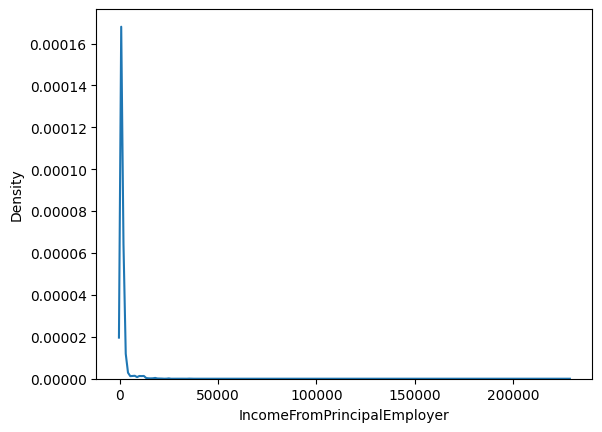

In [62]:
sns.kdeplot(df["IncomeFromPrincipalEmployer"])
plt.show()

In [63]:
df["IncomeTotal"].value_counts()

IncomeTotal
1200.0    5606
1000.0    4973
1500.0    4160
1100.0    3526
2000.0    3488
          ... 
5480.0       1
4706.0       1
5384.0       1
5470.0       1
6150.0       1
Name: count, Length: 4149, dtype: int64

In [64]:
mmm(df["IncomeTotal"])

mean 1724.1500152383499
median 1250.0
mode 0    1200.0
Name: IncomeTotal, dtype: float64


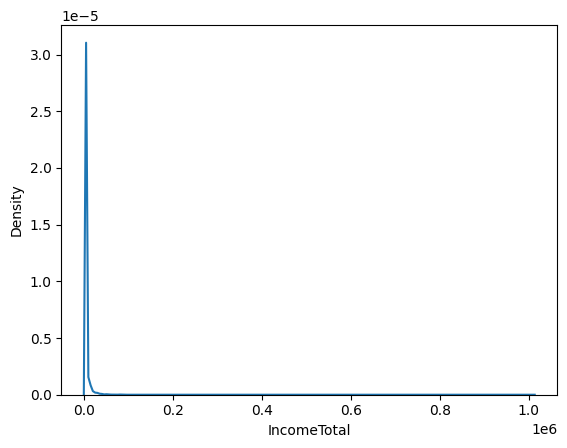

In [65]:
sns.kdeplot(df["IncomeTotal"])
plt.show()

In [66]:
df["ExistingLiabilities"].value_counts()

ExistingLiabilities
1     26891
0     26067
2     21018
3     15244
4     11494
5      8639
6      6451
7      4847
8      3569
9      2680
10     1914
11     1485
12     1094
13      796
14      603
15      425
16      317
17      245
18      189
19      130
20      100
21       69
22       66
23       51
24       36
25       23
26       18
27       15
28       10
31       10
30        8
29        8
32        7
33        3
36        2
39        2
35        1
34        1
40        1
Name: count, dtype: int64

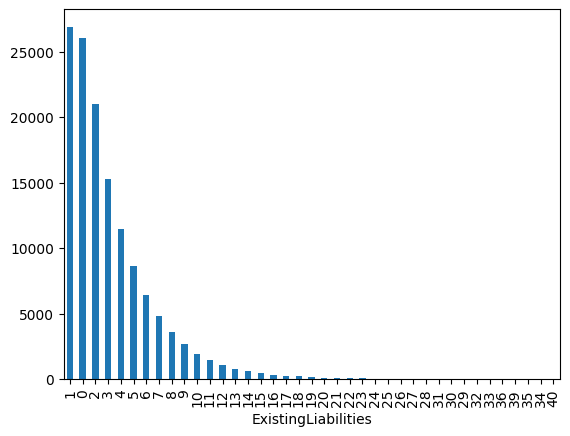

In [67]:
df["ExistingLiabilities"].value_counts().plot(kind="bar")
plt.show()

In [68]:
df["LiabilitiesTotal"].value_counts()

LiabilitiesTotal
0.00      27183
250.00     1607
350.00     1258
300.00      831
500.00      692
          ...  
855.69        1
156.78        1
732.79        1
956.48        1
531.03        1
Name: count, Length: 48712, dtype: int64

In [69]:
mmm(df["LiabilitiesTotal"])

mean 562.0270103843782
median 316.38
mode 0    0.0
Name: LiabilitiesTotal, dtype: float64


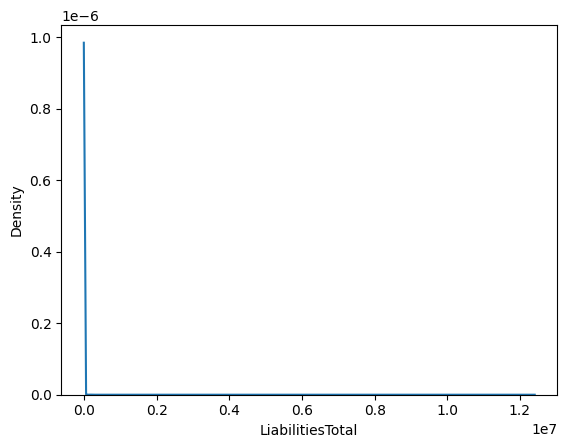

In [70]:
sns.kdeplot(df["LiabilitiesTotal"])
plt.show()

In [71]:
df["RefinanceLiabilities"].value_counts()

RefinanceLiabilities
0     125221
1       3557
2       2070
3       1334
4        858
5        531
6        335
7        256
8        126
9         91
10        54
12        26
11        23
13        21
14        12
15         5
19         3
16         3
17         1
18         1
23         1
Name: count, dtype: int64

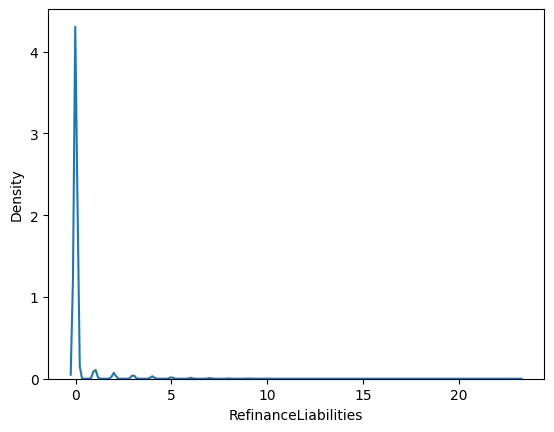

In [72]:
sns.kdeplot(df["RefinanceLiabilities"])
plt.show()

In [73]:
df["DebtToIncome"].value_counts()

DebtToIncome
0.00     100177
20.00        29
69.89        23
69.98        23
69.95        22
          ...  
63.64         1
54.82         1
67.25         1
62.21         1
56.96         1
Name: count, Length: 6789, dtype: int64

In [74]:
mmm(df["DebtToIncome"])

mean 7.7690235269623145
median 0.0
mode 0    0.0
Name: DebtToIncome, dtype: float64


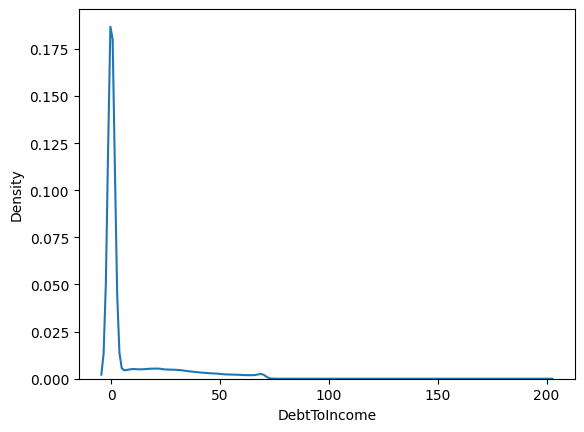

In [75]:
sns.kdeplot(df["DebtToIncome"])
plt.show()

In [76]:
df["FreeCash"].value_counts()

FreeCash
0.00      100174
250.00        40
280.00        31
288.00        30
251.00        29
           ...  
200.89         1
718.46         1
179.19         1
37.85          1
74.86          1
Name: count, Length: 23658, dtype: int64

In [77]:
mmm(df["FreeCash"])

mean 122.23911937479552
median 0.0
mode 0    0.0
Name: FreeCash, dtype: float64


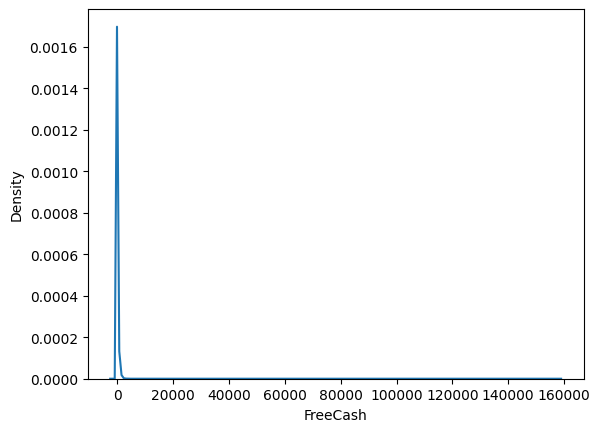

In [78]:
sns.kdeplot(df["FreeCash"])
plt.show()

In [79]:
df["MonthlyPaymentDay"].value_counts()

MonthlyPaymentDay
10    13754
15    12137
1     11759
13    10991
3      9371
8      8639
18     8014
4      6709
5      6094
11     5041
12     4585
20     4470
25     4173
6      3697
26     3541
2      3137
7      2787
9      2508
16     2282
17     2058
23     1957
14     1685
27     1629
19     1097
22      796
21      782
24      667
28      157
0        12
Name: count, dtype: int64

In [80]:
df["PlannedPrincipalTillDate"].value_counts()

PlannedPrincipalTillDate
0.00       2418
530.00     1428
1000.00     879
500.00      852
2000.00     787
           ... 
237.02        1
7439.96       1
492.36        1
1325.59       1
972.69        1
Name: count, Length: 30407, dtype: int64

In [81]:
mmm(df["PlannedPrincipalTillDate"])

mean 994.5580140729725
median 445.3
mode 0    0.0
Name: PlannedPrincipalTillDate, dtype: float64


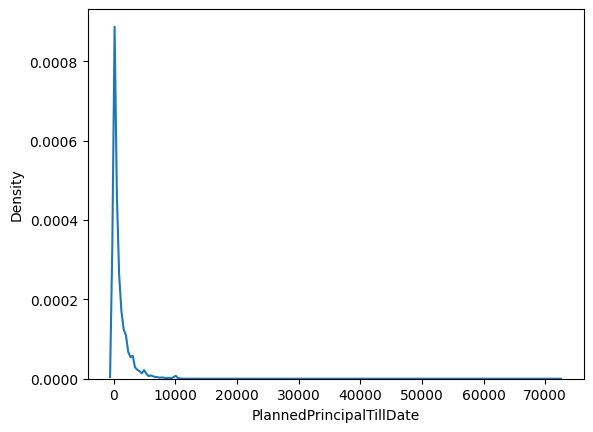

In [82]:
sns.kdeplot(df["PlannedPrincipalTillDate"])
plt.show()

In [83]:
df["PlannedInterestTillDate"].value_counts()

PlannedInterestTillDate
0.00       6977
530.00     2817
2125.00     866
35.67       758
4250.00     652
           ... 
1237.26       1
148.78        1
1962.32       1
3008.27       1
2428.44       1
Name: count, Length: 57491, dtype: int64

In [84]:
mmm(df["PlannedInterestTillDate"])

mean 708.8837982425509
median 212.0
mode 0    0.0
Name: PlannedInterestTillDate, dtype: float64


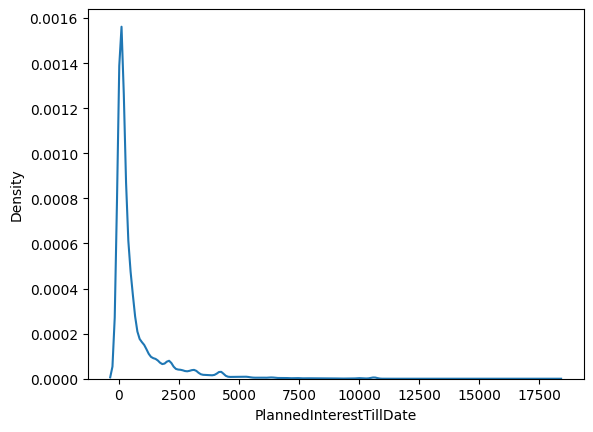

In [85]:
sns.kdeplot(df["PlannedInterestTillDate"])
plt.show()

In [86]:
mmm(df["CurrentDebtDaysPrimary"])

mean 593.4480192918093
median 415.0
mode 0    6.0
Name: CurrentDebtDaysPrimary, dtype: float64


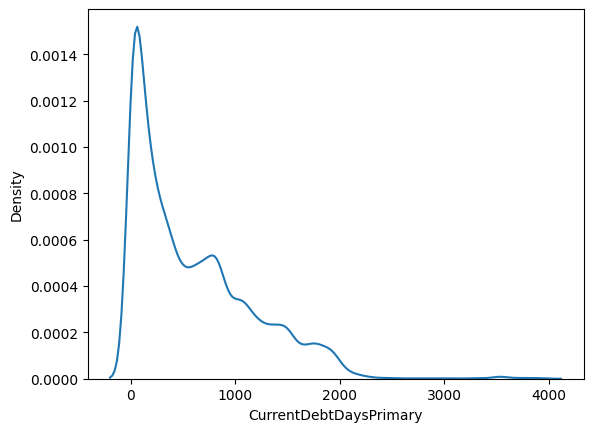

In [87]:
sns.kdeplot(df["CurrentDebtDaysPrimary"])
plt.show()

In [88]:
mmm(df["CurrentDebtDaysSecondary"])

mean 612.733052631579
median 412.0
mode 0    6.0
Name: CurrentDebtDaysSecondary, dtype: float64


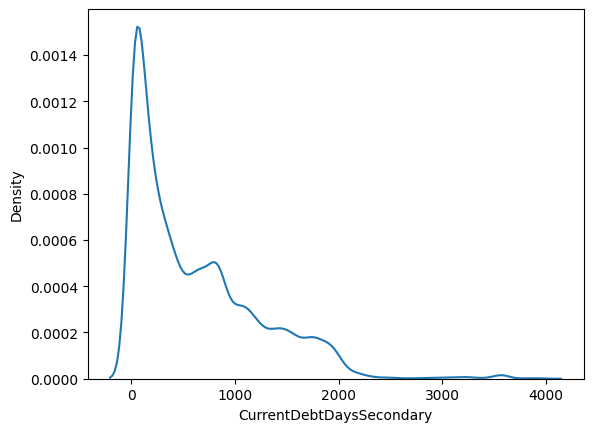

In [89]:
sns.kdeplot(df["CurrentDebtDaysSecondary"])
plt.show()

In [90]:
df["ExpectedLoss"].nunique()

43852

In [91]:
mmm(df["ExpectedLoss"])

mean 0.1492548107589651
median 0.1233980769253732
mode 0    0.15
Name: ExpectedLoss, dtype: float64


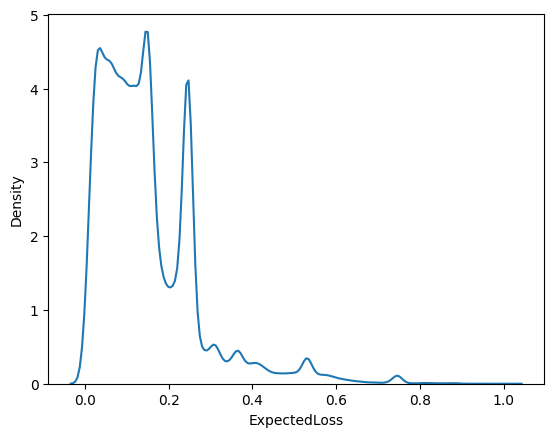

In [92]:
sns.kdeplot(df["ExpectedLoss"])
plt.show()

In [93]:
df["LossGivenDefault"].value_counts()

LossGivenDefault
0.000000    44459
0.580000    10484
0.650000     9554
0.900000     7937
0.681751     4842
            ...  
0.733346        1
0.548106        1
0.421203        1
0.864574        1
0.566904        1
Name: count, Length: 589, dtype: int64

In [94]:
mmm(df["LossGivenDefault"])

mean 0.4090646832413615
median 0.5067481290809019
mode 0    0.0
Name: LossGivenDefault, dtype: float64


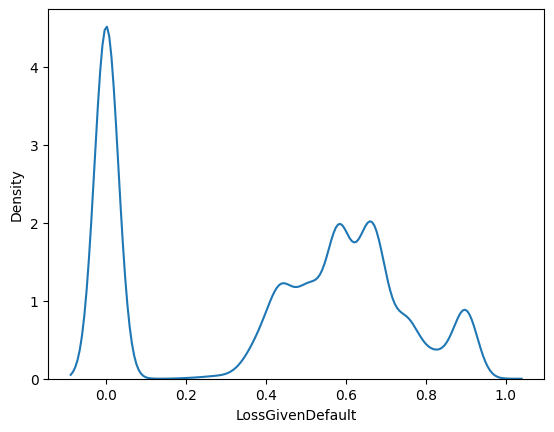

In [95]:
sns.kdeplot(df["LossGivenDefault"])
plt.show()

In [96]:
mmm(df["ExpectedReturn"])

mean 0.13655844788257313
median 0.1340492046946886
mode 0    0.141
Name: ExpectedReturn, dtype: float64


In [97]:
df["ExpectedReturn"].value_counts()

ExpectedReturn
0.141000    6601
0.187807    4804
0.188868    2697
0.202026    2249
0.206463    1070
            ... 
0.097380       1
0.093496       1
0.117047       1
0.213057       1
0.188765       1
Name: count, Length: 51144, dtype: int64

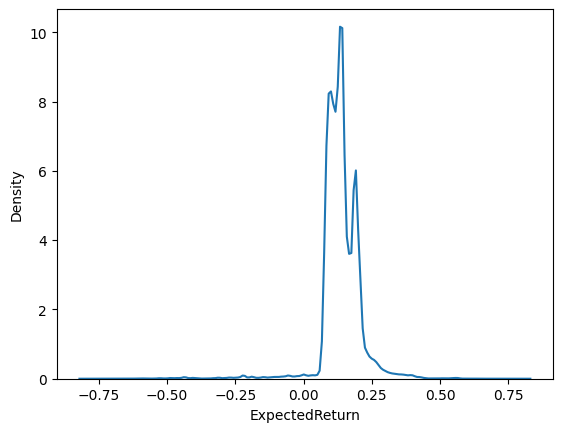

In [98]:
sns.kdeplot(df["ExpectedReturn"])
plt.show()

In [99]:
mmm(df["ProbabilityOfDefault"])

mean 0.2524340489627976
median 0.2341402532842665
mode 0    0.39925
Name: ProbabilityOfDefault, dtype: float64


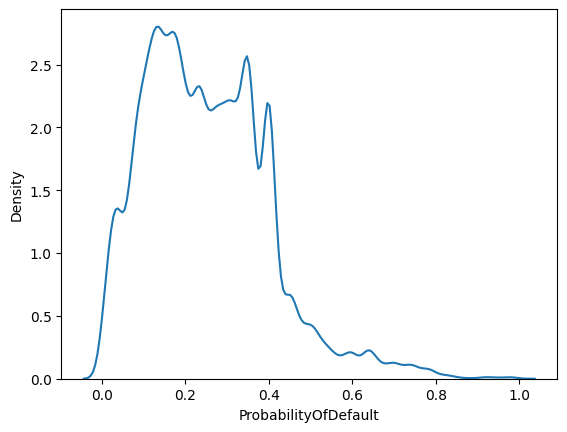

In [100]:
sns.kdeplot(df["ProbabilityOfDefault"])
plt.show()

In [101]:
df["PrincipalOverdueBySchedule"].value_counts()

PrincipalOverdueBySchedule
0.00       75003
35.67        132
21.53        126
14.02        114
27.85        114
           ...  
497.75         1
1155.64        1
971.85         1
173.21         1
897.50         1
Name: count, Length: 30597, dtype: int64

In [102]:
mmm(df["PrincipalOverdueBySchedule"])

mean 232.95991847993184
median 0.0
mode 0    0.0
Name: PrincipalOverdueBySchedule, dtype: float64


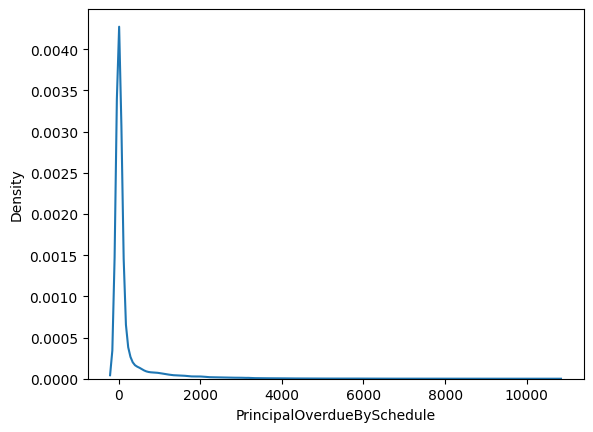

In [103]:
sns.kdeplot(df["PrincipalOverdueBySchedule"])
plt.show()

In [104]:
mmm(df["PlannedPrincipalPostDefault"])

mean 849.8386946289176
median 322.97
mode 0    0.0
Name: PlannedPrincipalPostDefault, dtype: float64


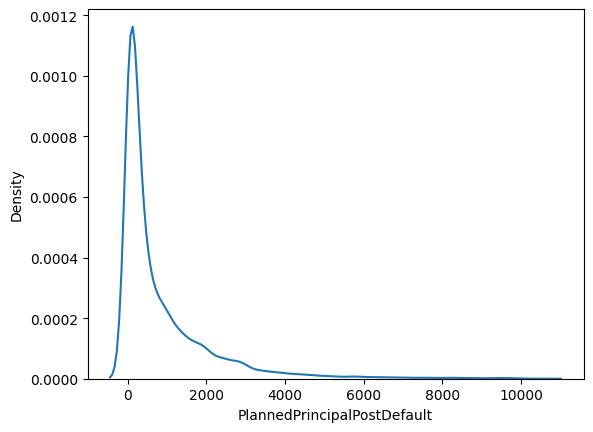

In [105]:
sns.kdeplot(df["PlannedPrincipalPostDefault"])
plt.show()

In [106]:
mmm(df["PlannedInterestPostDefault"])

mean 1099.9822425725267
median 594.54
mode 0    0.0
Name: PlannedInterestPostDefault, dtype: float64


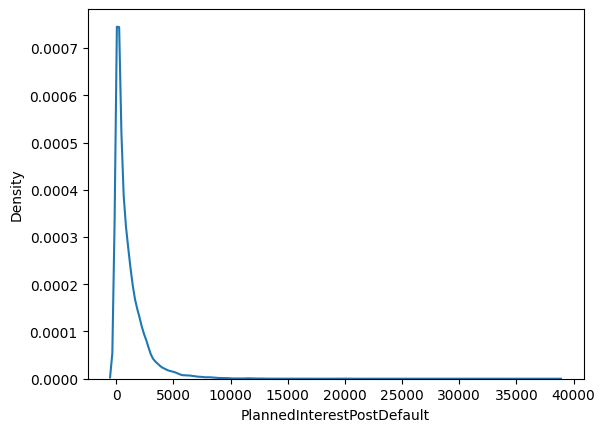

In [107]:
sns.kdeplot(df["PlannedInterestPostDefault"])
plt.show()

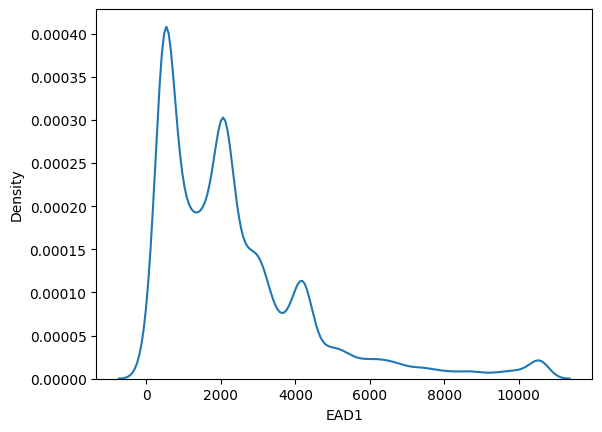

In [108]:
sns.kdeplot(df["EAD1"])
plt.show()

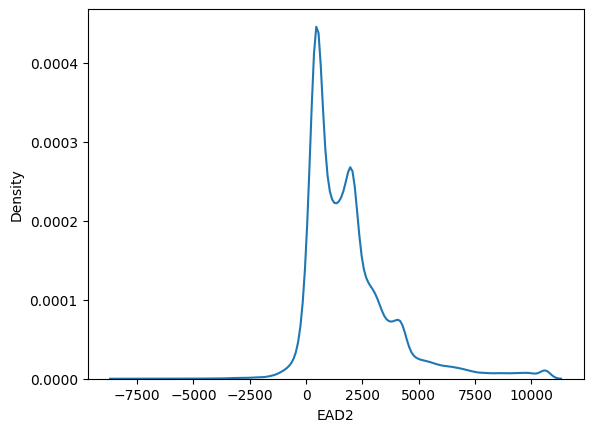

In [109]:
sns.kdeplot(df["EAD2"])
plt.show()

In [110]:
df["PrincipalRecovery"].value_counts()

PrincipalRecovery
0.00       23699
530.00        55
500.00        33
1000.00       27
105.36        21
           ...  
494.46         1
202.92         1
148.40         1
31.21          1
1362.50        1
Name: count, Length: 16903, dtype: int64

In [111]:
mmm(df["PrincipalRecovery"])

mean 336.21389291855996
median 0.0
mode 0    0.0
Name: PrincipalRecovery, dtype: float64


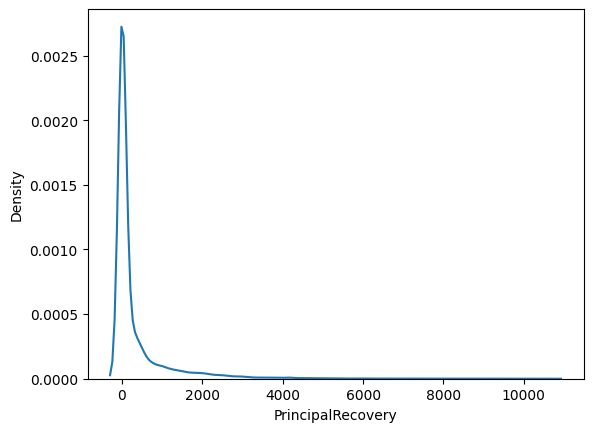

In [112]:
sns.kdeplot(df["PrincipalRecovery"])
plt.show()

In [113]:
df["InterestRecovery"].value_counts()

InterestRecovery
0.00      41893
30.64         2
51.55         2
360.40        2
130.46        2
          ...  
360.58        1
155.97        1
867.49        1
54.35         1
173.52        1
Name: count, Length: 1018, dtype: int64

In [114]:
mmm(df["InterestRecovery"])

mean 15.150364972620297
median 0.0
mode 0    0.0
Name: InterestRecovery, dtype: float64


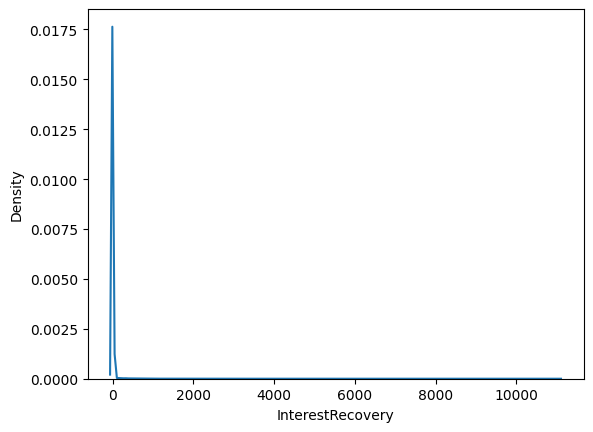

In [115]:
sns.kdeplot(df["InterestRecovery"])
plt.show()

In [116]:
df["RecoveryStage"].value_counts()

RecoveryStage
1.0    40672
2.0    36569
Name: count, dtype: int64

In [117]:
df["ModelVersion"].value_counts()

ModelVersion
6.0    71640
5.0    25822
1.0    12922
2.0     7946
4.0     7861
0.0     4663
3.0     1039
Name: count, dtype: int64

In [118]:
df["Rating"].value_counts()

Rating
E     24461
F     24161
D     21558
C     19845
B     14636
HR    14122
A      6905
AA     6111
Name: count, dtype: int64

In [119]:
df["Rating_V0"].value_counts()

Rating_V0
HR    1224
D      793
C      668
B      552
E      440
F      438
A      344
AA     110
Name: count, dtype: int64

In [120]:
df["Rating_V1"].value_counts()

Rating_V1
HR    3011
D     2365
C     2360
E     1899
B     1276
F     1193
A      590
AA     228
Name: count, dtype: int64

In [121]:
df["Rating_V2"].value_counts()

Rating_V2
HR    7996
C     3544
D     3454
E     3204
F     2895
B     2586
A      895
AA     569
Name: count, dtype: int64

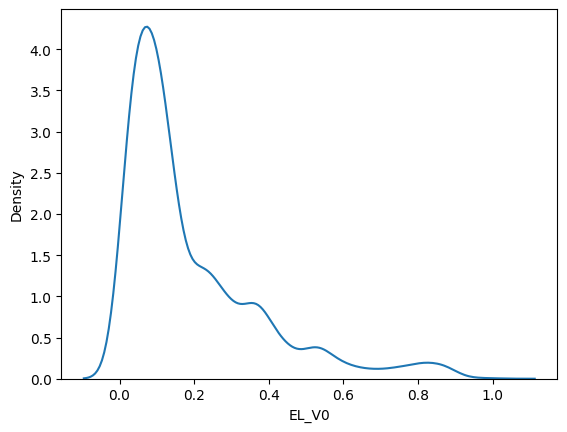

In [122]:
sns.kdeplot(df["EL_V0"])
plt.show()

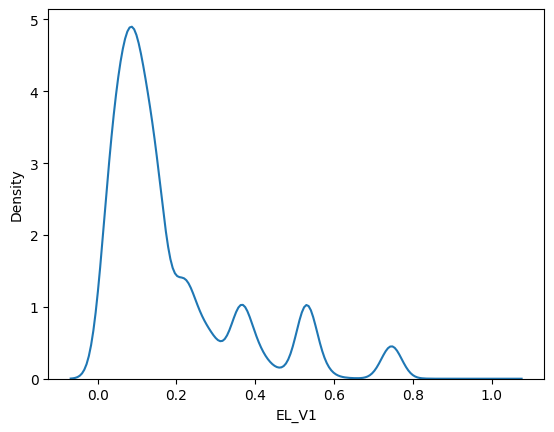

In [123]:
sns.kdeplot(df["EL_V1"])
plt.show()

In [124]:
df["Status"].value_counts()

Status
Current    57135
Late       45772
Repaid     31622
Name: count, dtype: int64

In [125]:
df["Restructured"].value_counts()

Restructured
False    106900
True      27629
Name: count, dtype: int64

In [126]:
df["ActiveLateCategory"].value_counts()

ActiveLateCategory
180+       32859
31-60       2707
16-30       2613
61-90       2268
91-120      1763
121-150     1725
8-15        1603
151-180     1520
1-7         1460
Name: count, dtype: int64

In [127]:
df["WorseLateCategory"].value_counts()

WorseLateCategory
180+       34789
1-7        23738
31-60       7937
16-30       6790
8-15        6269
61-90       3865
91-120      2062
121-150     1938
151-180     1685
Name: count, dtype: int64

In [128]:
df["CreditScoreEsMicroL"].value_counts()

CreditScoreEsMicroL
M      92439
M1      4321
M5      2432
M2      1723
M3      1644
M4      1540
M6       560
M8       102
M9        70
M7        69
M10       55
Name: count, dtype: int64

In [129]:
df["CreditScoreEsEquifaxRisk"].value_counts()

CreditScoreEsEquifaxRisk
B      6596
C      3324
A      1746
AA      310
D       195
AAA      48
Name: count, dtype: int64

In [130]:
df["CreditScoreFiAsiakasTietoRiskGrade"].value_counts()

CreditScoreFiAsiakasTietoRiskGrade
3      10543
4       6883
RL2     4125
2       3002
5       2620
RL1     1663
3.0      909
4.0      632
1        589
RL3      369
6        353
5.0      251
2.0      223
RL4      147
RL5      113
6.0       45
7         24
1.0       22
7.0        3
RL0        1
8          1
Name: count, dtype: int64

In [131]:
df["CreditScoreEeMini"].value_counts()

CreditScoreEeMini
1000.0    56046
800.0      5718
900.0      4887
700.0      2532
600.0      2462
500.0        76
0.0           1
Name: count, dtype: int64

In [132]:
mmm(df["PrincipalPaymentsMade"])

mean 761.4761618721614
median 208.1
mode 0    0.0
Name: PrincipalPaymentsMade, dtype: float64


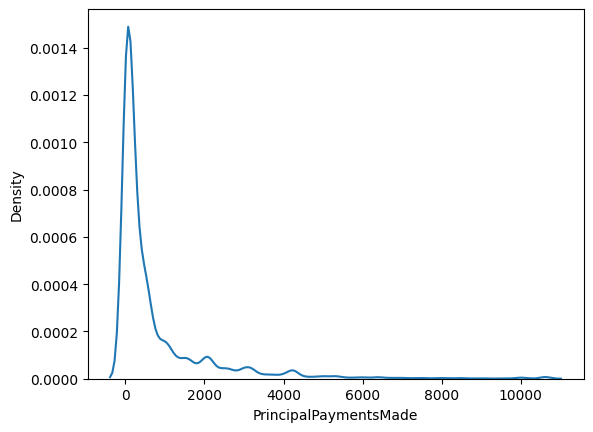

In [133]:
sns.kdeplot(df["PrincipalPaymentsMade"])
plt.show()

In [134]:
mmm(df["InterestAndPenaltyPaymentsMade"])

mean 488.3971017297386
median 181.21
mode 0    0.0
Name: InterestAndPenaltyPaymentsMade, dtype: float64


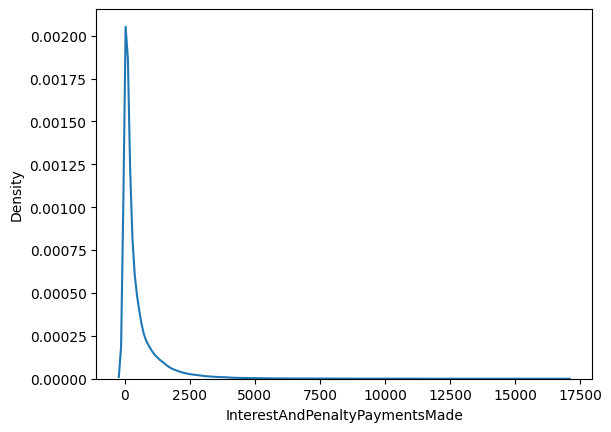

In [135]:
sns.kdeplot(df["InterestAndPenaltyPaymentsMade"])
plt.show()

In [136]:
df["PrincipalWriteOffs"].value_counts()

PrincipalWriteOffs
0.00        56238
0.01            5
2500.00         3
10629.99        3
114.62          3
            ...  
81.30           1
674.90          1
413.87          1
886.07          1
742.46          1
Name: count, Length: 2815, dtype: int64

In [137]:
mmm(df["PrincipalWriteOffs"])

mean 24.574727629420412
median 0.0
mode 0    0.0
Name: PrincipalWriteOffs, dtype: float64


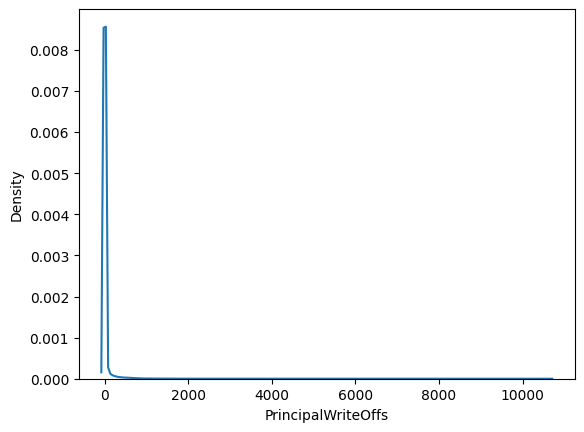

In [138]:
sns.kdeplot(df["PrincipalWriteOffs"])
plt.show()

In [139]:
mmm(df["PrincipalBalance"])

mean 1769.2811039255475
median 1061.99
mode 0    0.0
Name: PrincipalBalance, dtype: float64


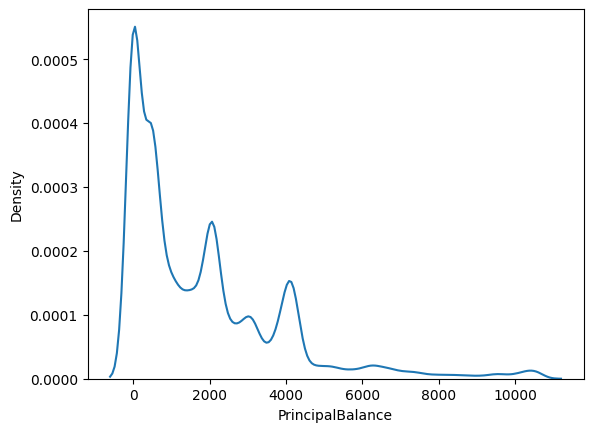

In [140]:
sns.kdeplot(df["PrincipalBalance"])
plt.show()

In [141]:
mmm(df["InterestAndPenaltyBalance"])

mean 701.567107463818
median 0.0
mode 0    0.0
Name: InterestAndPenaltyBalance, dtype: float64


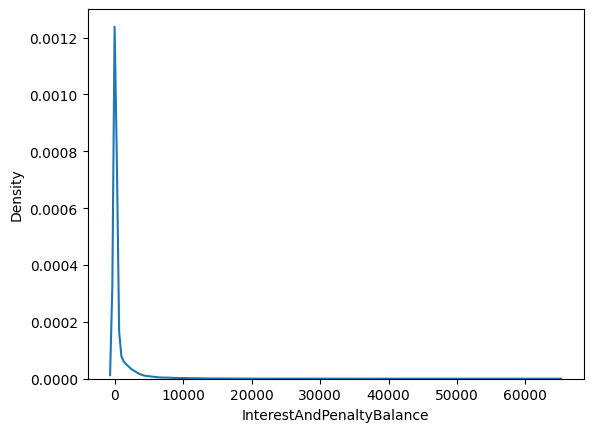

In [142]:
sns.kdeplot(df["InterestAndPenaltyBalance"])
plt.show()

In [143]:
df["NoOfPreviousLoansBeforeLoan"].value_counts()

NoOfPreviousLoansBeforeLoan
0     66653
1     26449
2     14257
3      8383
4      5542
5      3836
6      2698
7      1958
8      1424
9      1018
10      713
11      493
12      340
13      234
14      169
15      114
16       75
17       58
18       39
19       23
20       18
21       11
22        9
23        7
24        6
25        2
Name: count, dtype: int64

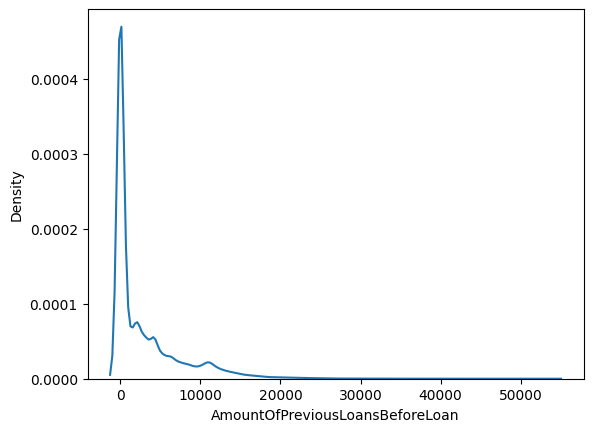

In [144]:
sns.kdeplot(df["AmountOfPreviousLoansBeforeLoan"])
plt.show()

In [145]:
df["PreviousRepaymentsBeforeLoan"].value_counts()

PreviousRepaymentsBeforeLoan
0.00       30658
31.80         22
21.20         18
531.05        17
2030.05       17
           ...  
1215.32        1
1872.26        1
5883.50        1
1177.03        1
1080.22        1
Name: count, Length: 47991, dtype: int64

In [146]:
mmm(df["PreviousRepaymentsBeforeLoan"])

mean 928.3955479292531
median 197.98000000000002
mode 0    0.0
Name: PreviousRepaymentsBeforeLoan, dtype: float64


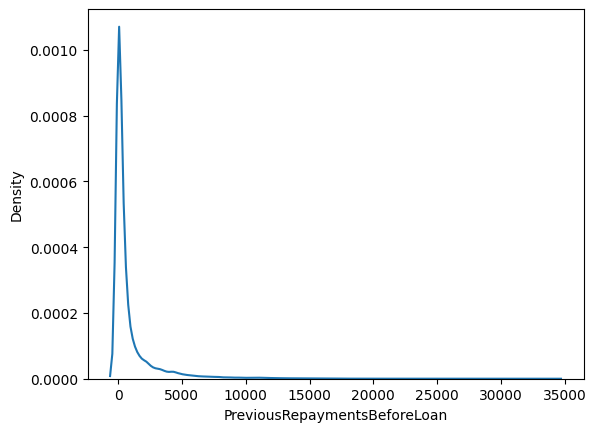

In [147]:
sns.kdeplot(df["PreviousRepaymentsBeforeLoan"])
plt.show()

In [148]:
df["PreviousEarlyRepaymentsBefoleLoan"].value_counts()

PreviousEarlyRepaymentsBefoleLoan
0.0       52309
500.0       561
1000.0      412
3000.0      405
2000.0      289
          ...  
760.0         1
5990.0        1
1785.0        1
190.0         1
8385.0        1
Name: count, Length: 495, dtype: int64

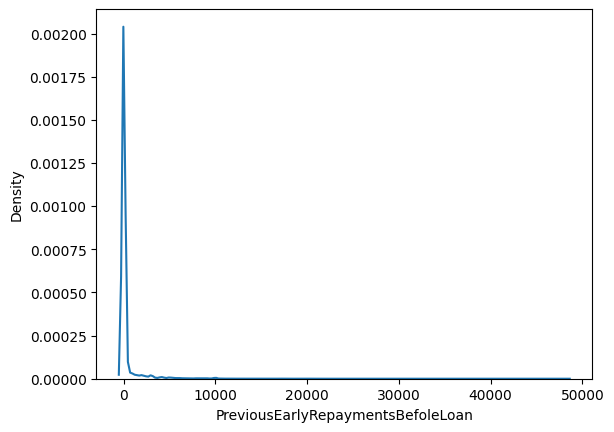

In [149]:
sns.kdeplot(df["PreviousEarlyRepaymentsBefoleLoan"])
plt.show()

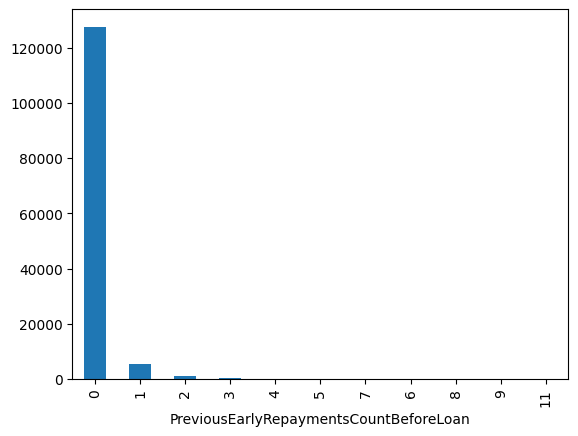

In [150]:
df["PreviousEarlyRepaymentsCountBeforeLoan"].value_counts().plot(kind="bar")
plt.show()

In [151]:
df["NextPaymentNr"].value_counts()

NextPaymentNr
0.0     32144
2.0      8918
3.0      8178
4.0      7787
1.0      5869
        ...  
57.0       30
55.0       23
43.0       22
42.0       19
56.0       10
Name: count, Length: 61, dtype: int64

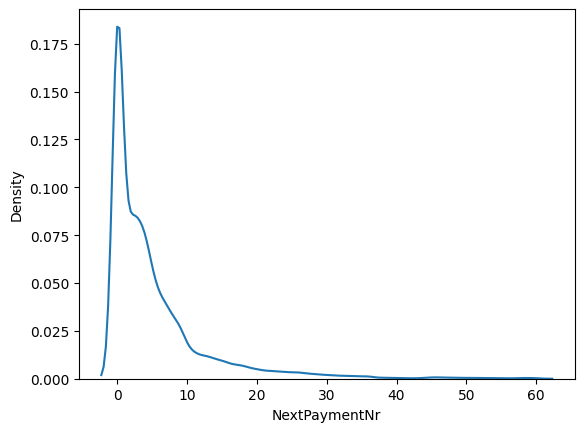

In [152]:
sns.kdeplot(df["NextPaymentNr"])
plt.show()

In [153]:
df["NrOfScheduledPayments"].value_counts()

NrOfScheduledPayments
60.0    52350
36.0    25002
48.0     5768
51.0     2153
54.0     1948
        ...  
5.0         8
63.0        5
7.0         4
66.0        3
2.0         1
Name: count, Length: 64, dtype: int64

In [154]:
df["NrOfScheduledPayments"].mode()

0    60.0
Name: NrOfScheduledPayments, dtype: float64

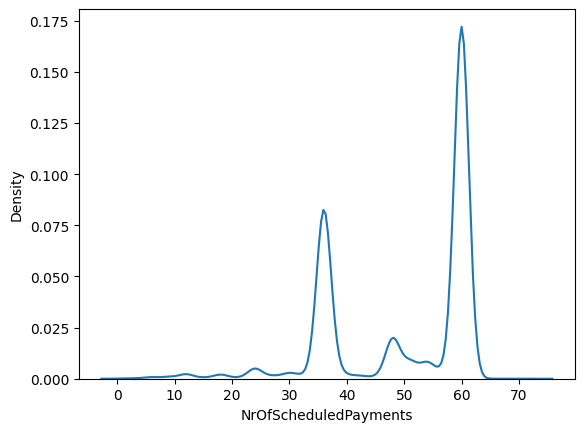

In [155]:
sns.kdeplot(df["NrOfScheduledPayments"])
plt.show()

In [156]:
df["PrincipalDebtServicingCost"].value_counts()

PrincipalDebtServicingCost
0.00      57794
123.26        2
108.71        2
101.38        2
8.20          2
          ...  
39.35         1
188.59        1
27.36         1
0.35          1
30.16         1
Name: count, Length: 1310, dtype: int64

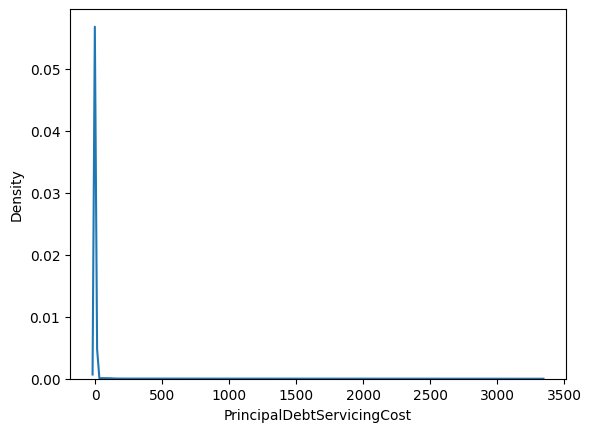

In [157]:
sns.kdeplot(df["PrincipalDebtServicingCost"])
plt.show()

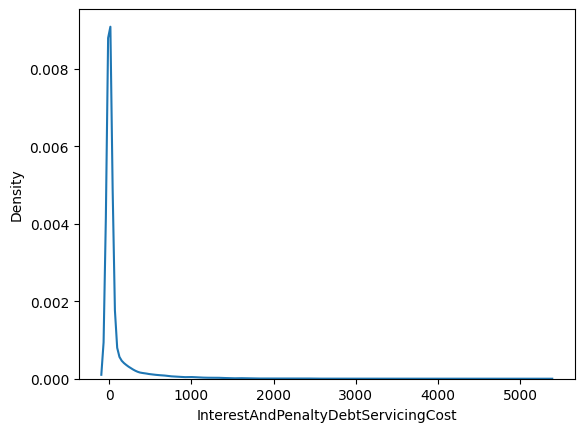

In [158]:
sns.kdeplot(df["InterestAndPenaltyDebtServicingCost"])
plt.show()

In [159]:
df["ActiveLateLastPaymentCategory"].value_counts()

ActiveLateLastPaymentCategory
180+       24449
31-60       5215
16-30       4350
8-15        3813
1-7         3576
61-90       3520
91-120      2641
121-150     2502
151-180     2184
Name: count, dtype: int64

In [160]:
df["ExpectedLoss"].value_counts()

ExpectedLoss
0.150000    6699
0.242647    4804
0.248401    2697
0.249394    2249
0.530223     798
            ... 
0.230889       1
0.157698       1
0.246889       1
0.182921       1
0.116235       1
Name: count, Length: 43852, dtype: int64

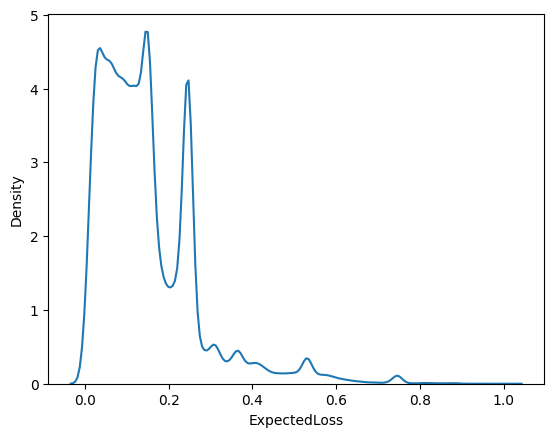

In [161]:
sns.kdeplot(df["ExpectedLoss"])
plt.show()

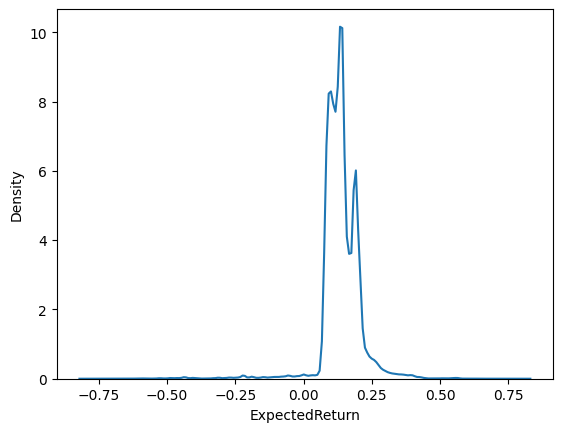

In [162]:
sns.kdeplot(df["ExpectedReturn"])
plt.show()

In [163]:
df["DefaultDate"]=df["DefaultDate"].fillna(0)

In [164]:
df["Default Status"]=np.where(df["DefaultDate"]==0,"Not Default","Default")

In [165]:
df[["DefaultDate","Default Status"]]

,DefaultDate,Default Status
0,0,Not Default
1,0,Not Default
2,2012-07-16,Default
3,0,Not Default
4,2009-09-28,Default
...,...,...
134524,2015-05-04,Default
134525,0,Not Default
134526,2015-08-04,Default
134527,2016-06-17,Default


In [166]:
df

,ListedOnUTC,BiddingStartedOn,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,LoanApplicationStartedDate,LoanDate,ContractEndDate,FirstPaymentDate,MaturityDate_Original,MaturityDate_Last,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,DateOfBirth,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,NrOfDependants,EmploymentStatus,EmploymentDurationCurrentEmployer,EmploymentPosition,WorkExperience,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,ActiveScheduleFirstPaymentReached,PlannedPrincipalTillDate,PlannedInterestTillDate,LastPaymentOn,CurrentDebtDaysPrimary,DebtOccuredOn,CurrentDebtDaysSecondary,DebtOccuredOnForSecondary,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,DefaultDate,PrincipalOverdueBySchedule,PlannedPrincipalPostDefault,PlannedInterestPostDefault,EAD1,EAD2,PrincipalRecovery,InterestRecovery,RecoveryStage,StageActiveSince,ModelVersion,Rating,EL_V0,Rating_V0,EL_V1,Rating_V1,Rating_V2,Status,Restructured,ActiveLateCategory,WorseLateCategory,CreditScoreEsMicroL,CreditScoreEsEquifaxRisk,CreditScoreFiAsiakasTietoRiskGrade,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalWriteOffs,InterestAndPenaltyWriteOffs,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsBefoleLoan,PreviousEarlyRepaymentsCountBeforeLoan,GracePeriodStart,GracePeriodEnd,NextPaymentDate,NextPaymentNr,NrOfScheduledPayments,ReScheduledOn,PrincipalDebtServicingCost,InterestAndPenaltyDebtServicingCost,ActiveLateLastPaymentCategory,Default Status
0,2009-06-11 16:40:39,2009-06-11 16:40:39,0,0,115.0410,True,2009-06-11 16:40:39,2009-06-16,2010-07-06,2009-07-27,2010-06-25,2010-06-25,17,5,2.0,1,61,1947-11-26,1.0,EE,319.5582,115.0408,30.00,12,NaN,HARJU,TALLINN,7,3.0,1.0,0,3.0,UpTo3Years,klienditeenindaja,MoreThan25Years,7.0,NaN,6000.0,10500.0,0,0.00,0,0.00,0.00,25,True,1800.0000,319.0800,2010-07-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,91-120,NaN,NaN,NaN,NaN,115.0408,20.4222,0.00,0.00,0.00,0.00,1,83.0852,0.0000,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,NaN,Not Default
1,2009-06-10 15:48:57,2009-06-10 15:48:57,0,0,140.6057,False,2009-06-10 15:48:57,2009-06-15,2009-07-07,2009-07-15,2009-07-15,2009-07-15,20,4,2.0,1,48,1960-11-05,1.0,EE,191.7349,140.6057,25.00,1,NaN,IDA-VIRU,KOHTLA-JARVE,7,5.0,4.0,0,3.0,MoreThan5Years,Õppealajuhataja lasteaias,MoreThan25Years,16.0,NaN,8300.0,10800.0,0,0.00,0,0.00,0.00,15,True,2200.0000,45.8300,2009-07-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,NaN,NaN,NaN,NaN,NaN,140.6057,2.0227,0.00,0.00,0.00,0.00,2,255.6467,258.6256,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,NaN,Not Default
2,2009-06-05 19:12:29,2009-06-05 19:12:29,0,0,319.5580,True,2009-06-05 19:12:29,2009-06-15,NaN,2009-07-27,2011-02-25,2014-05-13,20,6,2.0,1,58,1950-11-13,1.0,EE,319.5582,319.5409,25.00,20,NaN,PÄRNU,PÄRNU,2,4.0,1.0,0,3.0,UpTo4Years,teenindaja,MoreThan25Years,9.0,NaN,5000.0,7000.0,0,0.00,0,0.00,0.00,25,True,319.5409,197.2926,2012-10-01,2813.0,2012-05-14,2935.0,2012-01-13,NaN,NaN,NaN,NaN,2012-07-16,116.35,236.97,38.24,279.5049,270.7323,163.1549,50.99,NaN,2016-03-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Late,True,180+,180+,NaN,NaN,NaN,NaN,203.1909,59.7626,0.00,0.00,116.35,414.07,0,0.0000,0.0000,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,180+,Default
3,2009-06-13 12:01:20,2009-06-13 12:01:20,0,0,57.5205,True,2009-06-13 12:01:20,2009-06-15,2010-09-15,2009-07-15,2010-09-15,2010-09-15,12,7,2.0,1,23,1986-03-29,1.0,EE,127.8233,57.5205,45.00,15,NaN,HARJU,PALDISKI,0,2.0,3.0,1,NaN,UpTo2Years,juhtmekoitja,2To5Years,1.0,NaN,11000.0,11600.0,0,0.00,0,0.00,0.00,

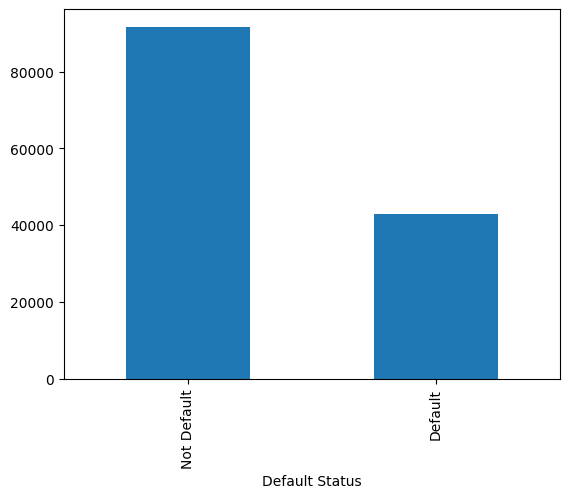

In [167]:
df["Default Status"].value_counts().plot(kind="bar")
plt.show()

## Bivariate analysis

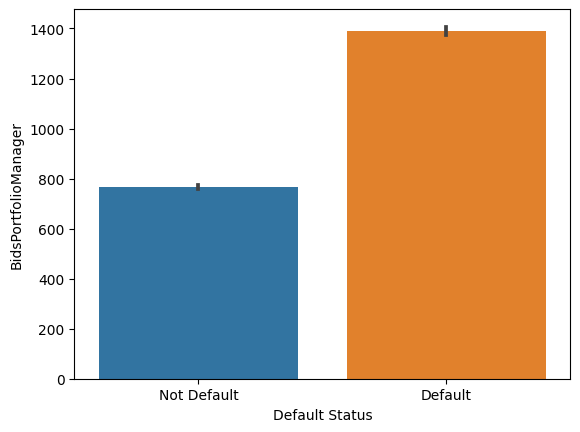

In [168]:
sns.barplot(x="Default Status",y="BidsPortfolioManager",data=df)
plt.show()

* average bids proposed by portfolio manager is higher for default customers

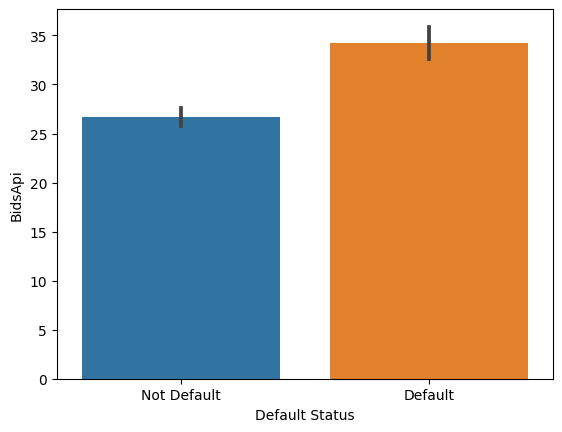

In [169]:
sns.barplot(x="Default Status",y="BidsApi",data=df)
plt.show()

* average bids through api is higher for default customers

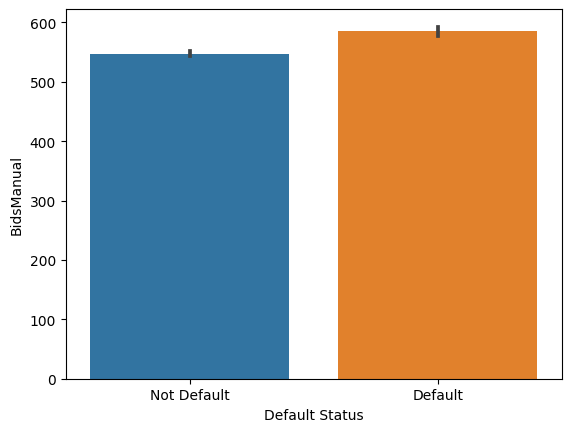

In [170]:
sns.barplot(x="Default Status",y="BidsManual",data=df)
plt.show()

* average bids proposed manually is higher for defaulted customers

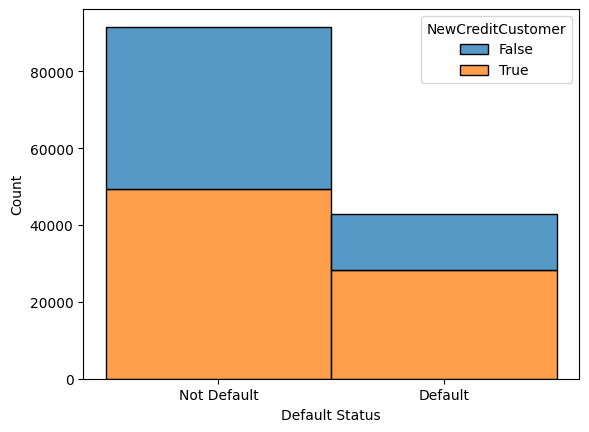

In [171]:
sns.histplot(binwidth=0.5, x="Default Status", hue="NewCreditCustomer", data=df, stat="count", multiple="stack")
plt.show()

* majority of the customers are new customers 

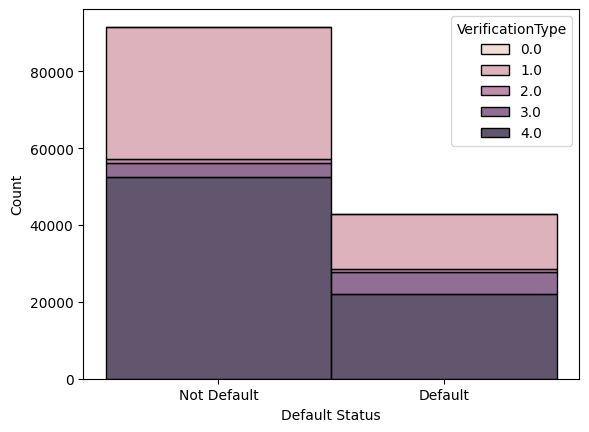

In [172]:
sns.histplot(binwidth=0.5, x="Default Status", hue="VerificationType", data=df, stat="count", multiple="stack")
plt.show()

* majority of the customers completed all type of verification

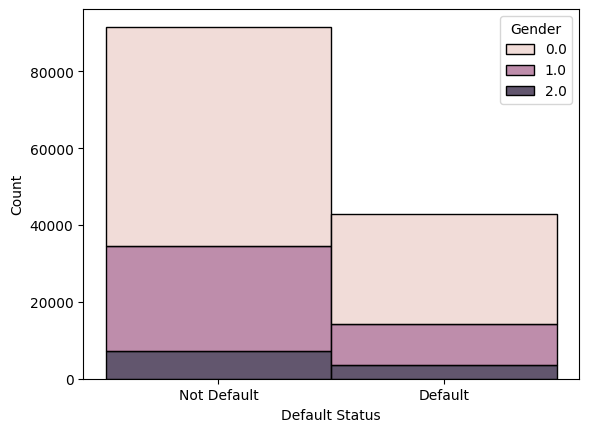

In [173]:
sns.histplot(binwidth=0.5, x="Default Status", hue="Gender", data=df, stat="count", multiple="stack")
plt.show()

* majority of the customers are men

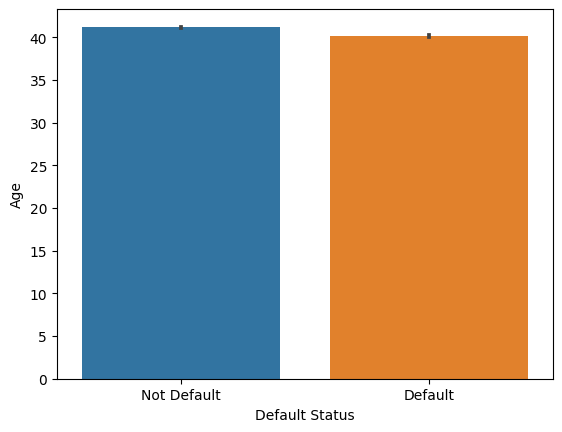

In [174]:
sns.barplot(x="Default Status",y="Age",data=df)
plt.show()

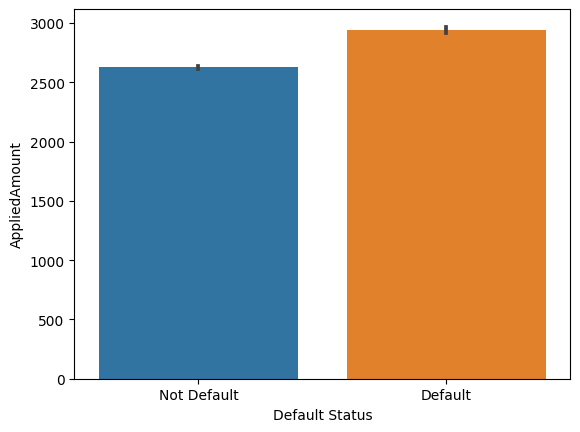

In [175]:
sns.barplot(x="Default Status",y="AppliedAmount",data=df)
plt.show()

* the average applied amount of default customers are higher than non default customers

<Axes: xlabel='Default Status', ylabel='Amount'>

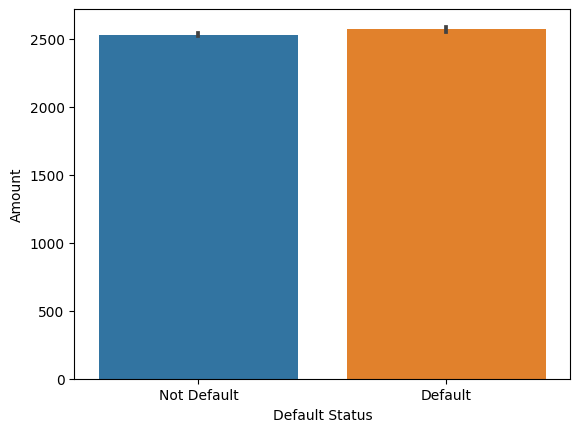

In [176]:
sns.barplot(x="Default Status",y="Amount",data=df)

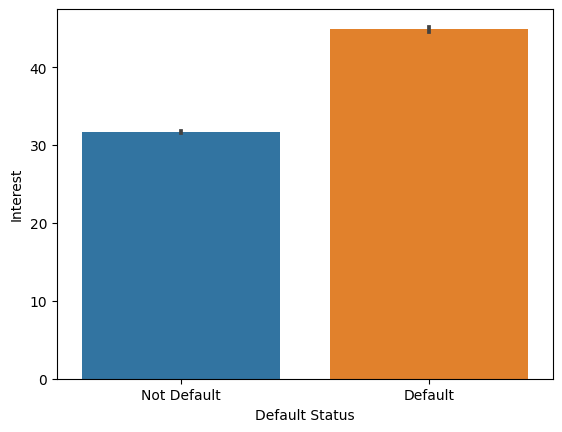

In [177]:
sns.barplot(x="Default Status",y="Interest",data=df)
plt.show()

* the average interest of  default customers are high

In [178]:
df["Interest"].max()

264.31

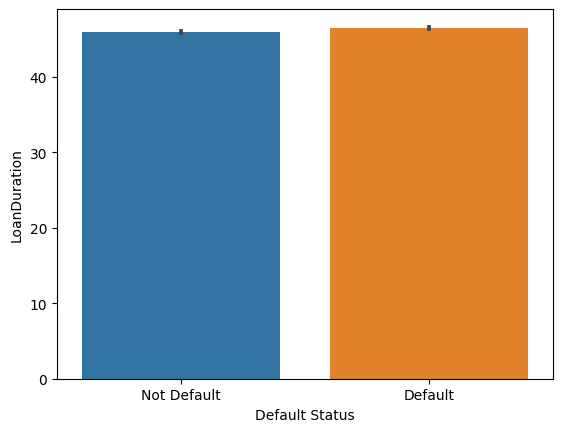

In [179]:
sns.barplot(x="Default Status",y="LoanDuration",data=df)
plt.show()

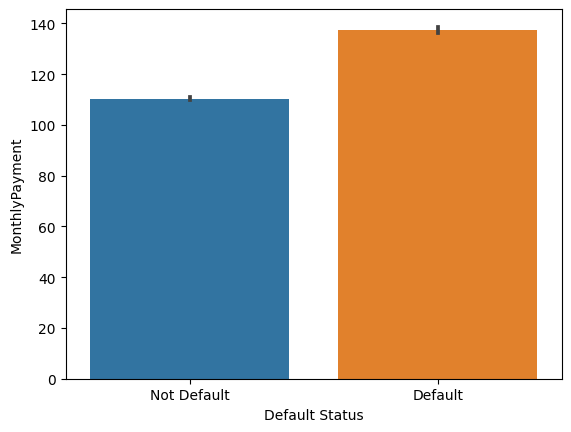

In [180]:
sns.barplot(x="Default Status",y="MonthlyPayment",data=df)
plt.show()

* the average monthly payment of default customers are high

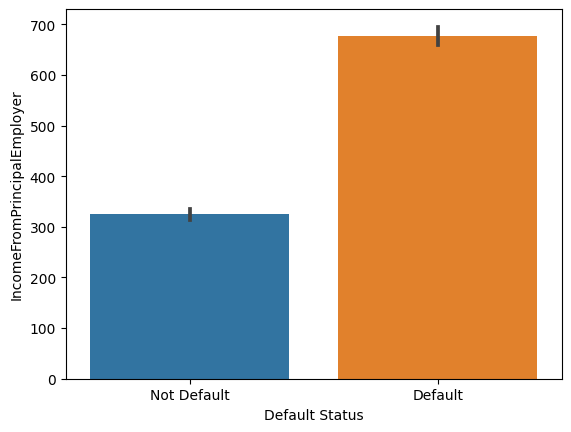

In [181]:
sns.barplot(x="Default Status",y="IncomeFromPrincipalEmployer",data=df)
plt.show()

* the average income from principal employer is higher for default customers

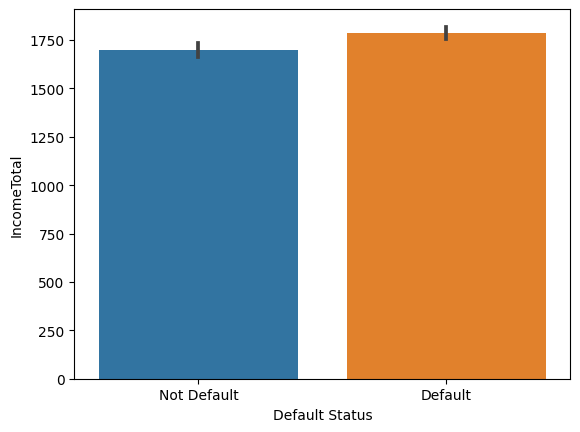

In [182]:
sns.barplot(x="Default Status",y="IncomeTotal",data=df)
plt.show()

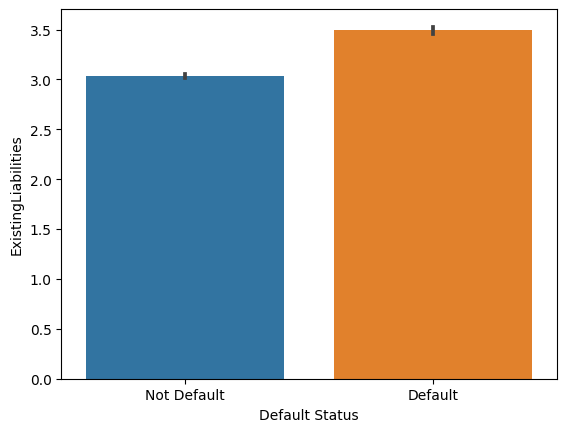

In [183]:
sns.barplot(x="Default Status",y="ExistingLiabilities",data=df)
plt.show()

* the average number of existing liabilities is higher for default customers

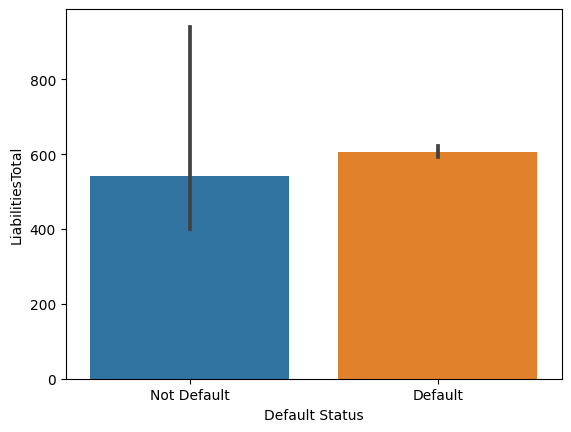

In [184]:
sns.barplot(x="Default Status",y="LiabilitiesTotal",data=df)
plt.show()

* total liabilities of the default customers are slightly higher than nin default customers

In [185]:
df[df["LiabilitiesTotal"]==12400000.0]

,ListedOnUTC,BiddingStartedOn,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,LoanApplicationStartedDate,LoanDate,ContractEndDate,FirstPaymentDate,MaturityDate_Original,MaturityDate_Last,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,DateOfBirth,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,NrOfDependants,EmploymentStatus,EmploymentDurationCurrentEmployer,EmploymentPosition,WorkExperience,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,ActiveScheduleFirstPaymentReached,PlannedPrincipalTillDate,PlannedInterestTillDate,LastPaymentOn,CurrentDebtDaysPrimary,DebtOccuredOn,CurrentDebtDaysSecondary,DebtOccuredOnForSecondary,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,DefaultDate,PrincipalOverdueBySchedule,PlannedPrincipalPostDefault,PlannedInterestPostDefault,EAD1,EAD2,PrincipalRecovery,InterestRecovery,RecoveryStage,StageActiveSince,ModelVersion,Rating,EL_V0,Rating_V0,EL_V1,Rating_V1,Rating_V2,Status,Restructured,ActiveLateCategory,WorseLateCategory,CreditScoreEsMicroL,CreditScoreEsEquifaxRisk,CreditScoreFiAsiakasTietoRiskGrade,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalWriteOffs,InterestAndPenaltyWriteOffs,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsBefoleLoan,PreviousEarlyRepaymentsCountBeforeLoan,GracePeriodStart,GracePeriodEnd,NextPaymentDate,NextPaymentNr,NrOfScheduledPayments,ReScheduledOn,PrincipalDebtServicingCost,InterestAndPenaltyDebtServicingCost,ActiveLateLastPaymentCategory,Default Status
119195,2019-11-06 19:37:04,2019-11-06 21:37:04,302,0,99.0,True,2019-11-05 22:47:35,2019-11-06,NaN,2019-12-04,2023-11-06,2023-11-06,20,4,4.0,6,46,1973-03-14,2.0,ES,531.0,531.0,75.46,48,30.28,NaN,NaN,-1,1.0,-1.0,NaN,-1.0,MoreThan5Years,NaN,NaN,-1.0,8.0,0.0,1900.0,1,12400000.0,0,0.0,0.0,4,True,NaN,6.14,NaN,53.0,2019-12-04,53.0,2019-12-04,0.248892,0.0,0.196666,0.35475,0,6.14,NaN,NaN,NaN,NaN,NaN,NaN,1.0,2019-12-05 03:12:58.950000000,6.0,F,NaN,NaN,NaN,NaN,NaN,Late,False,31-60,31-60,M,NaN,NaN,NaN,0.0,0.0,NaN,NaN,531.0,49.53,0,0.0,NaN,NaN,0,NaN,NaN,2020-02-04,3.0,48.0,NaN,NaN,NaN,31-60,Not Default


In [186]:
df["LiabilitiesTotal"].max()

12400000.0

In [187]:
df["LiabilitiesTotal"].value_counts()

LiabilitiesTotal
0.00      27183
250.00     1607
350.00     1258
300.00      831
500.00      692
          ...  
855.69        1
156.78        1
732.79        1
956.48        1
531.03        1
Name: count, Length: 48712, dtype: int64

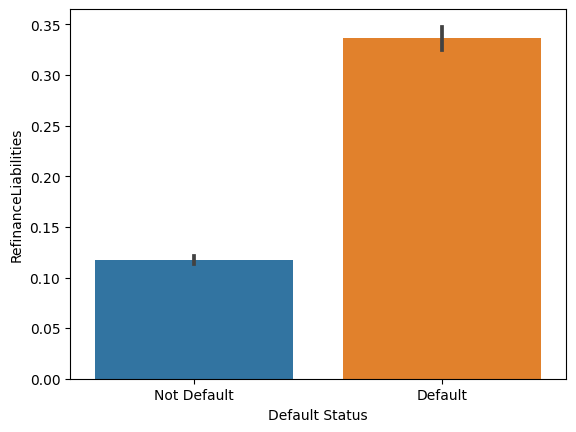

In [188]:
sns.barplot(x="Default Status",y="RefinanceLiabilities",data=df)
plt.show()

* after refinance,the average number liabilities of default customers are higher than the other 

In [189]:
df["RefinanceLiabilities"].value_counts()

RefinanceLiabilities
0     125221
1       3557
2       2070
3       1334
4        858
5        531
6        335
7        256
8        126
9         91
10        54
12        26
11        23
13        21
14        12
15         5
19         3
16         3
17         1
18         1
23         1
Name: count, dtype: int64

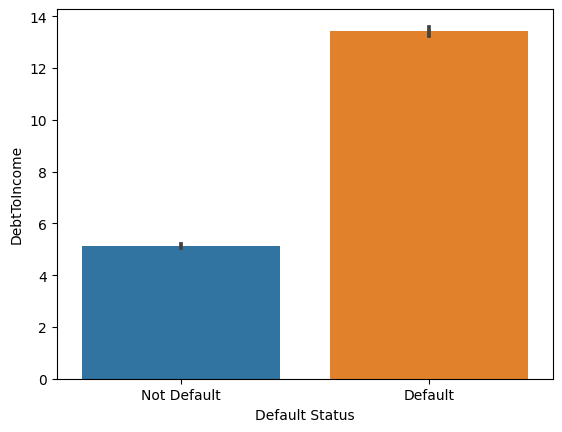

In [190]:
sns.barplot(x="Default Status",y="DebtToIncome",data=df)
plt.show()

* the average debt to income ratio of default customers are high

In [191]:
df["DebtToIncome"].mean()

7.7690235269623145

In [192]:
df["DebtToIncome"].value_counts()

DebtToIncome
0.00     100177
20.00        29
69.89        23
69.98        23
69.95        22
          ...  
63.64         1
54.82         1
67.25         1
62.21         1
56.96         1
Name: count, Length: 6789, dtype: int64

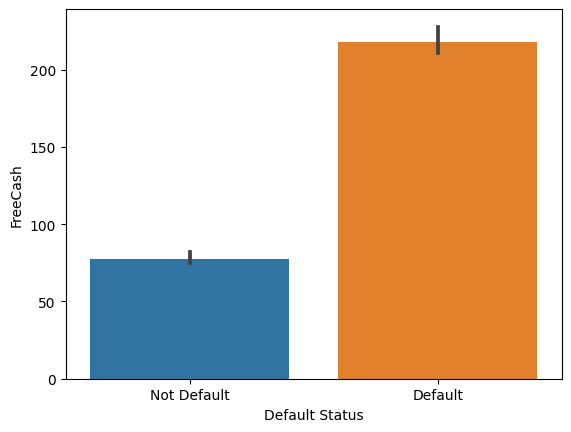

In [193]:
sns.barplot(x="Default Status",y="FreeCash",data=df)
plt.show()

* average freecash of default customers are high

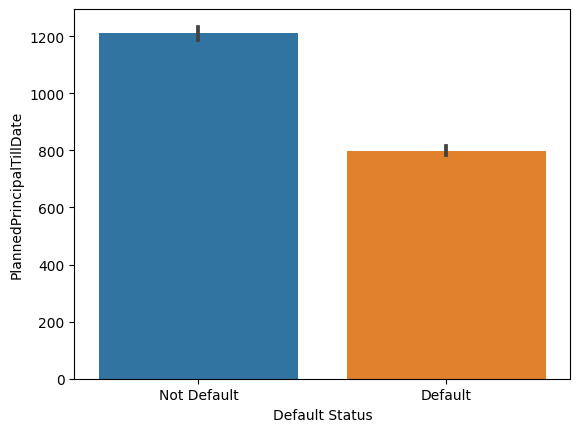

In [194]:
sns.barplot(x="Default Status",y="PlannedPrincipalTillDate",data=df)
plt.show()

* According to active schedule the average amount of principal the investment should have received is less for default customers

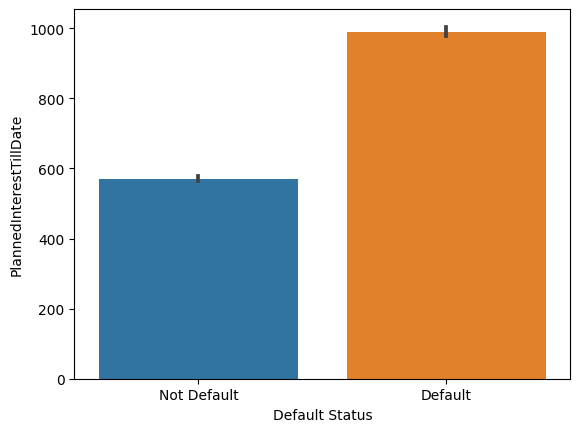

In [195]:
sns.barplot(x="Default Status",y="PlannedInterestTillDate",data=df)
plt.show()

* ccording to active schedule the amount of average interest the investment should have received is higher for default customers

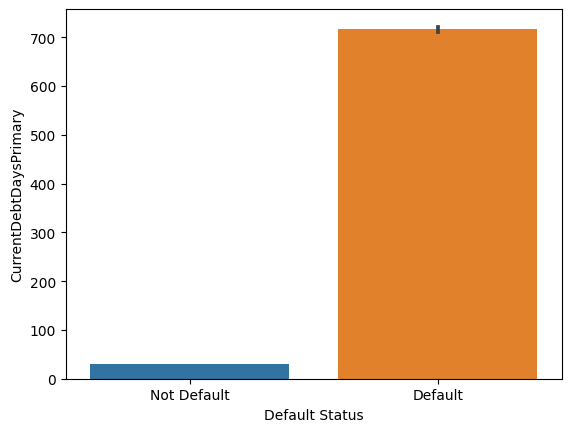

In [196]:
sns.barplot(x="Default Status",y="CurrentDebtDaysPrimary",data=df)
plt.show()

* the average days which loan has been in debt state is higher for default customers

In [197]:
df["CurrentDebtDaysPrimary"].value_counts()

CurrentDebtDaysPrimary
6.0       994
13.0      722
83.0      614
11.0      469
30.0      448
         ... 
2230.0      1
1993.0      1
2334.0      1
1605.0      1
1831.0      1
Name: count, Length: 1512, dtype: int64

In [198]:
df["LoanDuration"].max()

60

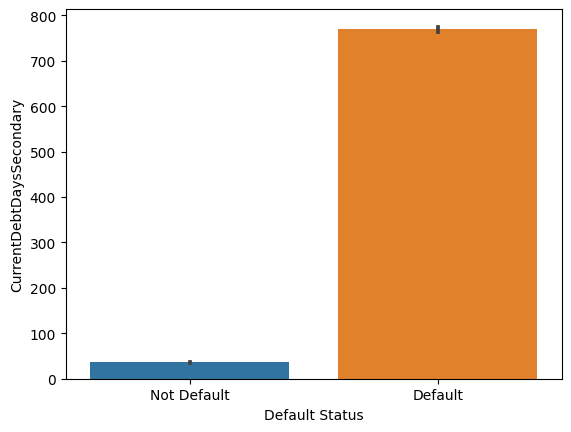

In [199]:
sns.barplot(x="Default Status",y="CurrentDebtDaysSecondary",data=df)
plt.show()

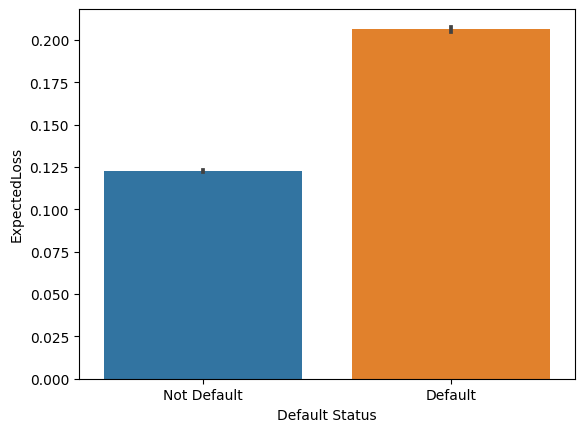

In [200]:
sns.barplot(x="Default Status",y="ExpectedLoss",data=df)
plt.show()

* average expected loss predicted is high for for default customers

In [201]:
df["ExpectedLoss"].max()

1.00854

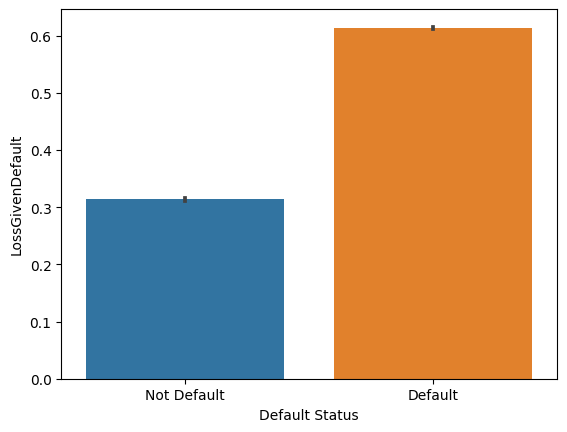

In [202]:
sns.barplot(x="Default Status",y="LossGivenDefault",data=df)
plt.show()

* average loss given default is higher for default customers

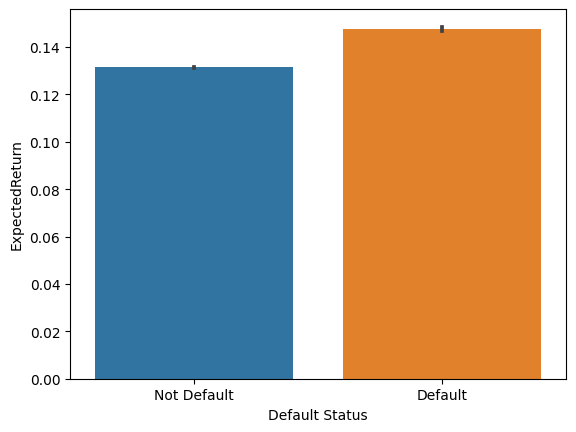

In [203]:
sns.barplot(x="Default Status",y="ExpectedReturn",data=df)
plt.show()

* the average expected return is higher for default customers

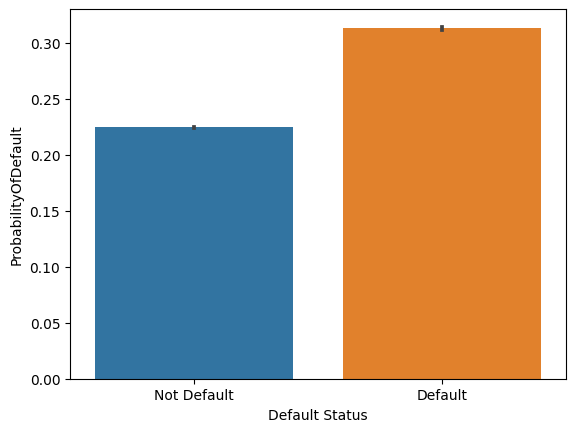

In [204]:
sns.barplot(x="Default Status",y="ProbabilityOfDefault",data=df)
plt.show()

* probability of default is higher for default customers

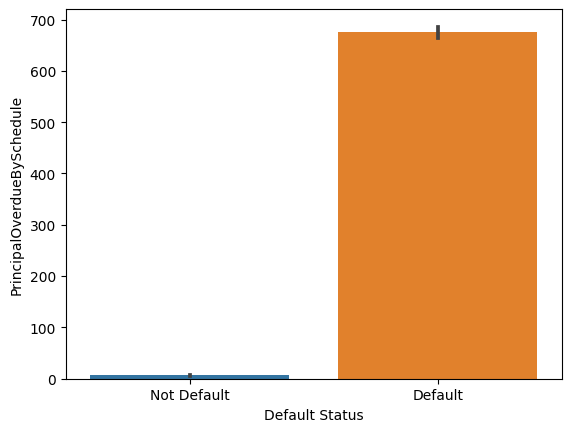

In [205]:
sns.barplot(x="Default Status",y="PrincipalOverdueBySchedule",data=df)
plt.show()

* average principal that is overdue is higher for default customers

C:\Users\Biji\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
C:\Users\Biji\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


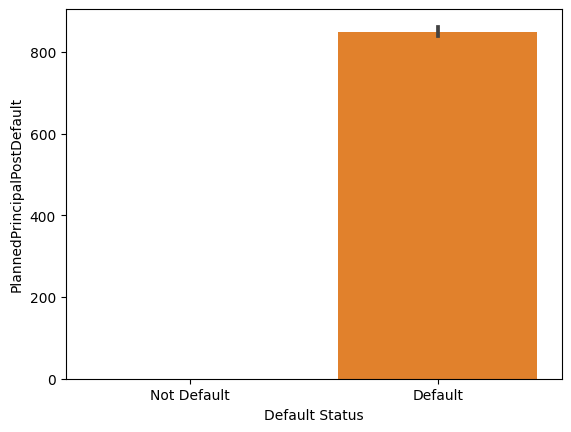

In [206]:
sns.barplot(x="Default Status",y="PlannedPrincipalPostDefault",data=df)
plt.show()

C:\Users\Biji\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
C:\Users\Biji\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


<Axes: xlabel='Default Status', ylabel='PlannedInterestPostDefault'>

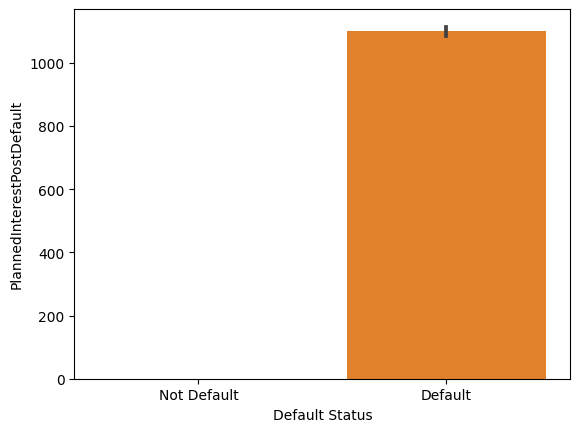

In [207]:
sns.barplot(x="Default Status",y="PlannedInterestPostDefault",data=df)

C:\Users\Biji\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
C:\Users\Biji\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


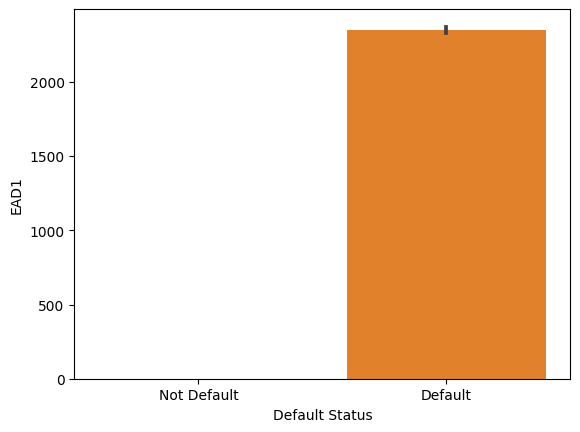

In [208]:
sns.barplot(x="Default Status",y="EAD1",data=df)
plt.show()

C:\Users\Biji\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
C:\Users\Biji\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


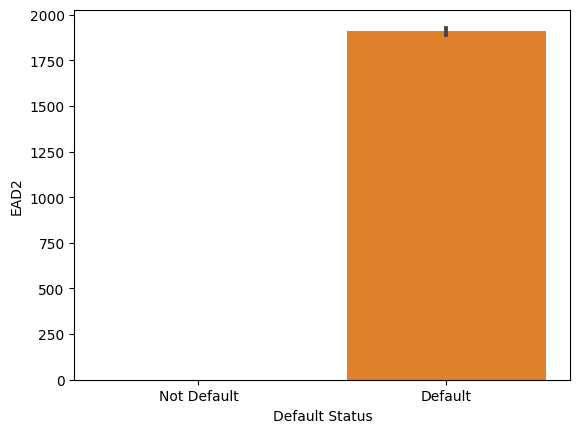

In [209]:
sns.barplot(x="Default Status",y="EAD2",data=df)
plt.show()

C:\Users\Biji\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
C:\Users\Biji\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


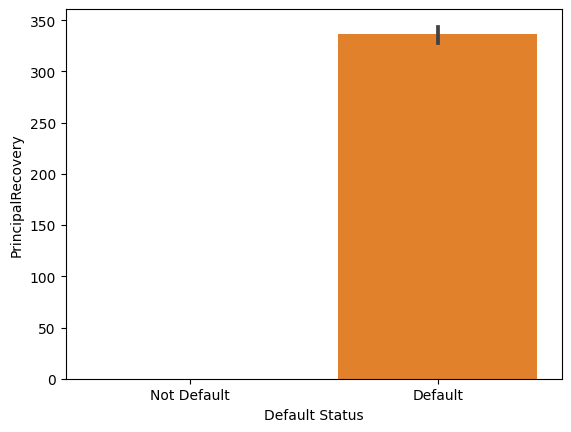

In [210]:
sns.barplot(x="Default Status",y="PrincipalRecovery",data=df)
plt.show()

C:\Users\Biji\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
C:\Users\Biji\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


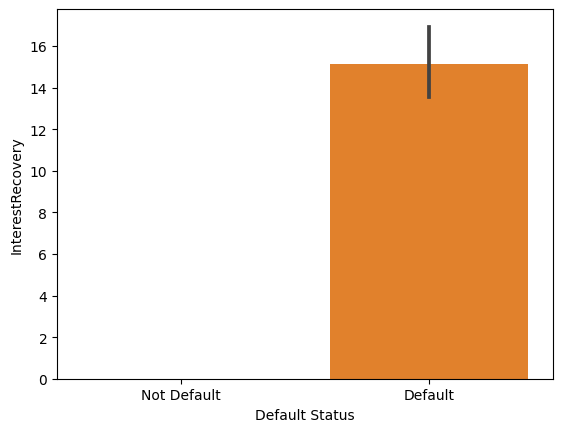

In [211]:
sns.barplot(x="Default Status",y="InterestRecovery",data=df)
plt.show()

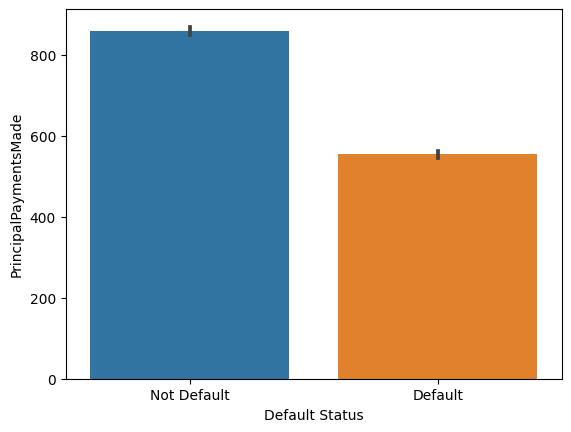

In [212]:
sns.barplot(x="Default Status",y="PrincipalPaymentsMade",data=df)
plt.show()

* the average principal payents made by default customers are low

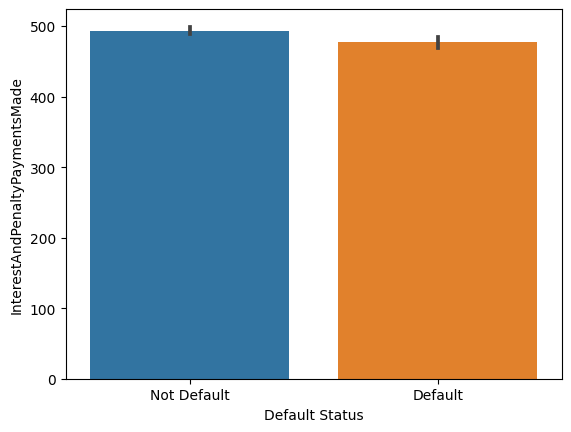

In [213]:
sns.barplot(x="Default Status",y="InterestAndPenaltyPaymentsMade",data=df)
plt.show()

* the average interest and penalty payments are done by default customers are slightly loer than other

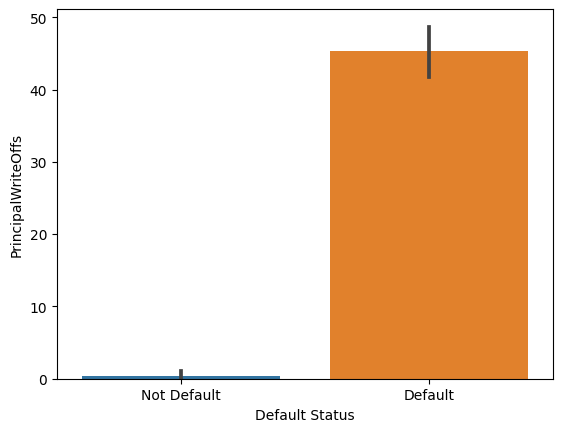

In [214]:
sns.barplot(x="Default Status",y="PrincipalWriteOffs",data=df)
plt.show()

<Axes: xlabel='Default Status', ylabel='InterestAndPenaltyWriteOffs'>

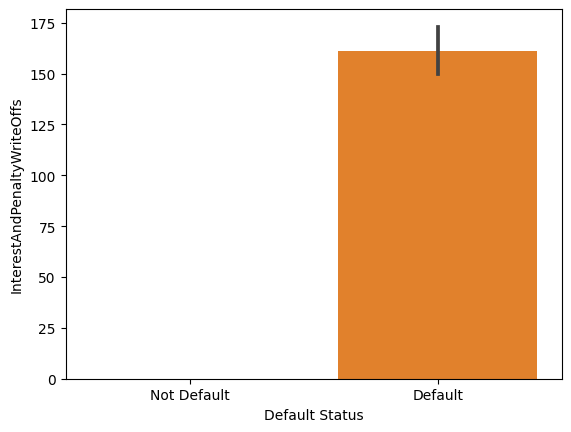

In [215]:
sns.barplot(x="Default Status",y="InterestAndPenaltyWriteOffs",data=df)

* average principal amount,interest and penalty write off happened more for default customers

In [216]:
defa=df[df["Default Status"]=="Not Default"]
defa["InterestAndPenaltyWriteOffs"].mean()

0.03666263159825392

In [217]:
defy=df[df["Default Status"]=="Default"]

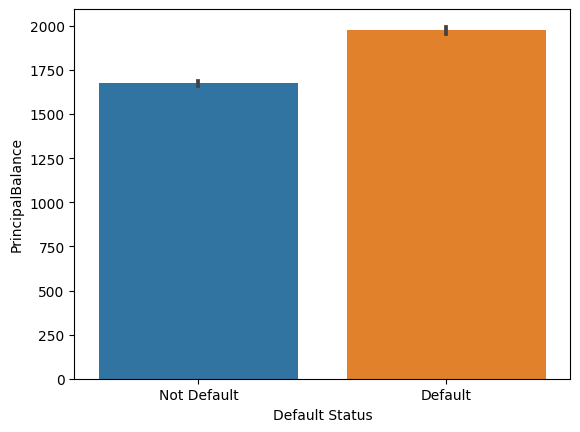

In [218]:
sns.barplot(x="Default Status",y="PrincipalBalance",data=df)
plt.show()

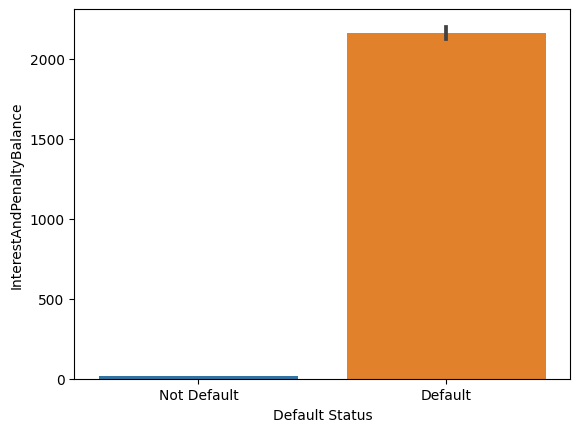

In [219]:
sns.barplot(x="Default Status",y="InterestAndPenaltyBalance",data=df)
plt.show()

* average Principal amount,interest and penalty that still needs to be paid by the borrower is higher for default customers

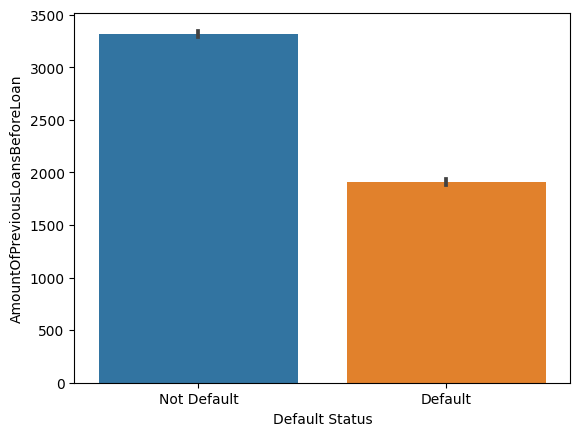

In [220]:
sns.barplot(x="Default Status",y="AmountOfPreviousLoansBeforeLoan",data=df)
plt.show()

* the average amount previous loan is lower for default customers

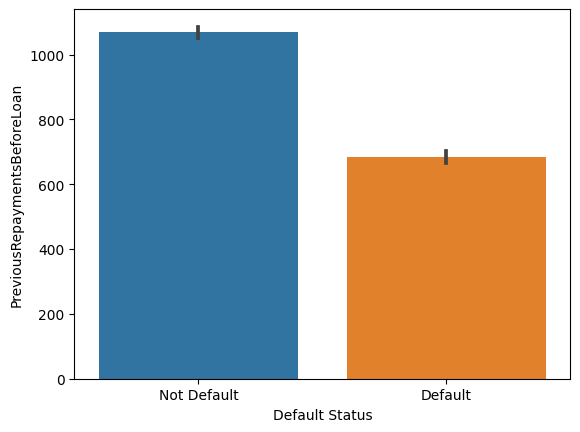

In [221]:
sns.barplot(x="Default Status",y="PreviousRepaymentsBeforeLoan",data=df)
plt.show()

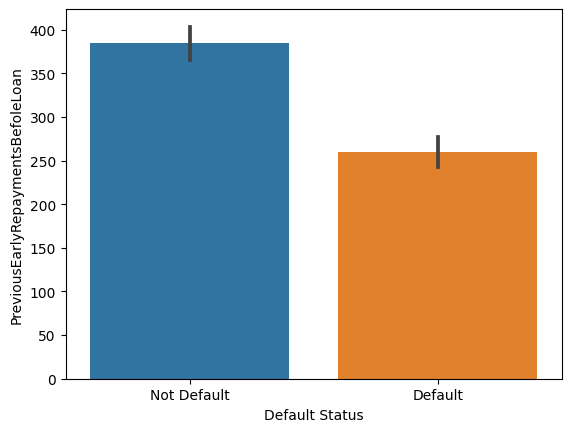

In [222]:
sns.barplot(x="Default Status",y="PreviousEarlyRepaymentsBefoleLoan",data=df)
plt.show()

* previous repayments and early repayments are higher for not default customers

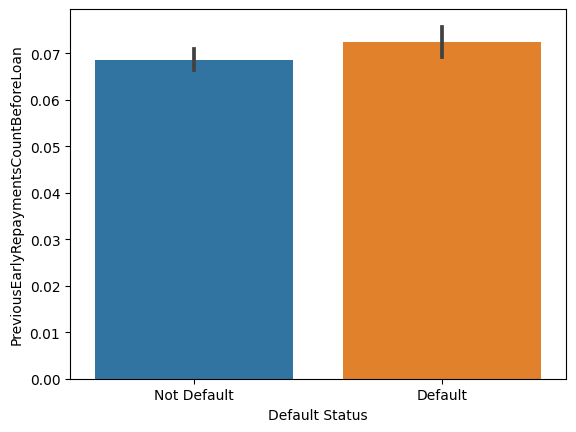

In [223]:
sns.barplot(x="Default Status",y="PreviousEarlyRepaymentsCountBeforeLoan",data=df)
plt.show()

In [224]:
df["PreviousEarlyRepaymentsCountBeforeLoan"].max()

11

In [225]:
df["PreviousEarlyRepaymentsCountBeforeLoan"].min()

0

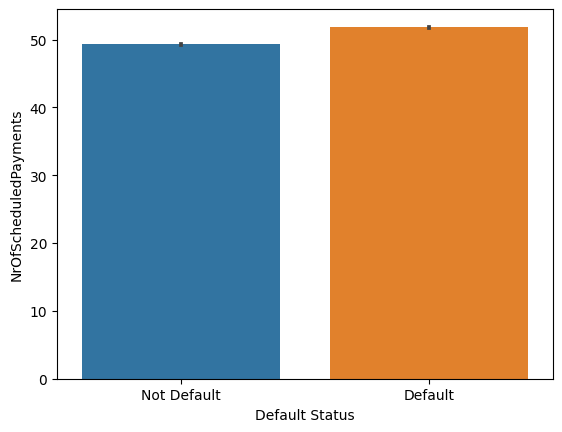

In [226]:
sns.barplot(y="NrOfScheduledPayments",x="Default Status",data=df)
plt.show()

<Axes: xlabel='Default Status', ylabel='PrincipalDebtServicingCost'>

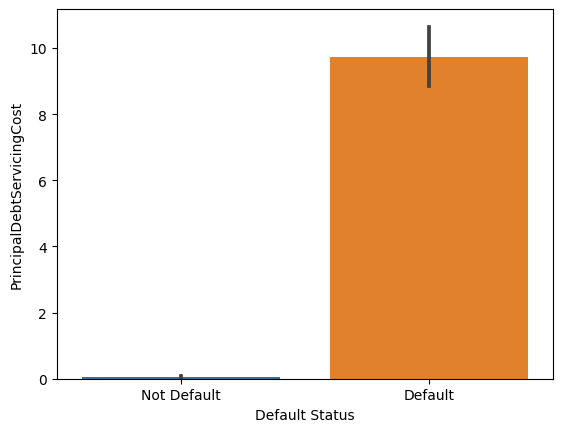

In [227]:
sns.barplot(y="PrincipalDebtServicingCost",x="Default Status",data=df)

<Axes: xlabel='Default Status', ylabel='InterestAndPenaltyDebtServicingCost'>

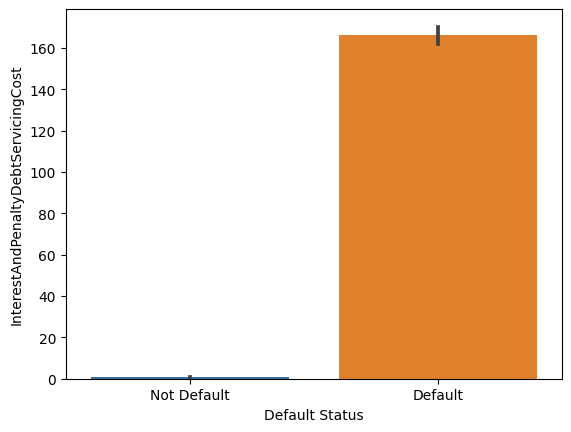

In [228]:
sns.barplot(y="InterestAndPenaltyDebtServicingCost",x="Default Status",data=df)

* the average principal amount,interest and penalty dbt servicing cost is high for default customers

In [229]:
df.head()

,ListedOnUTC,BiddingStartedOn,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,LoanApplicationStartedDate,LoanDate,ContractEndDate,FirstPaymentDate,MaturityDate_Original,MaturityDate_Last,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,DateOfBirth,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,NrOfDependants,EmploymentStatus,EmploymentDurationCurrentEmployer,EmploymentPosition,WorkExperience,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,ActiveScheduleFirstPaymentReached,PlannedPrincipalTillDate,PlannedInterestTillDate,LastPaymentOn,CurrentDebtDaysPrimary,DebtOccuredOn,CurrentDebtDaysSecondary,DebtOccuredOnForSecondary,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,DefaultDate,PrincipalOverdueBySchedule,PlannedPrincipalPostDefault,PlannedInterestPostDefault,EAD1,EAD2,PrincipalRecovery,InterestRecovery,RecoveryStage,StageActiveSince,ModelVersion,Rating,EL_V0,Rating_V0,EL_V1,Rating_V1,Rating_V2,Status,Restructured,ActiveLateCategory,WorseLateCategory,CreditScoreEsMicroL,CreditScoreEsEquifaxRisk,CreditScoreFiAsiakasTietoRiskGrade,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalWriteOffs,InterestAndPenaltyWriteOffs,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsBefoleLoan,PreviousEarlyRepaymentsCountBeforeLoan,GracePeriodStart,GracePeriodEnd,NextPaymentDate,NextPaymentNr,NrOfScheduledPayments,ReScheduledOn,PrincipalDebtServicingCost,InterestAndPenaltyDebtServicingCost,ActiveLateLastPaymentCategory,Default Status
0,2009-06-11 16:40:39,2009-06-11 16:40:39,0,0,115.0410,True,2009-06-11 16:40:39,2009-06-16,2010-07-06,2009-07-27,2010-06-25,2010-06-25,17,5,2.0,1,61,1947-11-26,1.0,EE,319.5582,115.0408,30.0,12,NaN,HARJU,TALLINN,7,3.0,1.0,0,3.0,UpTo3Years,klienditeenindaja,MoreThan25Years,7.0,NaN,6000.0,10500.0,0,0.0,0,0.0,0.0,25,True,1800.0000,319.0800,2010-07-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,91-120,NaN,NaN,NaN,NaN,115.0408,20.4222,0.0,0.0,0.00,0.00,1,83.0852,0.0000,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,Not Default
1,2009-06-10 15:48:57,2009-06-10 15:48:57,0,0,140.6057,False,2009-06-10 15:48:57,2009-06-15,2009-07-07,2009-07-15,2009-07-15,2009-07-15,20,4,2.0,1,48,1960-11-05,1.0,EE,191.7349,140.6057,25.0,1,NaN,IDA-VIRU,KOHTLA-JARVE,7,5.0,4.0,0,3.0,MoreThan5Years,Õppealajuhataja lasteaias,MoreThan25Years,16.0,NaN,8300.0,10800.0,0,0.0,0,0.0,0.0,15,True,2200.0000,45.8300,2009-07-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,NaN,NaN,NaN,NaN,NaN,140.6057,2.0227,0.0,0.0,0.00,0.00,2,255.6467,258.6256,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,Not Default
2,2009-06-05 19:12:29,2009-06-05 19:12:29,0,0,319.5580,True,2009-06-05 19:12:29,2009-06-15,NaN,2009-07-27,2011-02-25,2014-05-13,20,6,2.0,1,58,1950-11-13,1.0,EE,319.5582,319.5409,25.0,20,NaN,PÄRNU,PÄRNU,2,4.0,1.0,0,3.0,UpTo4Years,teenindaja,MoreThan25Years,9.0,NaN,5000.0,7000.0,0,0.0,0,0.0,0.0,25,True,319.5409,197.2926,2012-10-01,2813.0,2012-05-14,2935.0,2012-01-13,NaN,NaN,NaN,NaN,2012-07-16,116.35,236.97,38.24,279.5049,270.7323,163.1549,50.99,NaN,2016-03-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Late,True,180+,180+,NaN,NaN,NaN,NaN,203.1909,59.7626,0.0,0.0,116.35,414.07,0,0.0000,0.0000,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,180+,Default
3,2009-06-13 12:01:20,2009-06-13 12:01:20,0,0,57.5205,True,2009-06-13 12:01:20,2009-06-15,2010-09-15,2009-07-15,2010-09-15,2010-09-15,12,7,2.0,1,23,1986-03-29,1.0,EE,127.8233,57.5205,45.0,15,NaN,HARJU,PALDISKI,0,2.0,3.0,1,NaN,UpTo2Years,juhtmekoitja,2To5Years,1.0,NaN,11000.0,11600.0,0,0.0,0,0.0,0.0,15,True,900.0000,293.1000

In [230]:
df["ReScheduledOn"].value_counts()

ReScheduledOn
2020-01-13    291
2020-01-09    259
2020-01-02    256
2020-01-20    247
2019-12-10    245
             ... 
2016-05-30      1
2017-10-21      1
2016-04-09      1
2015-01-12      1
2015-03-01      1
Name: count, Length: 1700, dtype: int64

In [231]:
df.head()

,ListedOnUTC,BiddingStartedOn,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,LoanApplicationStartedDate,LoanDate,ContractEndDate,FirstPaymentDate,MaturityDate_Original,MaturityDate_Last,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,DateOfBirth,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,NrOfDependants,EmploymentStatus,EmploymentDurationCurrentEmployer,EmploymentPosition,WorkExperience,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,ActiveScheduleFirstPaymentReached,PlannedPrincipalTillDate,PlannedInterestTillDate,LastPaymentOn,CurrentDebtDaysPrimary,DebtOccuredOn,CurrentDebtDaysSecondary,DebtOccuredOnForSecondary,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,DefaultDate,PrincipalOverdueBySchedule,PlannedPrincipalPostDefault,PlannedInterestPostDefault,EAD1,EAD2,PrincipalRecovery,InterestRecovery,RecoveryStage,StageActiveSince,ModelVersion,Rating,EL_V0,Rating_V0,EL_V1,Rating_V1,Rating_V2,Status,Restructured,ActiveLateCategory,WorseLateCategory,CreditScoreEsMicroL,CreditScoreEsEquifaxRisk,CreditScoreFiAsiakasTietoRiskGrade,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalWriteOffs,InterestAndPenaltyWriteOffs,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsBefoleLoan,PreviousEarlyRepaymentsCountBeforeLoan,GracePeriodStart,GracePeriodEnd,NextPaymentDate,NextPaymentNr,NrOfScheduledPayments,ReScheduledOn,PrincipalDebtServicingCost,InterestAndPenaltyDebtServicingCost,ActiveLateLastPaymentCategory,Default Status
0,2009-06-11 16:40:39,2009-06-11 16:40:39,0,0,115.0410,True,2009-06-11 16:40:39,2009-06-16,2010-07-06,2009-07-27,2010-06-25,2010-06-25,17,5,2.0,1,61,1947-11-26,1.0,EE,319.5582,115.0408,30.0,12,NaN,HARJU,TALLINN,7,3.0,1.0,0,3.0,UpTo3Years,klienditeenindaja,MoreThan25Years,7.0,NaN,6000.0,10500.0,0,0.0,0,0.0,0.0,25,True,1800.0000,319.0800,2010-07-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,91-120,NaN,NaN,NaN,NaN,115.0408,20.4222,0.0,0.0,0.00,0.00,1,83.0852,0.0000,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,Not Default
1,2009-06-10 15:48:57,2009-06-10 15:48:57,0,0,140.6057,False,2009-06-10 15:48:57,2009-06-15,2009-07-07,2009-07-15,2009-07-15,2009-07-15,20,4,2.0,1,48,1960-11-05,1.0,EE,191.7349,140.6057,25.0,1,NaN,IDA-VIRU,KOHTLA-JARVE,7,5.0,4.0,0,3.0,MoreThan5Years,Õppealajuhataja lasteaias,MoreThan25Years,16.0,NaN,8300.0,10800.0,0,0.0,0,0.0,0.0,15,True,2200.0000,45.8300,2009-07-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,NaN,NaN,NaN,NaN,NaN,140.6057,2.0227,0.0,0.0,0.00,0.00,2,255.6467,258.6256,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,Not Default
2,2009-06-05 19:12:29,2009-06-05 19:12:29,0,0,319.5580,True,2009-06-05 19:12:29,2009-06-15,NaN,2009-07-27,2011-02-25,2014-05-13,20,6,2.0,1,58,1950-11-13,1.0,EE,319.5582,319.5409,25.0,20,NaN,PÄRNU,PÄRNU,2,4.0,1.0,0,3.0,UpTo4Years,teenindaja,MoreThan25Years,9.0,NaN,5000.0,7000.0,0,0.0,0,0.0,0.0,25,True,319.5409,197.2926,2012-10-01,2813.0,2012-05-14,2935.0,2012-01-13,NaN,NaN,NaN,NaN,2012-07-16,116.35,236.97,38.24,279.5049,270.7323,163.1549,50.99,NaN,2016-03-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Late,True,180+,180+,NaN,NaN,NaN,NaN,203.1909,59.7626,0.0,0.0,116.35,414.07,0,0.0000,0.0000,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,180+,Default
3,2009-06-13 12:01:20,2009-06-13 12:01:20,0,0,57.5205,True,2009-06-13 12:01:20,2009-06-15,2010-09-15,2009-07-15,2010-09-15,2010-09-15,12,7,2.0,1,23,1986-03-29,1.0,EE,127.8233,57.5205,45.0,15,NaN,HARJU,PALDISKI,0,2.0,3.0,1,NaN,UpTo2Years,juhtmekoitja,2To5Years,1.0,NaN,11000.0,11600.0,0,0.0,0,0.0,0.0,15,True,900.0000,293.1000

In [232]:
df.tail()

,ListedOnUTC,BiddingStartedOn,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,LoanApplicationStartedDate,LoanDate,ContractEndDate,FirstPaymentDate,MaturityDate_Original,MaturityDate_Last,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,DateOfBirth,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,NrOfDependants,EmploymentStatus,EmploymentDurationCurrentEmployer,EmploymentPosition,WorkExperience,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,ActiveScheduleFirstPaymentReached,PlannedPrincipalTillDate,PlannedInterestTillDate,LastPaymentOn,CurrentDebtDaysPrimary,DebtOccuredOn,CurrentDebtDaysSecondary,DebtOccuredOnForSecondary,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,DefaultDate,PrincipalOverdueBySchedule,PlannedPrincipalPostDefault,PlannedInterestPostDefault,EAD1,EAD2,PrincipalRecovery,InterestRecovery,RecoveryStage,StageActiveSince,ModelVersion,Rating,EL_V0,Rating_V0,EL_V1,Rating_V1,Rating_V2,Status,Restructured,ActiveLateCategory,WorseLateCategory,CreditScoreEsMicroL,CreditScoreEsEquifaxRisk,CreditScoreFiAsiakasTietoRiskGrade,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalWriteOffs,InterestAndPenaltyWriteOffs,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsBefoleLoan,PreviousEarlyRepaymentsCountBeforeLoan,GracePeriodStart,GracePeriodEnd,NextPaymentDate,NextPaymentNr,NrOfScheduledPayments,ReScheduledOn,PrincipalDebtServicingCost,InterestAndPenaltyDebtServicingCost,ActiveLateLastPaymentCategory,Default Status
134524,2015-01-02 16:31:36,2015-01-02 16:31:36,2515,0,485.0,True,2015-01-01 07:17:03,2015-01-06,2019-02-13,2015-03-02,2020-02-03,2020-02-03,16,6,3.0,4,37,1977-02-07,0.0,FI,3000.0,3000.0,31.01,60,107.68,PÄIJÄT-HÄME,LAHTI,0,3.0,3.0,0,3.0,MoreThan5Years,Worker,15To25Years,1.0,5.0,1400.0,1400.0,1,500.00,0,7.69,792.32,1,True,1411.60,3000.00,2019-02-12,1791.0,2015-03-02,1791.0,2015-03-02,0.146732,0.90,0.163368,0.125412,2015-05-04,0.00,2860.87,2779.85,3000.00,3000.00,2308.19,0.0,2.0,2018-12-21 10:08:52,1.0,E,NaN,NaN,0.146732,E,HR,Repaid,False,180+,180+,NaN,NaN,RL2,NaN,2308.19,0.00,691.81,1552.18,0.00,0.00,0,0.0,0.00,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1040.06,180+,Default
134525,2015-01-05 16:14:26,2015-01-05 16:14:26,1880,0,1120.0,False,2015-01-05 07:56:22,2015-01-06,2019-02-07,2015-03-05,2020-02-05,2019-02-20,16,2,3.0,4,35,1979-05-17,0.0,FI,3000.0,3000.0,18.25,60,85.33,POHJOIS KARJAALA,JOENSUU,2,3.0,3.0,0,3.0,MoreThan5Years,MiddleManager,15To25Years,8.0,1.0,2265.0,2265.0,5,1777.46,0,31.58,520.67,7,True,0.00,16.32,2019-02-07,NaN,NaN,NaN,NaN,0.053246,0.90,0.129254,0.045510,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,1.0,2018-07-23 17:00:07.437000000,1.0,B,NaN,NaN,0.053246,B,E,Repaid,False,NaN,31-60,NaN,NaN,RL2,NaN,3000.00,1990.03,0.00,0.00,0.00,0.00,1,3000.0,389.36,0.0,0,2017-06-27,2018-06-20,NaN,NaN,NaN,NaN,0.0,0.00,NaN,Not Default
134526,2015-01-02 14:04:27,2015-01-02 14:04:27,1975,0,525.0,True,2014-12-28 15:01:47,2015-01-06,NaN,2015-03-02,2020-02-03,2020-02-03,13,6,1.0,4,40,1974-01-25,0.0,FI,2500.0,2500.0,24.83,60,80.42,VARSINAIS-SUOMI,SAUVO,0,3.0,1.0,1,5.0,MoreThan5Years,Owner,5To10Years,6.0,1.0,2500.0,2500.0,2,1350.00,0,3.22,1069.58,1,True,1264.45,2428.44,2020-01-17,1700.0,2015-06-01,1700.0,2015-06-01,0.104219,0.90,0.144081,0.089076,2015-08-04,558.68,2293.22,1582.04,2434.99,2235.66,1804.75,0.0,2.0,2019-02-28 17:02:53,1.0,D,NaN,NaN,0.104219,D,HR,Late,False,180+,180+,NaN,NaN,RL2,NaN,1869.76,199.33,0.00,0.00,630.24,1227.98,0,0.0,0.00,0.0,0,NaN,NaN,NaN,0.0,60.0,NaN,0.0,1051.85,8-15,Default
134527,2015-01-05 16:56:12,2015-01-05 16:56:12,1840,0,1160.0,False,2015-01-05 15:01:18,2015-01-06,2019-12-23,2015-03-02,2020-02-03,2020-08-03,16,2,4.0,1,47,1967-01-28,

In [233]:
df.shape

(134529, 103)

In [234]:
for i in df:
    if df[i].isnull().sum()>0:
        print(i," : ",df[i].isnull().sum())

ContractEndDate  :  75546
VerificationType  :  45
Gender  :  45
MonthlyPayment  :  6685
County  :  36840
City  :  9794
Education  :  45
MaritalStatus  :  45
NrOfDependants  :  98929
EmploymentStatus  :  197
EmploymentDurationCurrentEmployer  :  876
EmploymentPosition  :  98439
WorkExperience  :  98007
OccupationArea  :  86
HomeOwnershipType  :  1652
DebtToIncome  :  45
FreeCash  :  45
PlannedPrincipalTillDate  :  80070
PlannedInterestTillDate  :  3942
LastPaymentOn  :  9531
CurrentDebtDaysPrimary  :  86011
DebtOccuredOn  :  86011
CurrentDebtDaysSecondary  :  82279
DebtOccuredOnForSecondary  :  82279
ExpectedLoss  :  2636
LossGivenDefault  :  2636
ExpectedReturn  :  2636
ProbabilityOfDefault  :  2636
PrincipalOverdueBySchedule  :  14837
PlannedPrincipalPostDefault  :  91614
PlannedInterestPostDefault  :  91614
EAD1  :  91614
EAD2  :  91614
PrincipalRecovery  :  91614
InterestRecovery  :  91614
RecoveryStage  :  57288
StageActiveSince  :  53575
ModelVersion  :  2636
Rating  :  2730
EL_V0

In [235]:
list1# null value is more than 50%

['ContractEndDate',
 'NrOfDependants',
 'EmploymentPosition',
 'WorkExperience',
 'PlannedPrincipalTillDate',
 'CurrentDebtDaysPrimary',
 'DebtOccuredOn',
 'CurrentDebtDaysSecondary',
 'DebtOccuredOnForSecondary',
 'DefaultDate',
 'PlannedPrincipalPostDefault',
 'PlannedInterestPostDefault',
 'EAD1',
 'EAD2',
 'PrincipalRecovery',
 'InterestRecovery',
 'EL_V0',
 'Rating_V0',
 'EL_V1',
 'Rating_V1',
 'Rating_V2',
 'ActiveLateCategory',
 'CreditScoreEsEquifaxRisk',
 'CreditScoreFiAsiakasTietoRiskGrade',
 'PrincipalWriteOffs',
 'InterestAndPenaltyWriteOffs',
 'PreviousEarlyRepaymentsBefoleLoan',
 'GracePeriodStart',
 'GracePeriodEnd',
 'NextPaymentDate',
 'ReScheduledOn',
 'PrincipalDebtServicingCost',
 'InterestAndPenaltyDebtServicingCost',
 'ActiveLateLastPaymentCategory']

In [236]:
defa# not default customers only

,ListedOnUTC,BiddingStartedOn,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,LoanApplicationStartedDate,LoanDate,ContractEndDate,FirstPaymentDate,MaturityDate_Original,MaturityDate_Last,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,DateOfBirth,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,NrOfDependants,EmploymentStatus,EmploymentDurationCurrentEmployer,EmploymentPosition,WorkExperience,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,ActiveScheduleFirstPaymentReached,PlannedPrincipalTillDate,PlannedInterestTillDate,LastPaymentOn,CurrentDebtDaysPrimary,DebtOccuredOn,CurrentDebtDaysSecondary,DebtOccuredOnForSecondary,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,DefaultDate,PrincipalOverdueBySchedule,PlannedPrincipalPostDefault,PlannedInterestPostDefault,EAD1,EAD2,PrincipalRecovery,InterestRecovery,RecoveryStage,StageActiveSince,ModelVersion,Rating,EL_V0,Rating_V0,EL_V1,Rating_V1,Rating_V2,Status,Restructured,ActiveLateCategory,WorseLateCategory,CreditScoreEsMicroL,CreditScoreEsEquifaxRisk,CreditScoreFiAsiakasTietoRiskGrade,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalWriteOffs,InterestAndPenaltyWriteOffs,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsBefoleLoan,PreviousEarlyRepaymentsCountBeforeLoan,GracePeriodStart,GracePeriodEnd,NextPaymentDate,NextPaymentNr,NrOfScheduledPayments,ReScheduledOn,PrincipalDebtServicingCost,InterestAndPenaltyDebtServicingCost,ActiveLateLastPaymentCategory,Default Status
0,2009-06-11 16:40:39,2009-06-11 16:40:39,0,0,115.0410,True,2009-06-11 16:40:39,2009-06-16,2010-07-06,2009-07-27,2010-06-25,2010-06-25,17,5,2.0,1,61,1947-11-26,1.0,EE,319.5582,115.0408,30.00,12,NaN,HARJU,TALLINN,7,3.0,1.0,0,3.0,UpTo3Years,klienditeenindaja,MoreThan25Years,7.0,NaN,6000.0,10500.0,0,0.00,0,0.00,0.00,25,True,1800.00,319.08,2010-07-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,91-120,NaN,NaN,NaN,NaN,115.0408,20.4222,0.0,0.0,0.0,0.0,1,83.0852,0.0000,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,Not Default
1,2009-06-10 15:48:57,2009-06-10 15:48:57,0,0,140.6057,False,2009-06-10 15:48:57,2009-06-15,2009-07-07,2009-07-15,2009-07-15,2009-07-15,20,4,2.0,1,48,1960-11-05,1.0,EE,191.7349,140.6057,25.00,1,NaN,IDA-VIRU,KOHTLA-JARVE,7,5.0,4.0,0,3.0,MoreThan5Years,Õppealajuhataja lasteaias,MoreThan25Years,16.0,NaN,8300.0,10800.0,0,0.00,0,0.00,0.00,15,True,2200.00,45.83,2009-07-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,NaN,NaN,NaN,NaN,NaN,140.6057,2.0227,0.0,0.0,0.0,0.0,2,255.6467,258.6256,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,Not Default
3,2009-06-13 12:01:20,2009-06-13 12:01:20,0,0,57.5205,True,2009-06-13 12:01:20,2009-06-15,2010-09-15,2009-07-15,2010-09-15,2010-09-15,12,7,2.0,1,23,1986-03-29,1.0,EE,127.8233,57.5205,45.00,15,NaN,HARJU,PALDISKI,0,2.0,3.0,1,NaN,UpTo2Years,juhtmekoitja,2To5Years,1.0,NaN,11000.0,11600.0,0,0.00,0,0.00,0.00,15,True,900.00,293.10,2010-09-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,31-60,NaN,NaN,NaN,NaN,57.5205,18.7323,0.0,0.0,0.0,0.0,1,134.2144,0.0000,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,Not Default
9,2009-07-21 16:54:57,2009-07-21 16:54:57,0,0,319.5581,True,2009-07-21 16:54:57,2009-07-22,2010-08-10,2009-09-10,2010-08-10,2010-08-10,22,3,2.0,1,38,1971-07-09,1.0,EE,319.5582,319.5583,25.00,12,NaN,HARJU,SAKU VALD,0,5.0,1.0,3,3.0,UpTo1Year,Müüja,15To25Years,1.0,NaN,6200.0,7700.0,0,0.00,0,0.00,0.00,10,True,5000.00,696.43,2010-08-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,N

In [237]:
defy#default customers only

,ListedOnUTC,BiddingStartedOn,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,LoanApplicationStartedDate,LoanDate,ContractEndDate,FirstPaymentDate,MaturityDate_Original,MaturityDate_Last,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,DateOfBirth,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,NrOfDependants,EmploymentStatus,EmploymentDurationCurrentEmployer,EmploymentPosition,WorkExperience,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,ActiveScheduleFirstPaymentReached,PlannedPrincipalTillDate,PlannedInterestTillDate,LastPaymentOn,CurrentDebtDaysPrimary,DebtOccuredOn,CurrentDebtDaysSecondary,DebtOccuredOnForSecondary,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,DefaultDate,PrincipalOverdueBySchedule,PlannedPrincipalPostDefault,PlannedInterestPostDefault,EAD1,EAD2,PrincipalRecovery,InterestRecovery,RecoveryStage,StageActiveSince,ModelVersion,Rating,EL_V0,Rating_V0,EL_V1,Rating_V1,Rating_V2,Status,Restructured,ActiveLateCategory,WorseLateCategory,CreditScoreEsMicroL,CreditScoreEsEquifaxRisk,CreditScoreFiAsiakasTietoRiskGrade,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalWriteOffs,InterestAndPenaltyWriteOffs,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsBefoleLoan,PreviousEarlyRepaymentsCountBeforeLoan,GracePeriodStart,GracePeriodEnd,NextPaymentDate,NextPaymentNr,NrOfScheduledPayments,ReScheduledOn,PrincipalDebtServicingCost,InterestAndPenaltyDebtServicingCost,ActiveLateLastPaymentCategory,Default Status
2,2009-06-05 19:12:29,2009-06-05 19:12:29,0,0,319.5580,True,2009-06-05 19:12:29,2009-06-15,NaN,2009-07-27,2011-02-25,2014-05-13,20,6,2.0,1,58,1950-11-13,1.0,EE,319.5582,319.5409,25.00,20,NaN,PÄRNU,PÄRNU,2,4.0,1.0,0,3.0,UpTo4Years,teenindaja,MoreThan25Years,9.0,NaN,5000.0,7000.0,0,0.00,0,0.00,0.00,25,True,319.5409,197.2926,2012-10-01,2813.0,2012-05-14,2935.0,2012-01-13,NaN,NaN,NaN,NaN,2012-07-16,116.35,236.97,38.24,279.5049,270.7323,163.1549,50.99,NaN,2016-03-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Late,True,180+,180+,NaN,NaN,NaN,NaN,203.1909,59.7626,0.00,0.00,116.35,414.07,0,0.0000,0.00,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,180+,Default
4,2009-06-10 10:17:13,2009-06-10 10:17:13,0,0,319.5582,True,2009-06-10 10:17:13,2009-06-14,2016-07-28,2009-07-27,2010-06-25,2010-06-25,10,4,2.0,1,25,1983-09-30,1.0,EE,319.5582,319.5436,30.00,12,NaN,TARTU,TARTU,6,4.0,2.0,0,3.0,UpTo2Years,klienditeenindaja,5To10Years,7.0,NaN,6800.0,6800.0,0,0.00,0,0.00,0.00,25,True,5000.0000,833.8100,2015-07-16,NaN,NaN,3835.0,2009-07-27,NaN,NaN,NaN,NaN,2009-09-28,NaN,247.76,29.84,319.5436,319.5436,319.5436,220.42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,180+,NaN,NaN,NaN,NaN,319.5436,220.4200,0.00,2.40,0.00,0.00,1,146.9966,0.00,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,180+,Default
5,2009-06-05 17:39:56,2009-06-05 17:39:56,0,0,300.3845,True,2009-06-05 17:39:56,2009-06-12,2011-05-11,2009-08-10,2011-07-11,2011-04-05,16,1,2.0,1,22,1986-10-10,0.0,EE,300.3847,300.4314,30.00,24,NaN,HARJU,TALLINN,7,4.0,3.0,0,2.0,UpTo2Years,spordianalüütik,2To5Years,10.0,NaN,7500.0,9500.0,0,0.00,0,0.00,0.00,9,True,300.4314,124.2294,2011-05-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2011-04-06,NaN,230.28,54.97,261.8269,226.0575,261.8269,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,180+,NaN,NaN,NaN,NaN,300.4314,124.2294,0.00,0.00,0.00,0.00,3,338.7324,0.00,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,NaN,Default
6,2009-06-09 09:52:55,2009-06-09 09:52:55,0,0,191.7350,True,2009-06-09 09:52:55,2009-06-12,2017-07-11,2009-08-03,2011-03-03,2011-03-03,9,3,2.0,1,47,1961-07-05,1.0,EE,191.7349,191.7445,32.00,20,NaN,JÕGEVAMAA,TABIVERE,7,4.0,1.0,0,3.0,MoreThan5Years,voltija,MoreThan25Years,1.0,NaN,720

In [238]:
list1

['ContractEndDate',
 'NrOfDependants',
 'EmploymentPosition',
 'WorkExperience',
 'PlannedPrincipalTillDate',
 'CurrentDebtDaysPrimary',
 'DebtOccuredOn',
 'CurrentDebtDaysSecondary',
 'DebtOccuredOnForSecondary',
 'DefaultDate',
 'PlannedPrincipalPostDefault',
 'PlannedInterestPostDefault',
 'EAD1',
 'EAD2',
 'PrincipalRecovery',
 'InterestRecovery',
 'EL_V0',
 'Rating_V0',
 'EL_V1',
 'Rating_V1',
 'Rating_V2',
 'ActiveLateCategory',
 'CreditScoreEsEquifaxRisk',
 'CreditScoreFiAsiakasTietoRiskGrade',
 'PrincipalWriteOffs',
 'InterestAndPenaltyWriteOffs',
 'PreviousEarlyRepaymentsBefoleLoan',
 'GracePeriodStart',
 'GracePeriodEnd',
 'NextPaymentDate',
 'ReScheduledOn',
 'PrincipalDebtServicingCost',
 'InterestAndPenaltyDebtServicingCost',
 'ActiveLateLastPaymentCategory']

In [239]:
df.drop(list1,axis=1,inplace=True)

In [240]:
df

,ListedOnUTC,BiddingStartedOn,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,LoanApplicationStartedDate,LoanDate,FirstPaymentDate,MaturityDate_Original,MaturityDate_Last,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,DateOfBirth,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,ActiveScheduleFirstPaymentReached,PlannedInterestTillDate,LastPaymentOn,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,PrincipalOverdueBySchedule,RecoveryStage,StageActiveSince,ModelVersion,Rating,Status,Restructured,WorseLateCategory,CreditScoreEsMicroL,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,NextPaymentNr,NrOfScheduledPayments,Default Status
0,2009-06-11 16:40:39,2009-06-11 16:40:39,0,0,115.0410,True,2009-06-11 16:40:39,2009-06-16,2009-07-27,2010-06-25,2010-06-25,17,5,2.0,1,61,1947-11-26,1.0,EE,319.5582,115.0408,30.00,12,NaN,HARJU,TALLINN,7,3.0,1.0,3.0,UpTo3Years,7.0,NaN,6000.0,10500.0,0,0.00,0,0.00,0.00,25,True,319.0800,2010-07-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,91-120,NaN,NaN,115.0408,20.4222,0.00,0.00,1,83.0852,0.0000,0,NaN,NaN,Not Default
1,2009-06-10 15:48:57,2009-06-10 15:48:57,0,0,140.6057,False,2009-06-10 15:48:57,2009-06-15,2009-07-15,2009-07-15,2009-07-15,20,4,2.0,1,48,1960-11-05,1.0,EE,191.7349,140.6057,25.00,1,NaN,IDA-VIRU,KOHTLA-JARVE,7,5.0,4.0,3.0,MoreThan5Years,16.0,NaN,8300.0,10800.0,0,0.00,0,0.00,0.00,15,True,45.8300,2009-07-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,NaN,NaN,NaN,140.6057,2.0227,0.00,0.00,2,255.6467,258.6256,0,NaN,NaN,Not Default
2,2009-06-05 19:12:29,2009-06-05 19:12:29,0,0,319.5580,True,2009-06-05 19:12:29,2009-06-15,2009-07-27,2011-02-25,2014-05-13,20,6,2.0,1,58,1950-11-13,1.0,EE,319.5582,319.5409,25.00,20,NaN,PÄRNU,PÄRNU,2,4.0,1.0,3.0,UpTo4Years,9.0,NaN,5000.0,7000.0,0,0.00,0,0.00,0.00,25,True,197.2926,2012-10-01,NaN,NaN,NaN,NaN,116.35,NaN,2016-03-03 00:00:00,NaN,NaN,Late,True,180+,NaN,NaN,203.1909,59.7626,116.35,414.07,0,0.0000,0.0000,0,NaN,NaN,Default
3,2009-06-13 12:01:20,2009-06-13 12:01:20,0,0,57.5205,True,2009-06-13 12:01:20,2009-06-15,2009-07-15,2010-09-15,2010-09-15,12,7,2.0,1,23,1986-03-29,1.0,EE,127.8233,57.5205,45.00,15,NaN,HARJU,PALDISKI,0,2.0,3.0,NaN,UpTo2Years,1.0,NaN,11000.0,11600.0,0,0.00,0,0.00,0.00,15,True,293.1000,2010-09-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,31-60,NaN,NaN,57.5205,18.7323,0.00,0.00,1,134.2144,0.0000,0,NaN,NaN,Not Default
4,2009-06-10 10:17:13,2009-06-10 10:17:13,0,0,319.5582,True,2009-06-10 10:17:13,2009-06-14,2009-07-27,2010-06-25,2010-06-25,10,4,2.0,1,25,1983-09-30,1.0,EE,319.5582,319.5436,30.00,12,NaN,TARTU,TARTU,6,4.0,2.0,3.0,UpTo2Years,7.0,NaN,6800.0,6800.0,0,0.00,0,0.00,0.00,25,True,833.8100,2015-07-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Repaid,False,180+,NaN,NaN,319.5436,220.4200,0.00,0.00,1,146.9966,0.0000,0,NaN,NaN,Default
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134524,2015-01-02 16:31:36,2015-01-02 16:31:36,2515,0,485.0000,True,2015-01-01 07:17:03,2015-01-06,2015-03-02,2020-02-03,2020-02-03,16,6,3.0,4,37,1977-02-07,0.0,FI,3000.0000,3000.0000,31.01,60,107.68,PÄIJÄT-HÄME,LAHTI,0,3.0,3.0,3.0,MoreThan5Years,1.0,5.0,1400.0,1400.0,1,500.00,0,7.69,792.32,1,True,3000.0000,2019-02-12,0.146732,0.90,0.163368,0.125412,0.00,2.0,2018-12-21 10:08:52,1.0,E,Repaid,F

In [241]:
for i in df:
    if df[i].isnull().sum()>0:
        print(i,":",df[i].isnull().sum())

VerificationType : 45
Gender : 45
MonthlyPayment : 6685
County : 36840
City : 9794
Education : 45
MaritalStatus : 45
EmploymentStatus : 197
EmploymentDurationCurrentEmployer : 876
OccupationArea : 86
HomeOwnershipType : 1652
DebtToIncome : 45
FreeCash : 45
PlannedInterestTillDate : 3942
LastPaymentOn : 9531
ExpectedLoss : 2636
LossGivenDefault : 2636
ExpectedReturn : 2636
ProbabilityOfDefault : 2636
PrincipalOverdueBySchedule : 14837
RecoveryStage : 57288
StageActiveSince : 53575
ModelVersion : 2636
Rating : 2730
WorseLateCategory : 45456
CreditScoreEsMicroL : 29574
CreditScoreEeMini : 62807
PreviousRepaymentsBeforeLoan : 43161
NextPaymentNr : 36741
NrOfScheduledPayments : 36741


### Null value imputation

In [242]:
mea=["MonthlyPayment","DebtToIncome","FreeCash","ExpectedLoss",
     "ExpectedReturn","ProbabilityOfDefault"]

In [243]:
medi=["LossGivenDefault",
     "PrincipalOverdueBySchedule","PreviousRepaymentsBeforeLoan","NextPaymentNr","PlannedInterestTillDate",
      "NrOfScheduledPayments"]

In [244]:
mod=["VerificationType","Gender","County","City","Education","MaritalStatus","EmploymentStatus","OccupationArea","HomeOwnershipType","RecoveryStage",
    "ModelVersion","Rating","CreditScoreEeMini","CreditScoreEsMicroL","WorseLateCategory","EmploymentDurationCurrentEmployer"]

In [245]:
for i in mea:
    df[i]=df[i].fillna(df[i].mean())

In [246]:
for i in medi:
    df[i]=df[i].fillna(df[i].median())

In [247]:
for i in mod:
    df[i]=df[i].fillna(df[i].mode()[0])

In [248]:
for i in df:
    if df[i].isnull().sum()>0:
        print(i,":",df[i].isnull().sum())

LastPaymentOn : 9531
StageActiveSince : 53575


In [249]:
df.duplicated().sum()

0

In [250]:
for i in df:
    print(i," : ",df[i].dtypes)

ListedOnUTC  :  object
BiddingStartedOn  :  object
BidsPortfolioManager  :  int64
BidsApi  :  int64
BidsManual  :  float64
NewCreditCustomer  :  bool
LoanApplicationStartedDate  :  object
LoanDate  :  object
FirstPaymentDate  :  object
MaturityDate_Original  :  object
MaturityDate_Last  :  object
ApplicationSignedHour  :  int64
ApplicationSignedWeekday  :  int64
VerificationType  :  float64
LanguageCode  :  int64
Age  :  int64
DateOfBirth  :  object
Gender  :  float64
Country  :  object
AppliedAmount  :  float64
Amount  :  float64
Interest  :  float64
LoanDuration  :  int64
MonthlyPayment  :  float64
County  :  object
City  :  object
UseOfLoan  :  int64
Education  :  float64
MaritalStatus  :  float64
EmploymentStatus  :  float64
EmploymentDurationCurrentEmployer  :  object
OccupationArea  :  float64
HomeOwnershipType  :  float64
IncomeFromPrincipalEmployer  :  float64
IncomeTotal  :  float64
ExistingLiabilities  :  int64
LiabilitiesTotal  :  float64
RefinanceLiabilities  :  int64
DebtT

# EXPLORATORY DATA ANALYSIS

**BIVARIATE ANALYSIS**

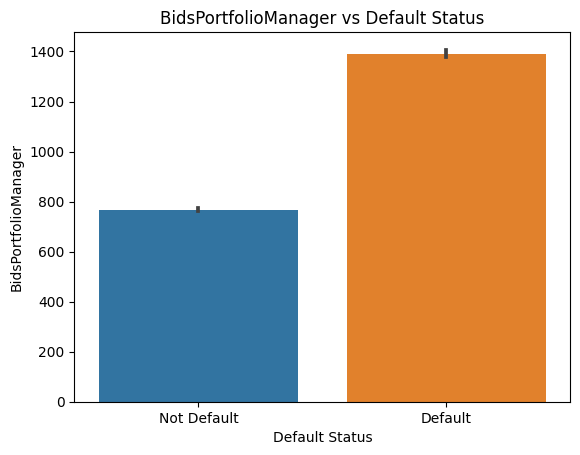

In [251]:
sns.barplot(x="Default Status",y="BidsPortfolioManager",data=df).set(title="BidsPortfolioManager vs Default Status")
plt.show()

* The average investment amount offered by portfolio managers is high for default borrowrs 

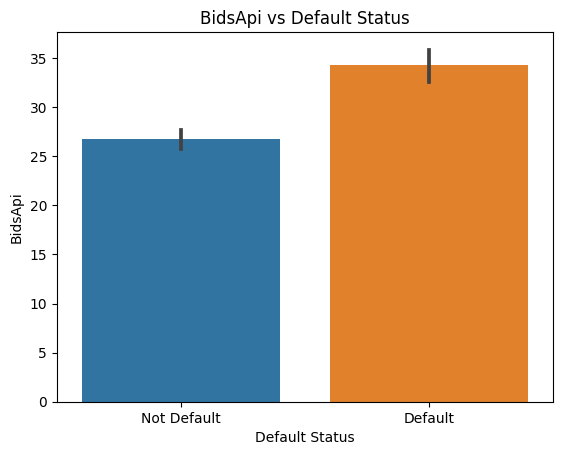

In [252]:
sns.barplot(x="Default Status",y="BidsApi",data=df).set(title="BidsApi vs Default Status")
plt.show()

* The average investment amount offered via api is high for default borrowrs 

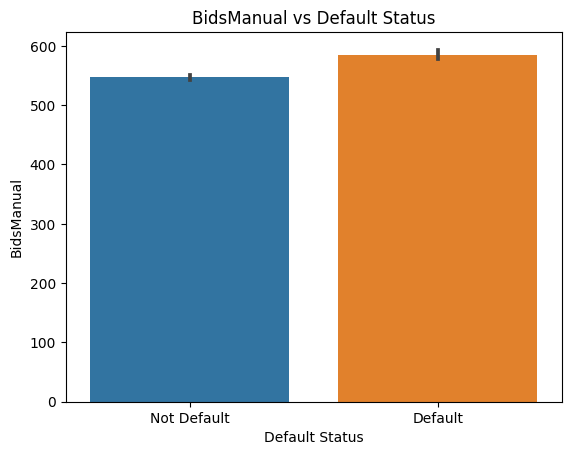

In [253]:
sns.barplot(x="Default Status",y="BidsManual",data=df).set(title="BidsManual vs Default Status")
plt.show()

* The average investment amount offer made manually is slightly high for default borrowrs than not default customers 

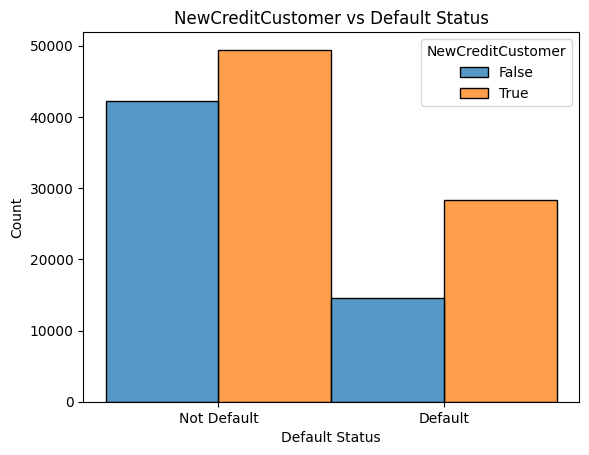

In [254]:
sns.histplot(binwidth=0.5, x="Default Status", hue="NewCreditCustomer", data=df, stat="count",multiple="dodge").set(title="NewCreditCustomer vs Default Status")
plt.show()

* in default borrowers, majority is new customers

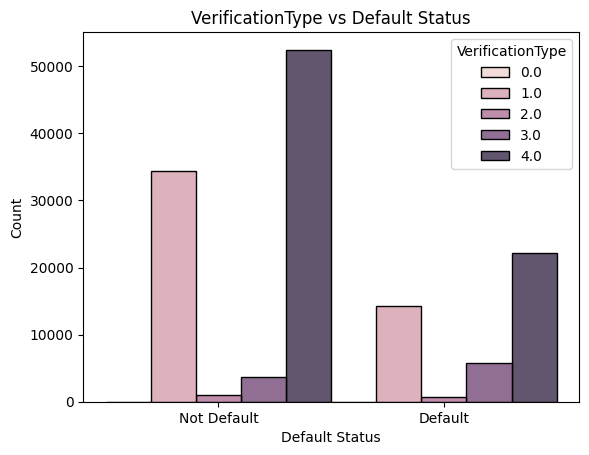

In [255]:
sns.histplot(x="Default Status",hue="VerificationType",data=df,stat="count",multiple="dodge").set(title="VerificationType vs Default Status")
plt.show()

* Majority customers done their income and expenses (4.0)verification

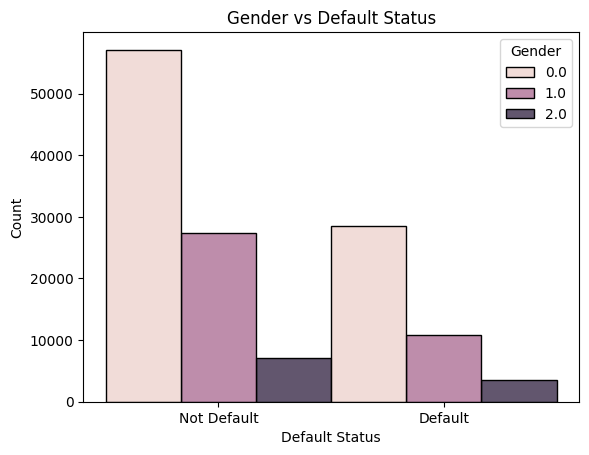

In [256]:
sns.histplot(x="Default Status",hue="Gender",data=df,stat="count",multiple="dodge").set(title="Gender vs Default Status")
plt.show()

* majority of the customers are men

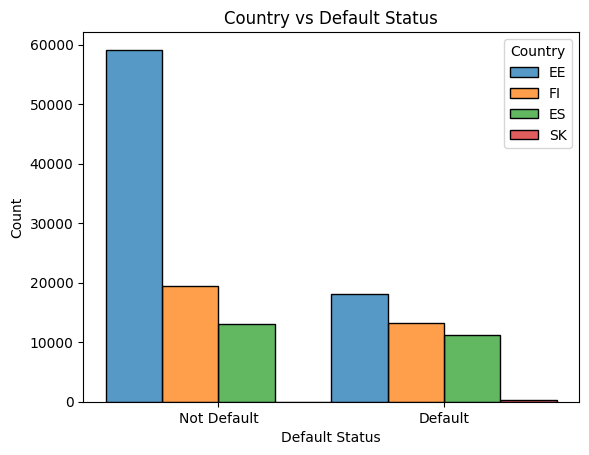

In [257]:
sns.histplot(x="Default Status",hue="Country",data=df,stat="count",multiple="dodge").set(title="Country vs Default Status")
plt.show()

* Majority of the default customers are from the country denoted as EE

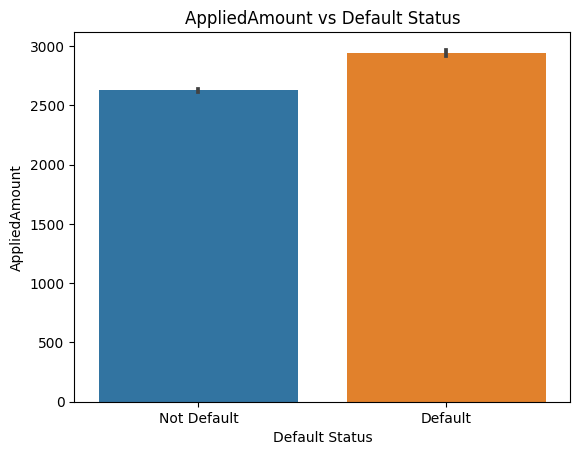

In [258]:
sns.barplot(x="Default Status",y="AppliedAmount",data=df).set(title="AppliedAmount vs Default Status")
plt.show()

* the average applied amount by default customers are slightly higher than not default customers

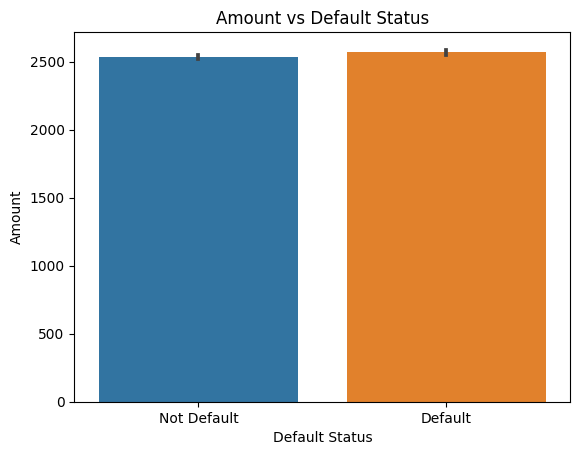

In [259]:
sns.barplot(x="Default Status",y="Amount",data=df).set(title="Amount vs Default Status")
plt.show()

* the average amount that provided to default customers are same as  Not default customers

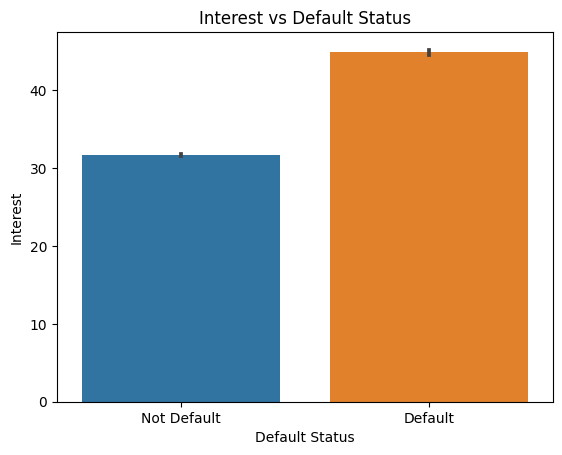

In [260]:
sns.barplot(x="Default Status",y="Interest",data=df).set(title="Interest vs Default Status")
plt.show()

* The interest amount for default customers are high

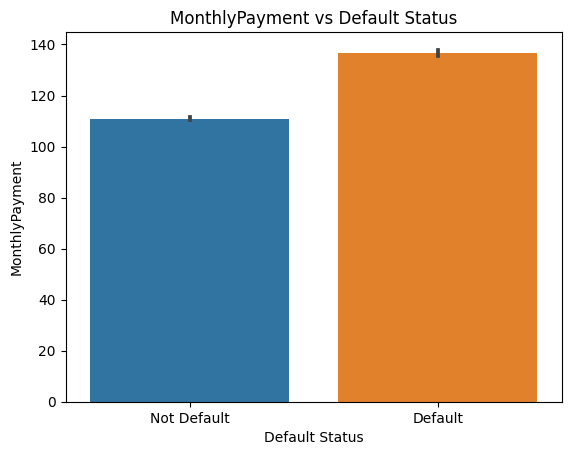

In [261]:
sns.barplot(x="Default Status",y="MonthlyPayment",data=df).set(title="MonthlyPayment vs Default Status")
plt.show()

* the monthly payment amount of default customers are high

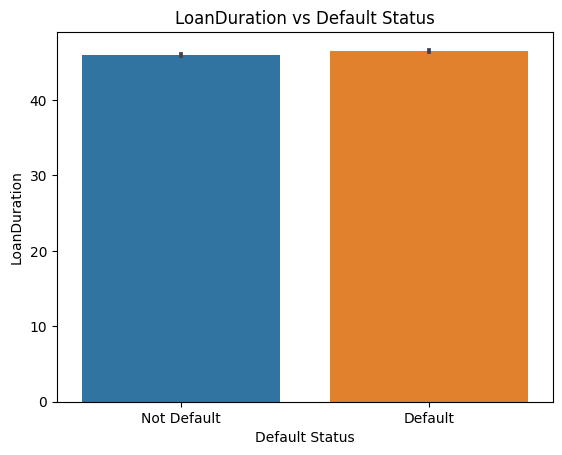

In [262]:
sns.barplot(x="Default Status",y="LoanDuration",data=df).set(title="LoanDuration vs Default Status")
plt.show()

In [263]:
df["UseOfLoan"].value_counts()

UseOfLoan
-1      97946
 7       9698
 2       9191
 0       6914
 6       3150
 3       1950
 5       1787
 8       1519
 4       1366
 1        955
 102       21
 110       17
 104        6
 101        5
 107        2
 108        1
 106        1
Name: count, dtype: int64

In [264]:
df["UseOfLoan"]=df["UseOfLoan"].replace(-1,1)

In [265]:
df["UseOfLoan"].value_counts()

UseOfLoan
1      98901
7       9698
2       9191
0       6914
6       3150
3       1950
5       1787
8       1519
4       1366
102       21
110       17
104        6
101        5
107        2
108        1
106        1
Name: count, dtype: int64

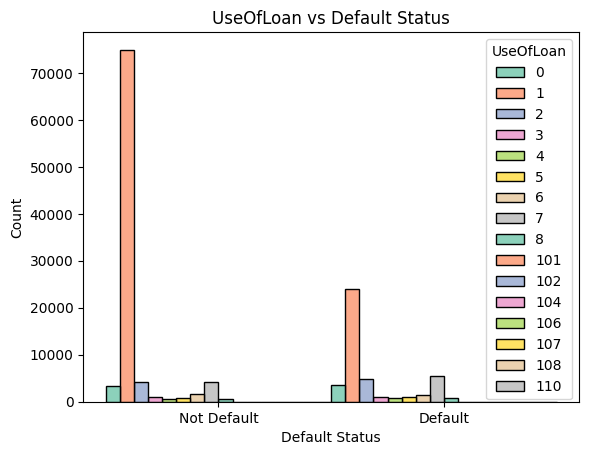

In [266]:
sns.histplot(x="Default Status",hue="UseOfLoan",data=df,stat="count",multiple="dodge",palette="Set2").set(title="UseOfLoan vs Default Status")
plt.show()

In [267]:
df["Education"].value_counts()

Education
 4.0    51375
 5.0    35398
 3.0    29260
 1.0    12057
 2.0     6427
 0.0        8
-1.0        4
Name: count, dtype: int64

In [268]:
df["Education"]=df["Education"].replace([-1,0],1)

In [269]:
df["Education"].value_counts()

Education
4.0    51375
5.0    35398
3.0    29260
1.0    12069
2.0     6427
Name: count, dtype: int64

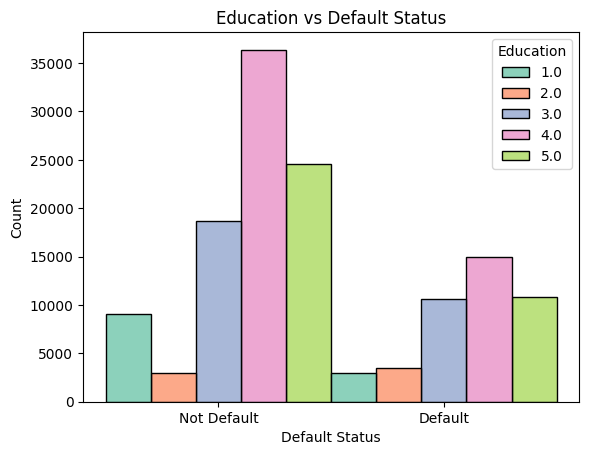

In [270]:
sns.histplot(x="Default Status",hue="Education",data=df,stat="count",multiple="dodge",palette="Set2").set(title="Education vs Default Status")
plt.show()

* majority of customers in both category has a minimum education qualification of secondary education(4.0)

In [271]:
df["MaritalStatus"].value_counts()

MaritalStatus
-1.0    97991
 3.0    12400
 1.0    10752
 2.0     9400
 4.0     3377
 5.0      601
 0.0        8
Name: count, dtype: int64

In [272]:
df["MaritalStatus"]=df["MaritalStatus"].replace([-1,0],1)

In [273]:
df["MaritalStatus"].value_counts()

MaritalStatus
1.0    108751
3.0     12400
2.0      9400
4.0      3377
5.0       601
Name: count, dtype: int64

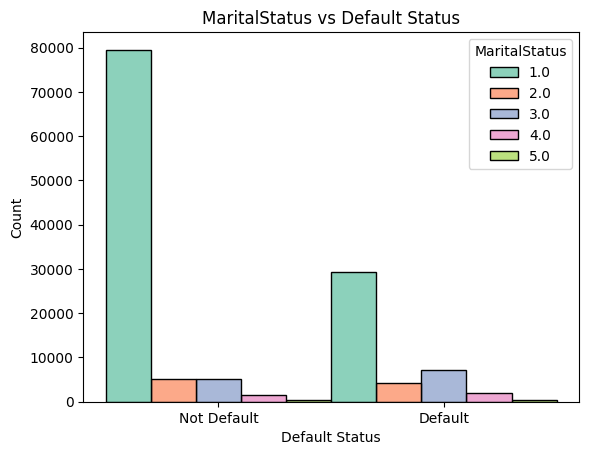

In [274]:
sns.histplot(x="Default Status",hue="MaritalStatus",data=df,palette="Set2",multiple="dodge",stat="count").set(title="MaritalStatus vs Default Status")
plt.show()

In [275]:
df["EmploymentStatus"].value_counts()

EmploymentStatus
-1.0    98143
 3.0    30060
 5.0     2007
 6.0     1800
 4.0     1303
 2.0     1184
 0.0       32
Name: count, dtype: int64

In [276]:
df["EmploymentStatus"]=df["EmploymentStatus"].replace([-1,0],1)

In [277]:
df["EmploymentStatus"].value_counts()

EmploymentStatus
1.0    98175
3.0    30060
5.0     2007
6.0     1800
4.0     1303
2.0     1184
Name: count, dtype: int64

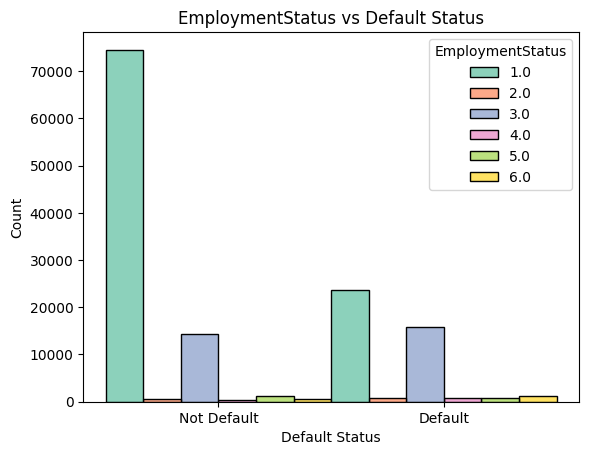

In [278]:
sns.histplot(x="Default Status",hue="EmploymentStatus",data=df,palette="Set2",multiple="dodge",stat="count").set(title="EmploymentStatus vs Default Status")
plt.show()

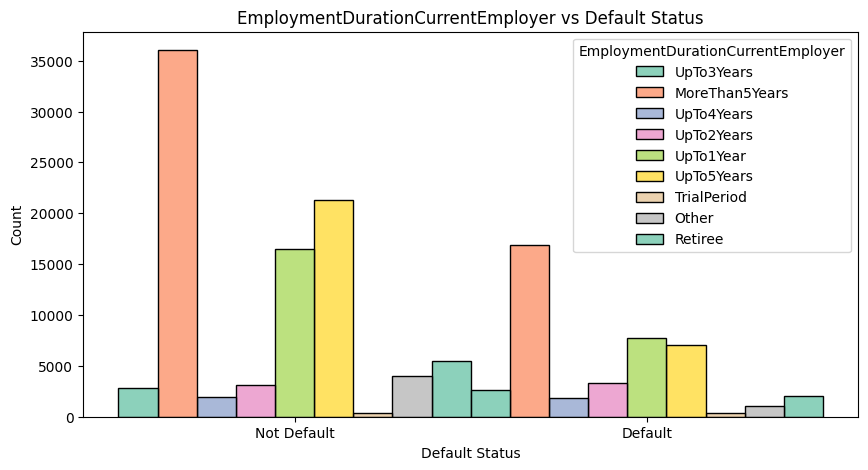

In [279]:
plt.figure(figsize=(10,5))
sns.histplot(x="Default Status",hue="EmploymentDurationCurrentEmployer",data=df,palette="Set2",multiple="dodge",stat="count").set(title="EmploymentDurationCurrentEmployer vs Default Status")
plt.show()

* majority of customers in both category have more than 5 yrs of experience with current employer

In [280]:
df["OccupationArea"]=df["OccupationArea"].replace([-1,0],1)

In [281]:
df["OccupationArea"].value_counts()

OccupationArea
1.0     106515
7.0       3587
6.0       3312
3.0       3198
8.0       2462
17.0      2424
9.0       2262
10.0      1933
15.0      1684
16.0      1430
11.0      1148
19.0      1000
14.0       843
18.0       619
4.0        587
13.0       564
12.0       477
5.0        362
2.0        122
Name: count, dtype: int64

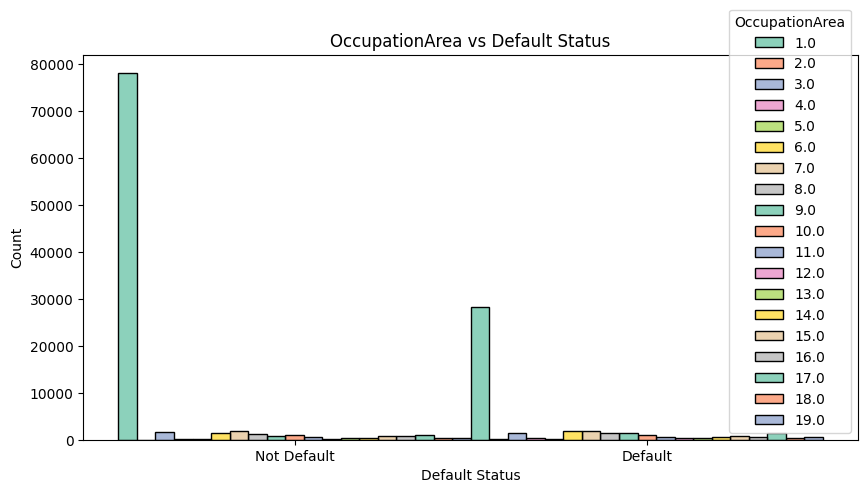

In [282]:
plt.figure(figsize=(10,5))
sns.histplot(x="Default Status",hue="OccupationArea",data=df,palette="Set2",multiple="dodge",stat="count").set(title="OccupationArea vs Default Status")
plt.show()

In [283]:
df["HomeOwnershipType"]=df["HomeOwnershipType"].replace(-1,1)

In [284]:
df["HomeOwnershipType"].value_counts()

HomeOwnershipType
1.0     48989
3.0     29579
2.0     20780
8.0     15457
10.0     7956
4.0      4582
7.0      3337
6.0      1618
5.0      1442
9.0       743
0.0        46
Name: count, dtype: int64

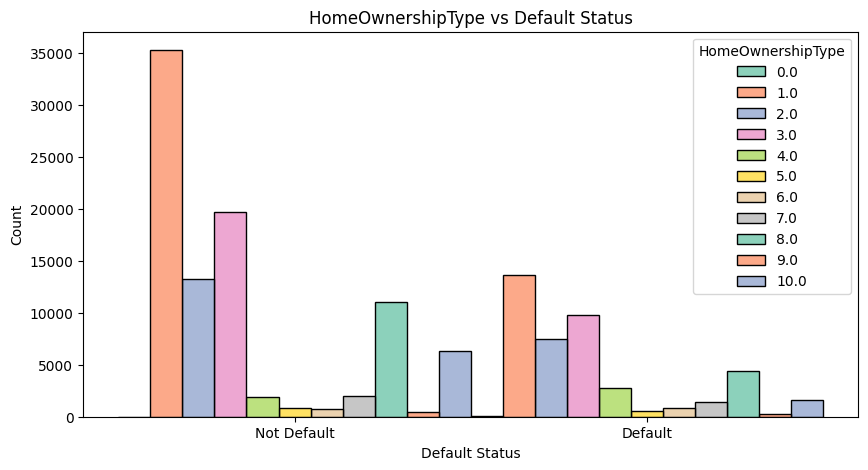

In [285]:
plt.figure(figsize=(10,5))
sns.histplot(x="Default Status",hue="HomeOwnershipType",data=df,palette="Set2",multiple="dodge",stat="count").set(title="HomeOwnershipType vs Default Status")
plt.show()

* majority of the customers own a house

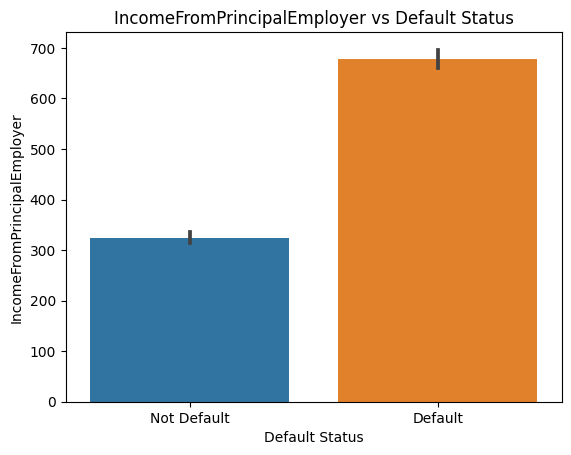

In [286]:
sns.barplot(x="Default Status",y="IncomeFromPrincipalEmployer",data=df).set(title="IncomeFromPrincipalEmployer vs Default Status")
plt.show()

* the average of the income of the default customers from principle employer is around 680 which is higher than not default customers

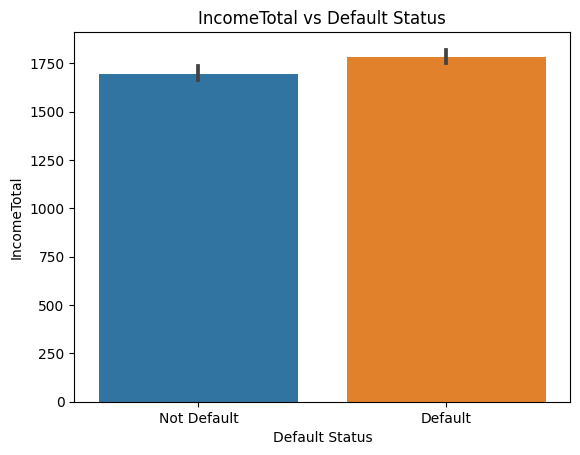

In [287]:
sns.barplot(x="Default Status",y="IncomeTotal",data=df).set(title="IncomeTotal vs Default Status")
plt.show()

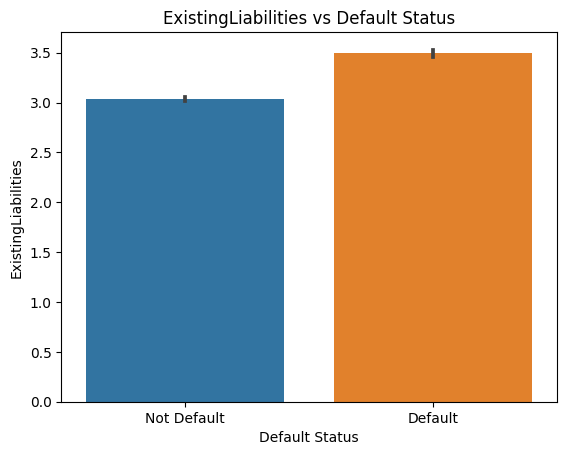

In [288]:
sns.barplot(x="Default Status",y="ExistingLiabilities",data=df).set(title="ExistingLiabilities vs Default Status")
plt.show()

* the existing liabilities of default customers are higher than not default customers

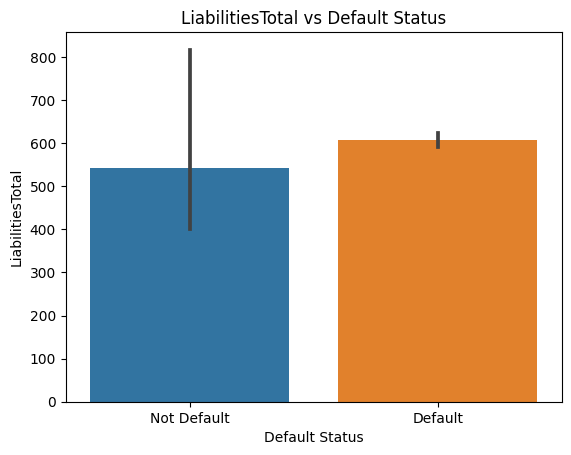

In [289]:
sns.barplot(x="Default Status",y="LiabilitiesTotal",data=df).set(title="LiabilitiesTotal vs Default Status")
plt.show()

In [290]:
df_lia=df[df["LiabilitiesTotal"]==0.00][["ExistingLiabilities","LiabilitiesTotal","RefinanceLiabilities"]]

In [291]:
df_lia

,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities
0,0,0.0,0
1,0,0.0,0
2,0,0.0,0
3,0,0.0,0
4,0,0.0,0
...,...,...,...
133963,0,0.0,0
133966,0,0.0,0
133967,0,0.0,0
133968,0,0.0,0


In [292]:
df_lia["ExistingLiabilities"].max()

16

<Axes: xlabel='ExistingLiabilities', ylabel='Density'>

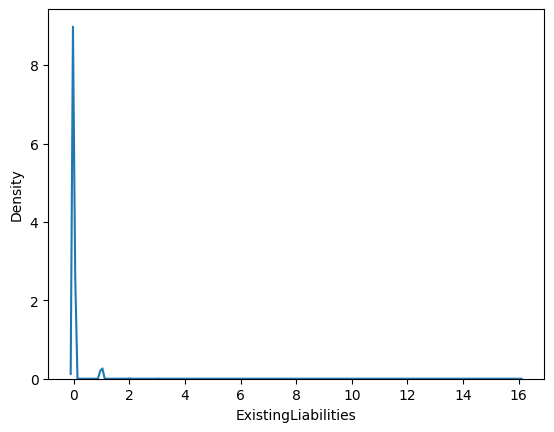

In [293]:
sns.kdeplot(df_lia["ExistingLiabilities"])

<Axes: xlabel='RefinanceLiabilities', ylabel='Density'>

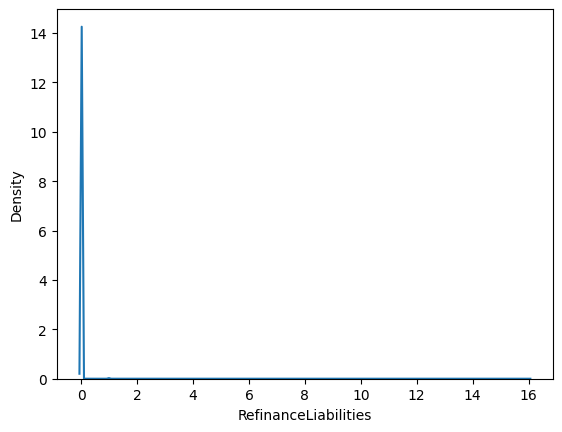

In [294]:
sns.kdeplot(df_lia["RefinanceLiabilities"])

In [295]:
df["ExistingLiabilities"].value_counts()

ExistingLiabilities
1     26891
0     26067
2     21018
3     15244
4     11494
5      8639
6      6451
7      4847
8      3569
9      2680
10     1914
11     1485
12     1094
13      796
14      603
15      425
16      317
17      245
18      189
19      130
20      100
21       69
22       66
23       51
24       36
25       23
26       18
27       15
28       10
31       10
30        8
29        8
32        7
33        3
36        2
39        2
35        1
34        1
40        1
Name: count, dtype: int64

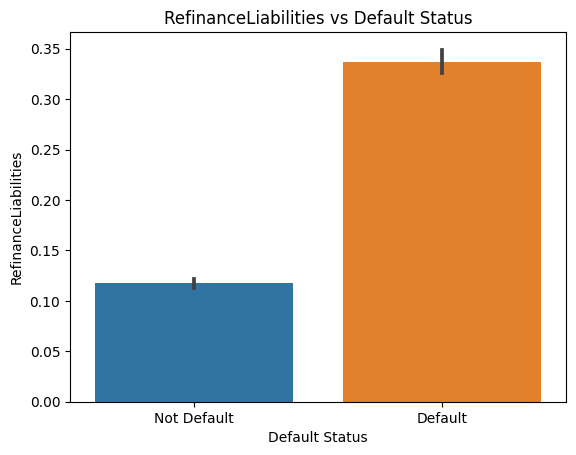

In [296]:
sns.barplot(x="Default Status",y="RefinanceLiabilities",data=df).set(title="RefinanceLiabilities vs Default Status")
plt.show()

* the refinance libilities of default customers is higher than not default customers

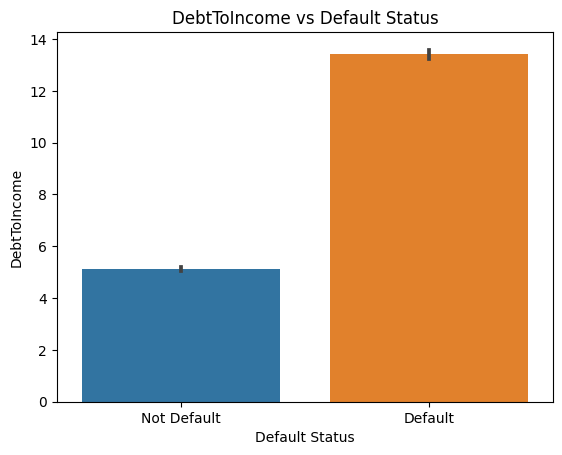

In [297]:
sns.barplot(x="Default Status",y="DebtToIncome",data=df).set(title="DebtToIncome vs Default Status")
plt.show()

<Axes: xlabel='DebtToIncome', ylabel='Density'>

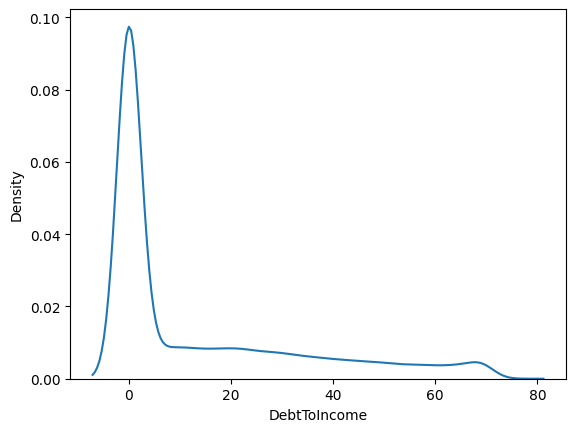

In [298]:
sns.kdeplot(defy["DebtToIncome"])

In [299]:
mmm(defy["DebtToIncome"])#either income or debt zero

mean 13.409873881014548
median 0.0
mode 0    0.0
Name: DebtToIncome, dtype: float64


* the average debt to income ration of default customers is around 14 and for not default customers is around 5

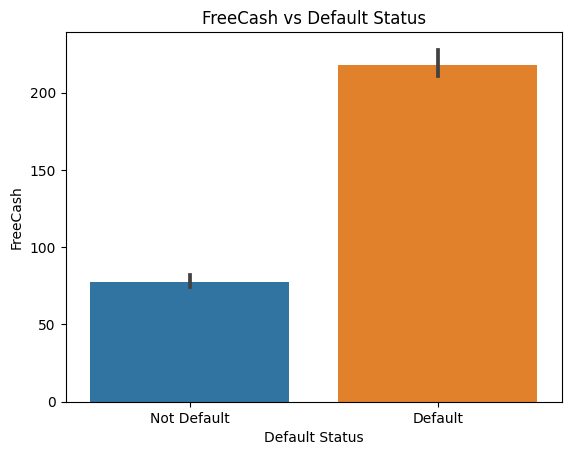

In [300]:
sns.barplot(x="Default Status",y="FreeCash",data=df).set(title="FreeCash vs Default Status")
plt.show()

<Axes: xlabel='FreeCash', ylabel='Density'>

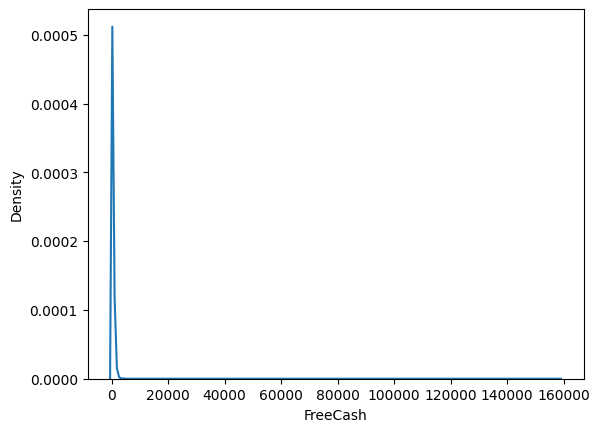

In [301]:
sns.kdeplot(defy["FreeCash"])

In [302]:
mmm(defy["FreeCash"])

mean 217.68797859940324
median 0.0
mode 0    0.0
Name: FreeCash, dtype: float64


* 50% people has no freecash

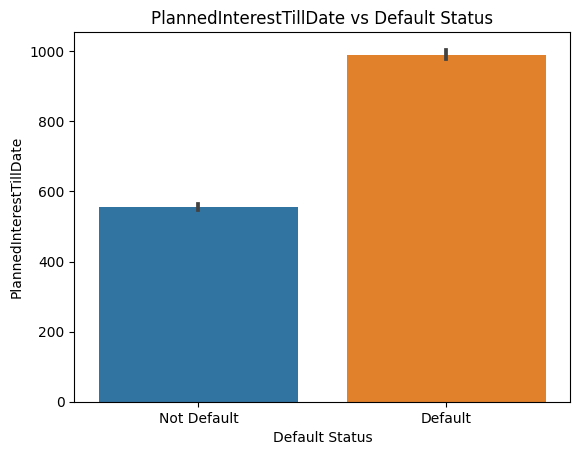

In [303]:
sns.barplot(x="Default Status",y="PlannedInterestTillDate",data=df).set(title="PlannedInterestTillDate vs Default Status")
plt.show()

* According to active schedule the amount of interest the investment should have received from default customers is high

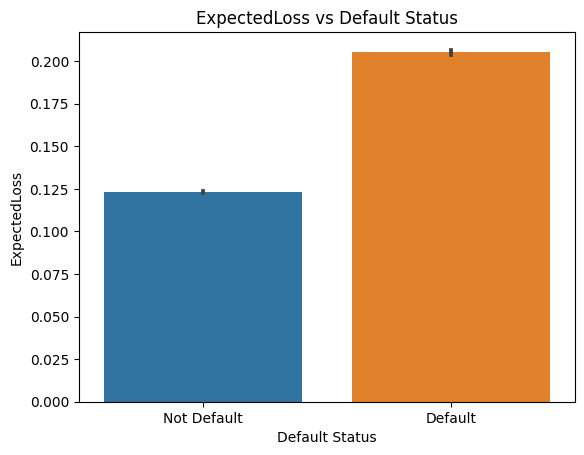

In [304]:
sns.barplot(x="Default Status",y="ExpectedLoss",data=df).set(title="ExpectedLoss vs Default Status")
plt.show()

* expected loss from default customers are high

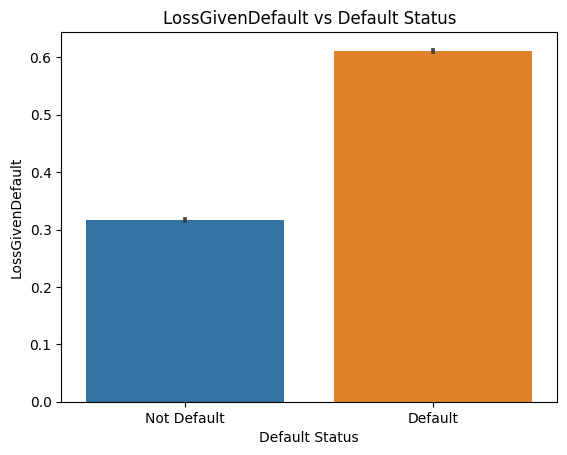

In [305]:
sns.barplot(x="Default Status",y="LossGivenDefault",data=df).set(title="LossGivenDefault vs Default Status")
plt.show()

* loss given default for default customers is high

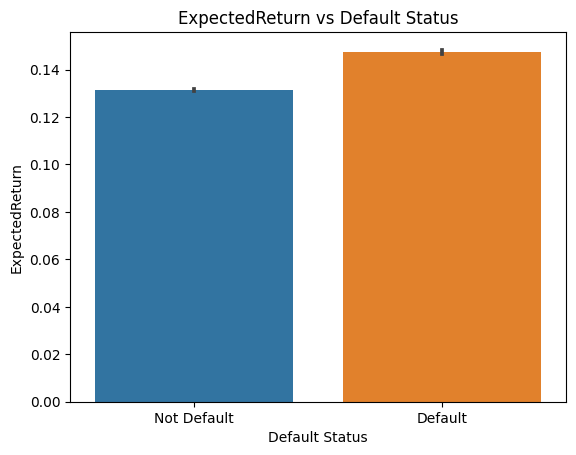

In [306]:
sns.barplot(x="Default Status",y="ExpectedReturn",data=df).set(title="ExpectedReturn vs Default Status")
plt.show()

* expected return from default customers are high

In [307]:
df["County"].nunique()

1010

In [308]:
df["City"].nunique()

7733

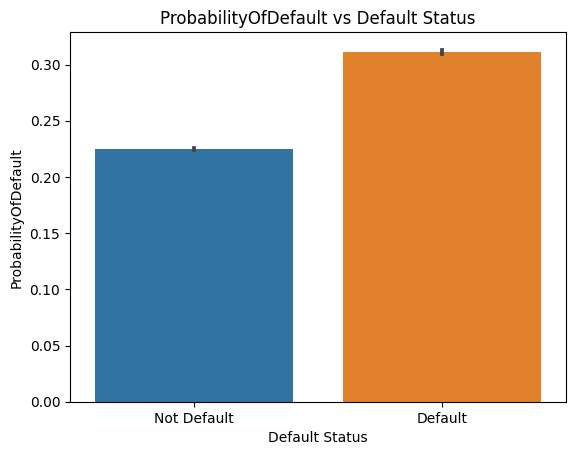

In [309]:
sns.barplot(x="Default Status",y="ProbabilityOfDefault",data=df).set(title="ProbabilityOfDefault vs Default Status")
plt.show()

* probability to get default is high for default customers

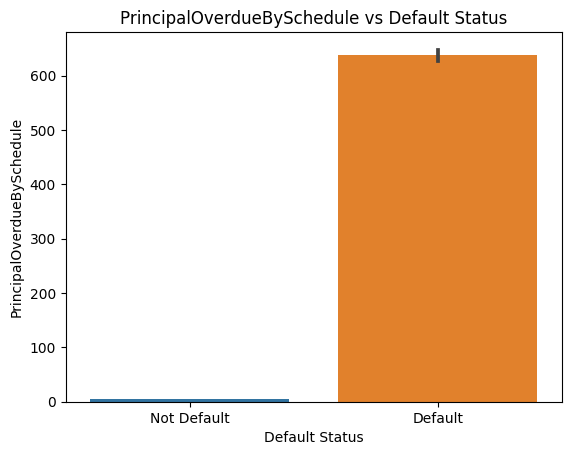

In [310]:
sns.barplot(x="Default Status",y="PrincipalOverdueBySchedule",data=df).set(title="PrincipalOverdueBySchedule vs Default Status")
plt.show()

* According to the current schedule, principal that is overdue by default customers is really high

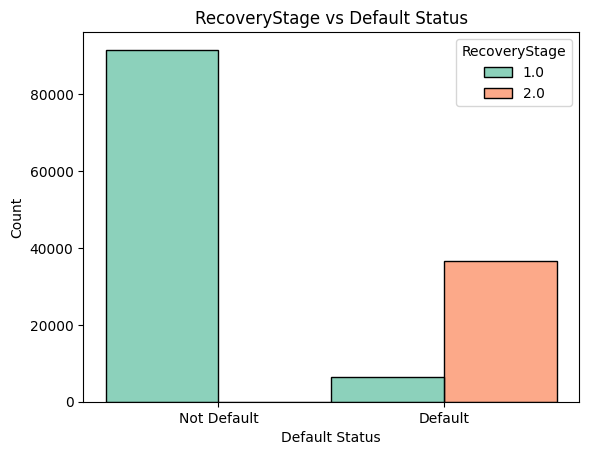

In [311]:
sns.histplot(x="Default Status",hue="RecoveryStage",data=df,palette="Set2",multiple="dodge",stat="count").set(title="RecoveryStage vs Default Status")
plt.show()

* in not default majority in collection stage and in default ,majority in recovery stage

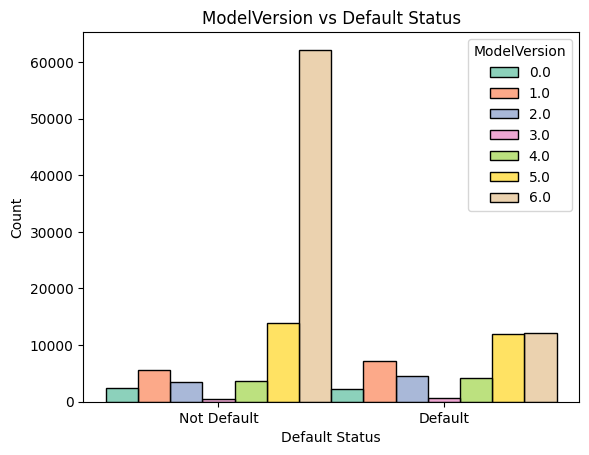

In [312]:
sns.histplot(x="Default Status",hue="ModelVersion",data=df,palette="Set2",multiple="dodge",stat="count").set(title="ModelVersion vs Default Status")
plt.show()

* majority uses version 6

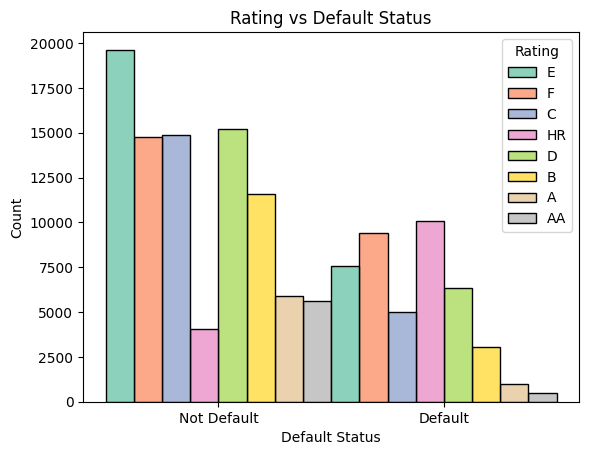

In [313]:
sns.histplot(x="Default Status",hue="Rating",data=df,palette="Set2",multiple="dodge",stat="count").set(title="Rating vs Default Status")
plt.show()

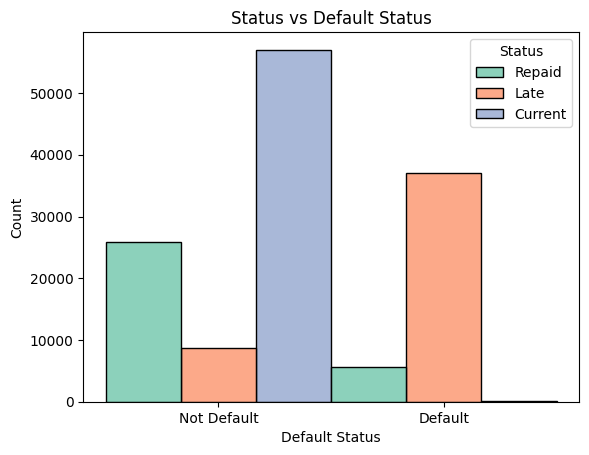

In [314]:
sns.histplot(x="Default Status",hue="Status",data=df,palette="Set2",multiple="dodge",stat="count").set(title="Status vs Default Status")
plt.show()

* majority not default customers currently paying with out due. majority default customers are paying late

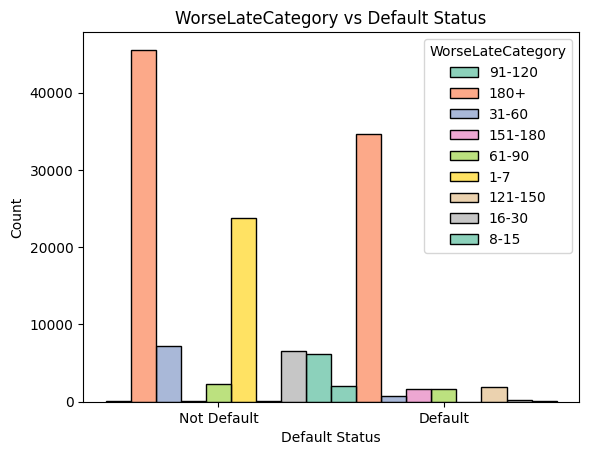

In [315]:
sns.histplot(x="Default Status",hue="WorseLateCategory",data=df,palette="Set2",multiple="dodge",stat="count").set(title="WorseLateCategory vs Default Status")
plt.show()

* in both cases the last longest period of days when the loan was in Principal Debt is 180+

In [316]:
df["CreditScoreEsMicroL"].value_counts()

CreditScoreEsMicroL
M      122013
M1       4321
M5       2432
M2       1723
M3       1644
M4       1540
M6        560
M8        102
M9         70
M7         69
M10        55
Name: count, dtype: int64

In [317]:
df["CreditScoreEsMicroL"].mode()

0    M
Name: CreditScoreEsMicroL, dtype: object

In [318]:
df["CreditScoreEsMicroL"]=df["CreditScoreEsMicroL"].replace("M","M1")

In [319]:
df["CreditScoreEsMicroL"].value_counts()

CreditScoreEsMicroL
M1     126334
M5       2432
M2       1723
M3       1644
M4       1540
M6        560
M8        102
M9         70
M7         69
M10        55
Name: count, dtype: int64

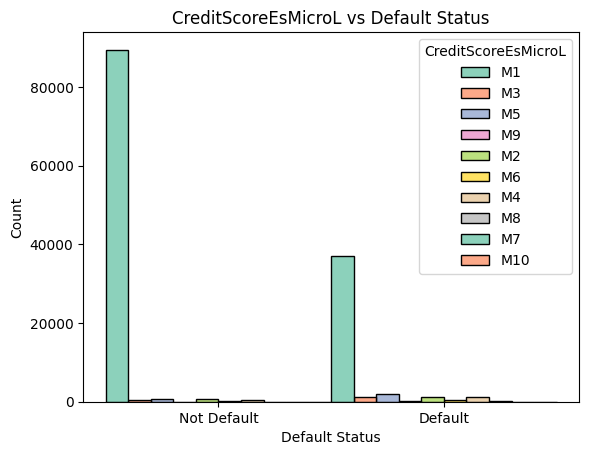

In [320]:
sns.histplot(x="Default Status",hue="CreditScoreEsMicroL",data=df,palette="Set2",multiple="dodge",stat="count").set(title="CreditScoreEsMicroL vs Default Status")
plt.show()

* a measure of the probability of default one month ahead-best score to the worst: M1, M2, M3, M4, M5, M6, M7, M8, M9, M10.

In [321]:
df["CreditScoreEeMini"].value_counts()

CreditScoreEeMini
1000.0    118853
800.0       5718
900.0       4887
700.0       2532
600.0       2462
500.0         76
0.0            1
Name: count, dtype: int64

In [322]:
df["CreditScoreEeMini"]=df["CreditScoreEeMini"].replace(0.0,1000.0)

In [323]:
df["CreditScoreEeMini"].value_counts()

CreditScoreEeMini
1000.0    118854
800.0       5718
900.0       4887
700.0       2532
600.0       2462
500.0         76
Name: count, dtype: int64

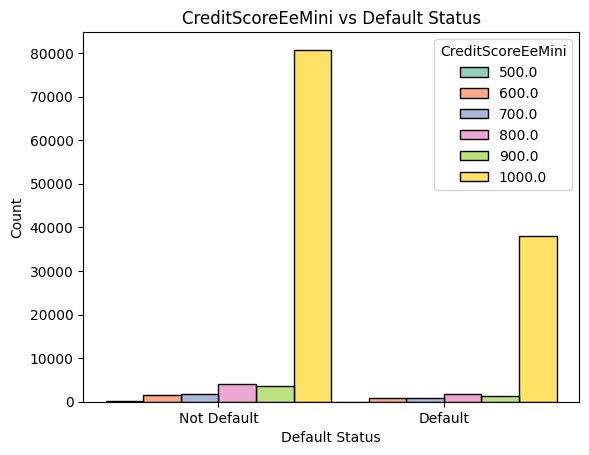

In [324]:
sns.histplot(x="Default Status",hue="CreditScoreEeMini",data=df,palette="Set2",multiple="dodge",stat="count").set(title="CreditScoreEeMini vs Default Status")
plt.show()

* 1000 No previous payments problems

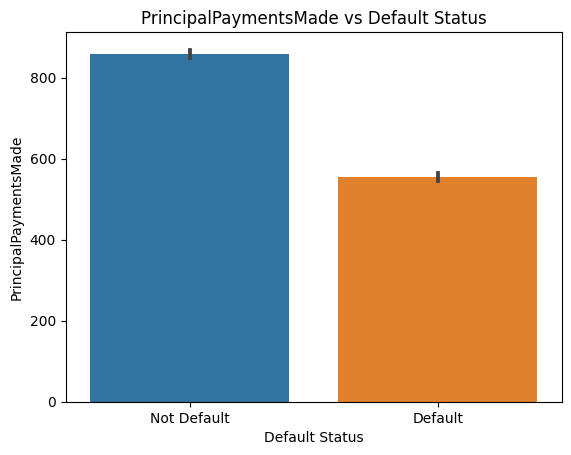

In [325]:
sns.barplot(x="Default Status",y="PrincipalPaymentsMade",data=df).set(title="PrincipalPaymentsMade vs Default Status")
plt.show()

* principal payment made by default customers is low 

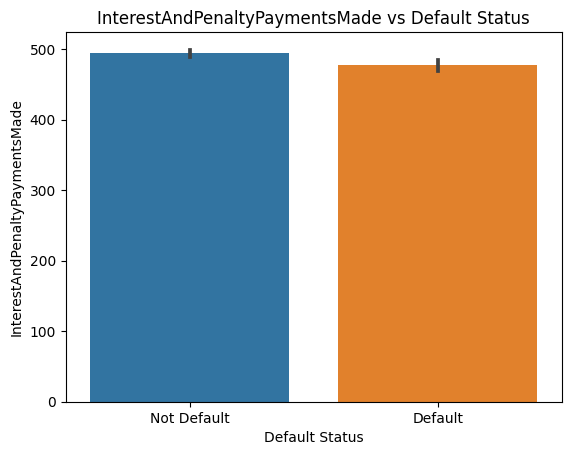

In [326]:
sns.barplot(x="Default Status",y="InterestAndPenaltyPaymentsMade",data=df).set(title="InterestAndPenaltyPaymentsMade vs Default Status")
plt.show()

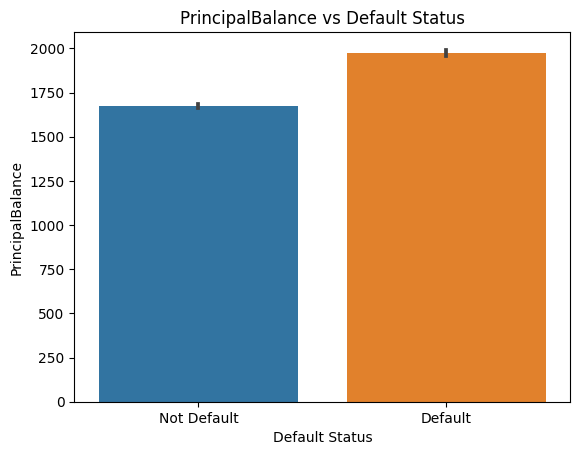

In [327]:
sns.barplot(x="Default Status",y="PrincipalBalance",data=df).set(title="PrincipalBalance vs Default Status")
plt.show()

* Principal that still needs to be paid by the default borrower is high 

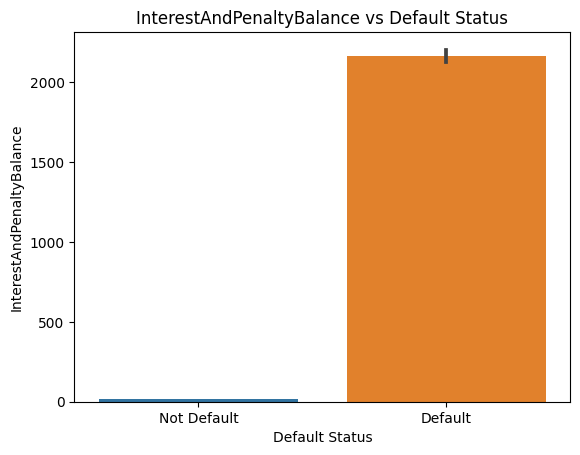

In [328]:
sns.barplot(x="Default Status",y="InterestAndPenaltyBalance",data=df).set(title="InterestAndPenaltyBalance vs Default Status")
plt.show()

* Unpaid interest and penalties from default customers are high

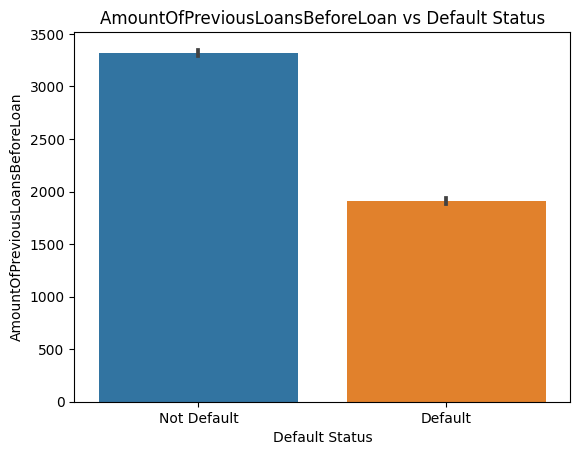

In [329]:
sns.barplot(x="Default Status",y="AmountOfPreviousLoansBeforeLoan",data=df).set(title="AmountOfPreviousLoansBeforeLoan vs Default Status")
plt.show()

* amount of previous loan is high for not default customers

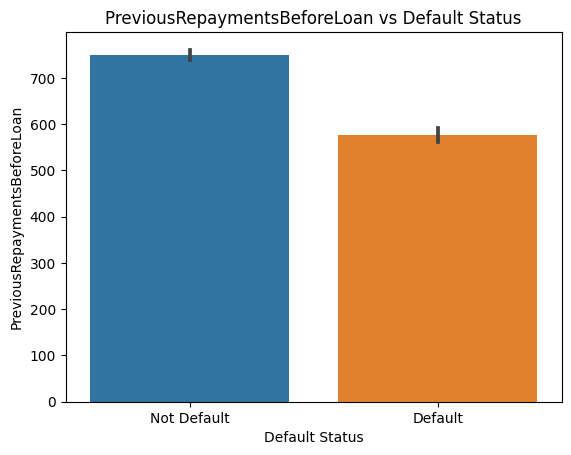

In [330]:
sns.barplot(x="Default Status",y="PreviousRepaymentsBeforeLoan",data=df).set(title="PreviousRepaymentsBeforeLoan vs Default Status")
plt.show()

* previous repayments before loan is high for not default customers

In [331]:
df["NoOfPreviousLoansBeforeLoan"].value_counts()

NoOfPreviousLoansBeforeLoan
0     66653
1     26449
2     14257
3      8383
4      5542
5      3836
6      2698
7      1958
8      1424
9      1018
10      713
11      493
12      340
13      234
14      169
15      114
16       75
17       58
18       39
19       23
20       18
21       11
22        9
23        7
24        6
25        2
Name: count, dtype: int64

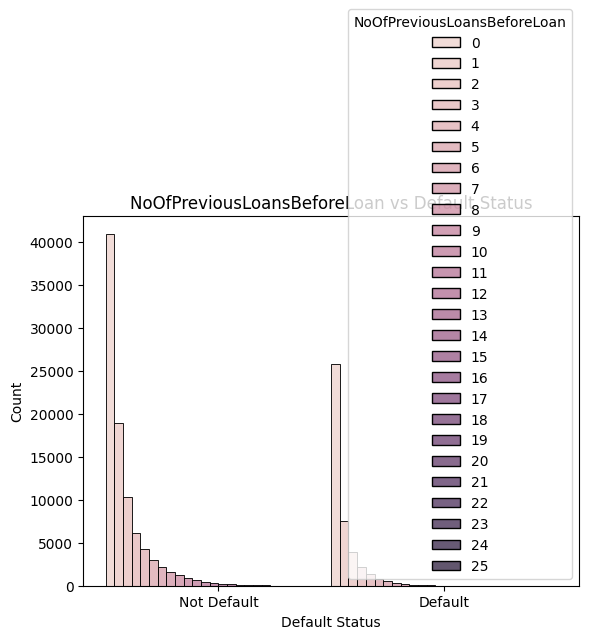

In [332]:
sns.histplot(x="Default Status",hue="NoOfPreviousLoansBeforeLoan",data=df,multiple="dodge",stat="count").set(title="NoOfPreviousLoansBeforeLoan vs Default Status")
plt.show()

In [333]:
df["PreviousEarlyRepaymentsCountBeforeLoan"].dtypes

dtype('int64')

In [334]:
df["PreviousEarlyRepaymentsCountBeforeLoan"].value_counts()


PreviousEarlyRepaymentsCountBeforeLoan
0     127607
1       5402
2        978
3        337
4        116
5         31
7         23
6         18
8         10
9          5
11         2
Name: count, dtype: int64

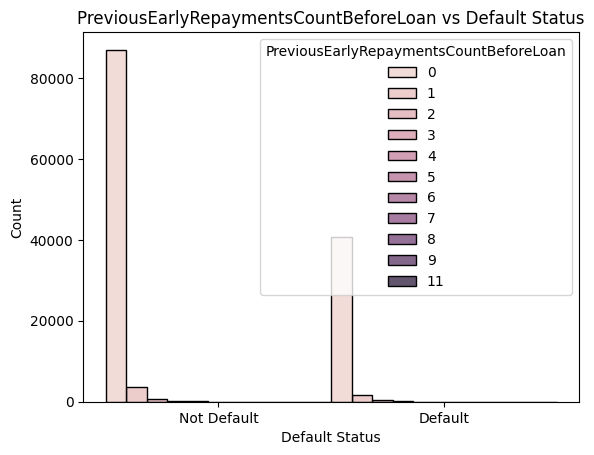

In [335]:
sns.histplot(x="Default Status",hue="PreviousEarlyRepaymentsCountBeforeLoan",data=df,multiple="dodge",stat="count").set(title="PreviousEarlyRepaymentsCountBeforeLoan vs Default Status")
plt.show()

In [336]:
df["NextPaymentNr"].value_counts()


NextPaymentNr
3.0     44919
0.0     32144
2.0      8918
4.0      7787
1.0      5869
        ...  
57.0       30
55.0       23
43.0       22
42.0       19
56.0       10
Name: count, Length: 61, dtype: int64

In [337]:
df["NrOfScheduledPayments"].value_counts()


NrOfScheduledPayments
60.0    89091
36.0    25002
48.0     5768
51.0     2153
54.0     1948
        ...  
5.0         8
63.0        5
7.0         4
66.0        3
2.0         1
Name: count, Length: 64, dtype: int64

In [338]:
df

,ListedOnUTC,BiddingStartedOn,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,LoanApplicationStartedDate,LoanDate,FirstPaymentDate,MaturityDate_Original,MaturityDate_Last,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,DateOfBirth,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,ActiveScheduleFirstPaymentReached,PlannedInterestTillDate,LastPaymentOn,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,PrincipalOverdueBySchedule,RecoveryStage,StageActiveSince,ModelVersion,Rating,Status,Restructured,WorseLateCategory,CreditScoreEsMicroL,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,NextPaymentNr,NrOfScheduledPayments,Default Status
0,2009-06-11 16:40:39,2009-06-11 16:40:39,0,0,115.0410,True,2009-06-11 16:40:39,2009-06-16,2009-07-27,2010-06-25,2010-06-25,17,5,2.0,1,61,1947-11-26,1.0,EE,319.5582,115.0408,30.00,12,119.083443,HARJU,TALLINN,7,3.0,1.0,3.0,UpTo3Years,7.0,1.0,6000.0,10500.0,0,0.00,0,0.00,0.00,25,True,319.0800,2010-07-06,0.149255,0.506748,0.136558,0.252434,0.00,1.0,NaN,6.0,E,Repaid,False,91-120,M1,1000.0,115.0408,20.4222,0.00,0.00,1,83.0852,0.0000,0,3.0,60.0,Not Default
1,2009-06-10 15:48:57,2009-06-10 15:48:57,0,0,140.6057,False,2009-06-10 15:48:57,2009-06-15,2009-07-15,2009-07-15,2009-07-15,20,4,2.0,1,48,1960-11-05,1.0,EE,191.7349,140.6057,25.00,1,119.083443,IDA-VIRU,KOHTLA-JARVE,7,5.0,4.0,3.0,MoreThan5Years,16.0,1.0,8300.0,10800.0,0,0.00,0,0.00,0.00,15,True,45.8300,2009-07-07,0.149255,0.506748,0.136558,0.252434,0.00,1.0,NaN,6.0,E,Repaid,False,180+,M1,1000.0,140.6057,2.0227,0.00,0.00,2,255.6467,258.6256,0,3.0,60.0,Not Default
2,2009-06-05 19:12:29,2009-06-05 19:12:29,0,0,319.5580,True,2009-06-05 19:12:29,2009-06-15,2009-07-27,2011-02-25,2014-05-13,20,6,2.0,1,58,1950-11-13,1.0,EE,319.5582,319.5409,25.00,20,119.083443,PÄRNU,PÄRNU,2,4.0,1.0,3.0,UpTo4Years,9.0,1.0,5000.0,7000.0,0,0.00,0,0.00,0.00,25,True,197.2926,2012-10-01,0.149255,0.506748,0.136558,0.252434,116.35,1.0,2016-03-03 00:00:00,6.0,E,Late,True,180+,M1,1000.0,203.1909,59.7626,116.35,414.07,0,0.0000,0.0000,0,3.0,60.0,Default
3,2009-06-13 12:01:20,2009-06-13 12:01:20,0,0,57.5205,True,2009-06-13 12:01:20,2009-06-15,2009-07-15,2010-09-15,2010-09-15,12,7,2.0,1,23,1986-03-29,1.0,EE,127.8233,57.5205,45.00,15,119.083443,HARJU,PALDISKI,0,2.0,3.0,1.0,UpTo2Years,1.0,1.0,11000.0,11600.0,0,0.00,0,0.00,0.00,15,True,293.1000,2010-09-15,0.149255,0.506748,0.136558,0.252434,0.00,1.0,NaN,6.0,E,Repaid,False,31-60,M1,1000.0,57.5205,18.7323,0.00,0.00,1,134.2144,0.0000,0,3.0,60.0,Not Default
4,2009-06-10 10:17:13,2009-06-10 10:17:13,0,0,319.5582,True,2009-06-10 10:17:13,2009-06-14,2009-07-27,2010-06-25,2010-06-25,10,4,2.0,1,25,1983-09-30,1.0,EE,319.5582,319.5436,30.00,12,119.083443,TARTU,TARTU,6,4.0,2.0,3.0,UpTo2Years,7.0,1.0,6800.0,6800.0,0,0.00,0,0.00,0.00,25,True,833.8100,2015-07-16,0.149255,0.506748,0.136558,0.252434,0.00,1.0,NaN,6.0,E,Repaid,False,180+,M1,1000.0,319.5436,220.4200,0.00,0.00,1,146.9966,0.0000,0,3.0,60.0,Default
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134524,2015-01-02 16:31:36,2015-01-02 16:31:36,2515,0,485.0000,True,2015-01-01 07:17:03,2015-01-06,2015-03-02,2020-02-03,2020-02-03,16,6,3.0,4,37,1977-02-07,0.0,FI,3000.0000,3000.0000,31.01,60,107.680000,PÄIJÄT-HÄME,LAHTI,0,3.0,3.0,3.0,MoreThan5Years

## Multivariate analysis

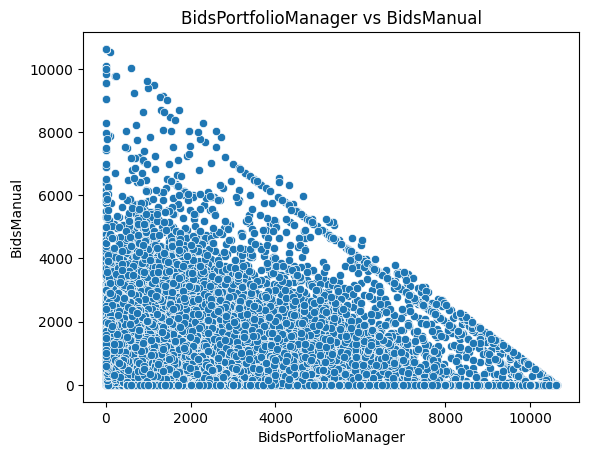

In [339]:
sns.scatterplot(x="BidsPortfolioManager",y="BidsManual",data=df).set(title="BidsPortfolioManager vs BidsManual")
plt.show()

* bidsportfoliomanager & bidsmanual shows a linear relation

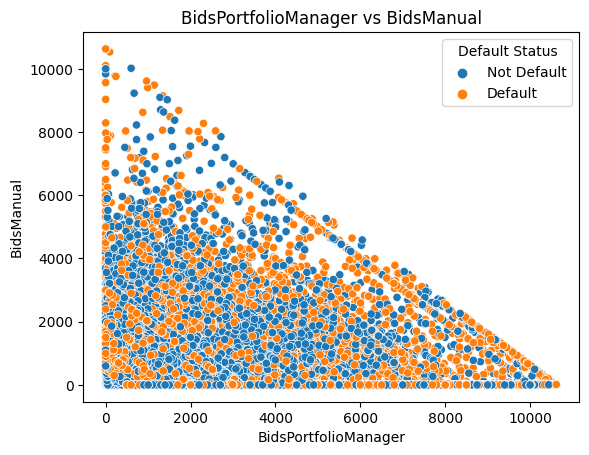

In [340]:
sns.scatterplot(x="BidsPortfolioManager",y="BidsManual",hue="Default Status",data=df).set(title="BidsPortfolioManager vs BidsManual")
plt.show()

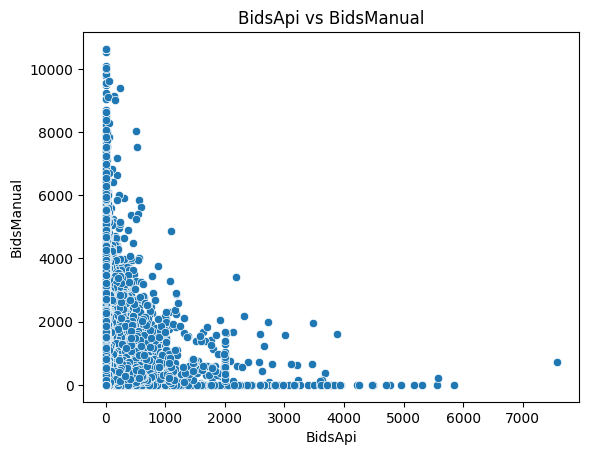

In [341]:
sns.scatterplot(x="BidsApi",y="BidsManual",data=df).set(title="BidsApi vs BidsManual")
plt.show()

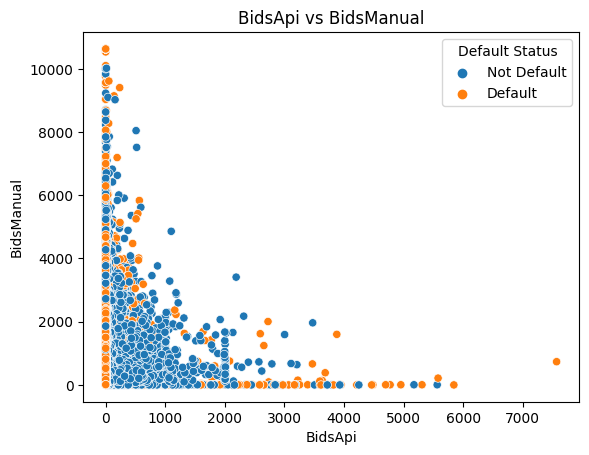

In [342]:
sns.scatterplot(x="BidsApi",y="BidsManual",hue="Default Status",data=df).set(title="BidsApi vs BidsManual")
plt.show()

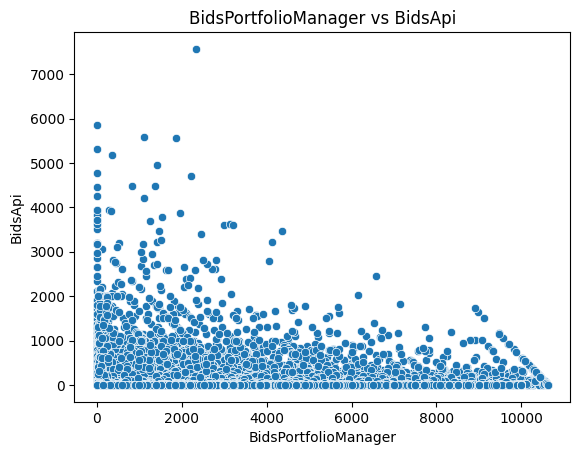

In [343]:
sns.scatterplot(x="BidsPortfolioManager",y="BidsApi",data=df).set(title="BidsPortfolioManager vs BidsApi")
plt.show()

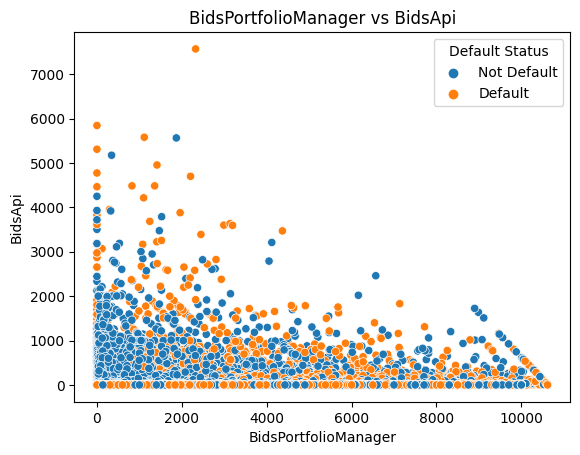

In [344]:
sns.scatterplot(x="BidsPortfolioManager",y="BidsApi",hue="Default Status",data=df).set(title="BidsPortfolioManager vs BidsApi")
plt.show()

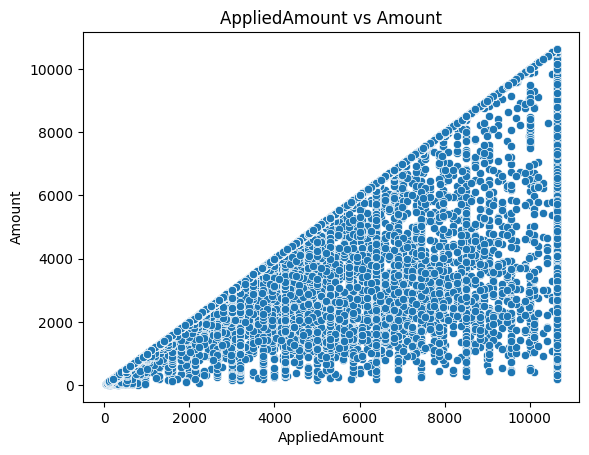

In [345]:
sns.scatterplot(x="AppliedAmount",y="Amount",data=df).set(title="AppliedAmount vs Amount")
plt.show()

* applied amount & amount shows a linear relation

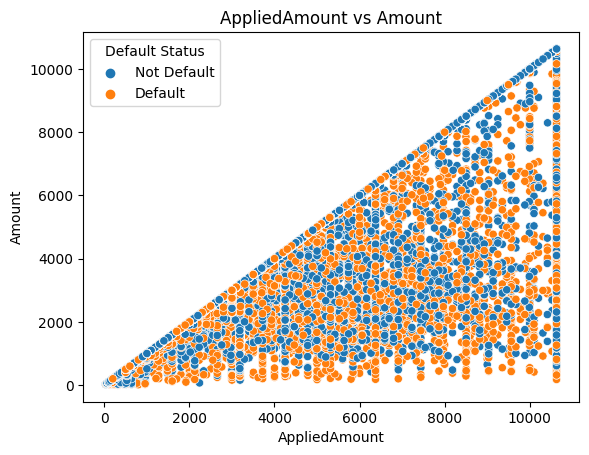

In [346]:
sns.scatterplot(x="AppliedAmount",y="Amount",hue="Default Status",data=df).set(title="AppliedAmount vs Amount")
plt.show()

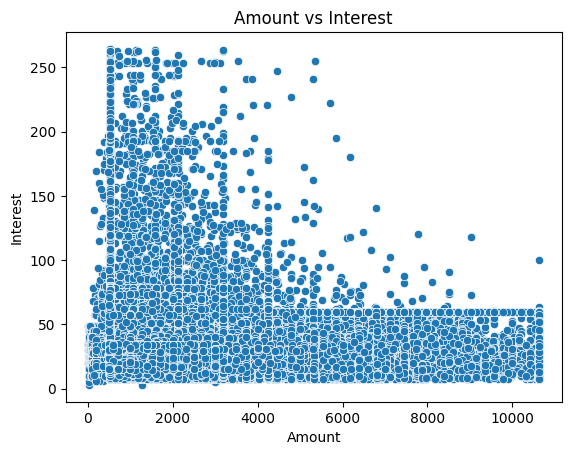

In [347]:
sns.scatterplot(x="Amount",y="Interest",data=df).set(title="Amount vs Interest")
plt.show()

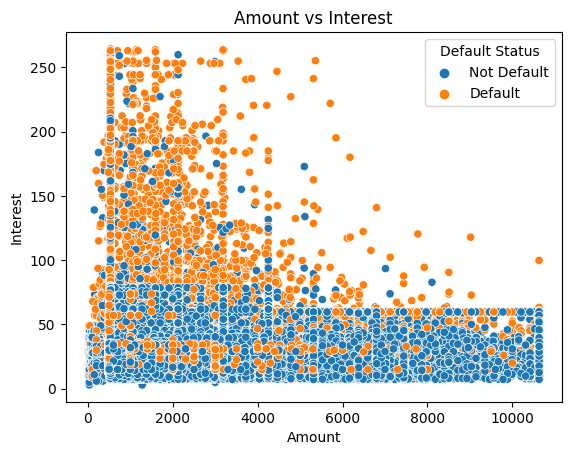

In [348]:
sns.scatterplot(x="Amount",y="Interest",hue="Default Status",data=df).set(title="Amount vs Interest")
plt.show()

* average applied amount and interest is higher for default customers

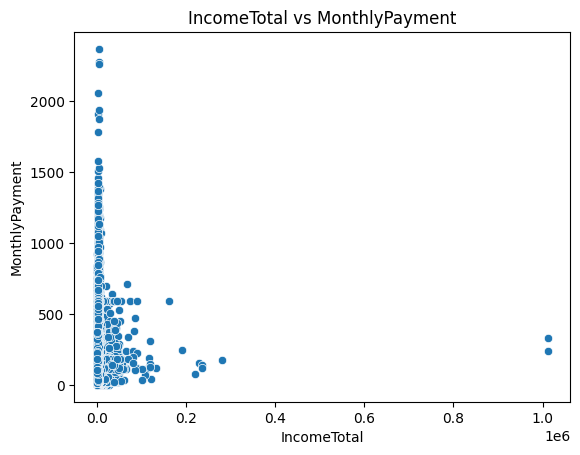

In [349]:
sns.scatterplot(x="IncomeTotal",y="MonthlyPayment",data=df).set(title="IncomeTotal vs MonthlyPayment")
plt.show()

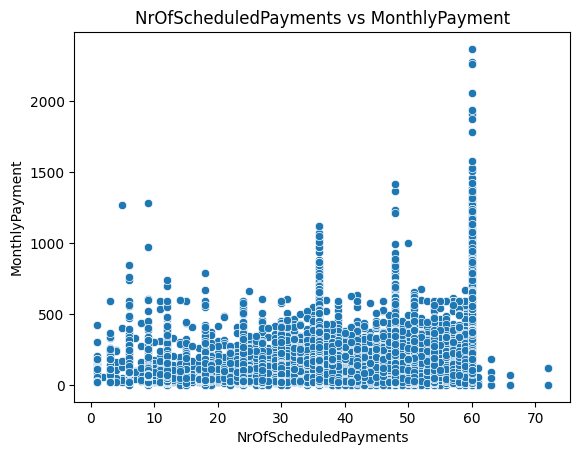

In [350]:
sns.scatterplot(x="NrOfScheduledPayments",y="MonthlyPayment",data=df).set(title="NrOfScheduledPayments vs MonthlyPayment")
plt.show()

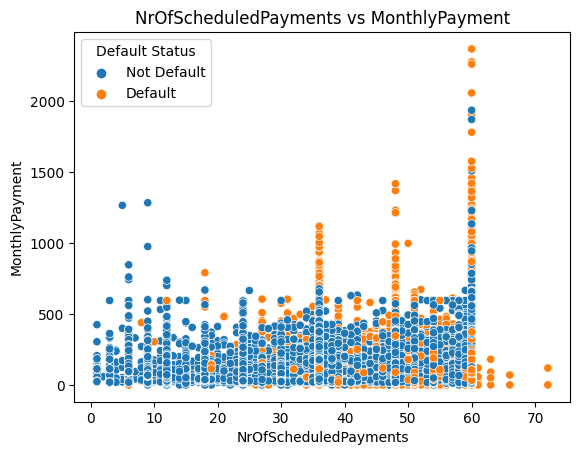

In [351]:
sns.scatterplot(x="NrOfScheduledPayments",y="MonthlyPayment",hue="Default Status",data=df).set(title="NrOfScheduledPayments vs MonthlyPayment")
plt.show()

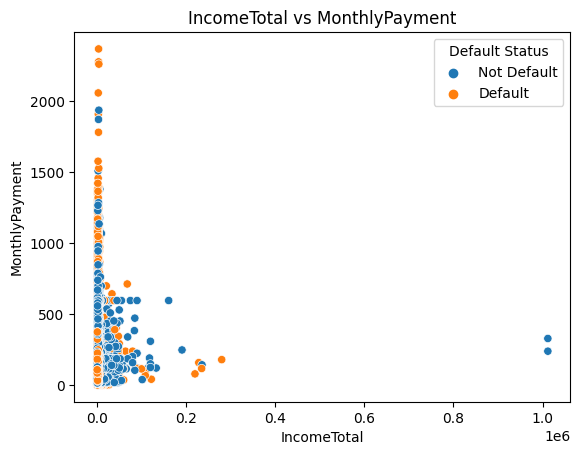

In [352]:
sns.scatterplot(x="IncomeTotal",y="MonthlyPayment",hue="Default Status",data=df).set(title="IncomeTotal vs MonthlyPayment")
plt.show()

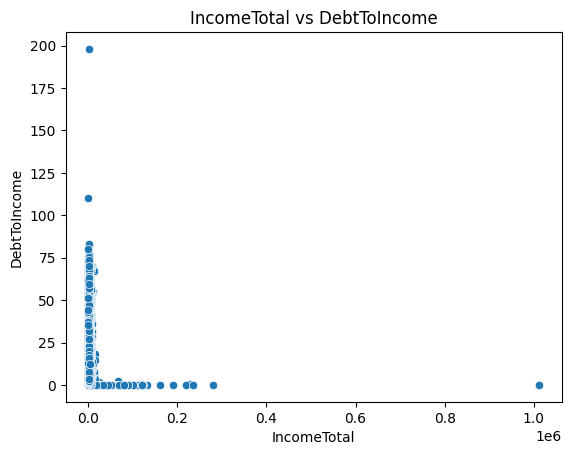

In [353]:
sns.scatterplot(x="IncomeTotal",y="DebtToIncome",data=df).set(title="IncomeTotal vs DebtToIncome")
plt.show()

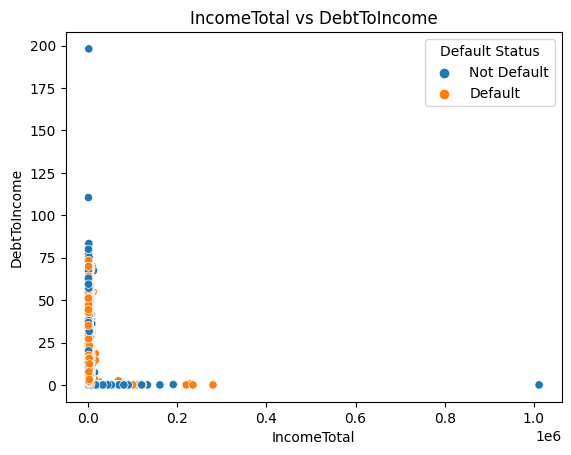

In [354]:
sns.scatterplot(x="IncomeTotal",y="DebtToIncome",hue="Default Status",data=df).set(title="IncomeTotal vs DebtToIncome")
plt.show()

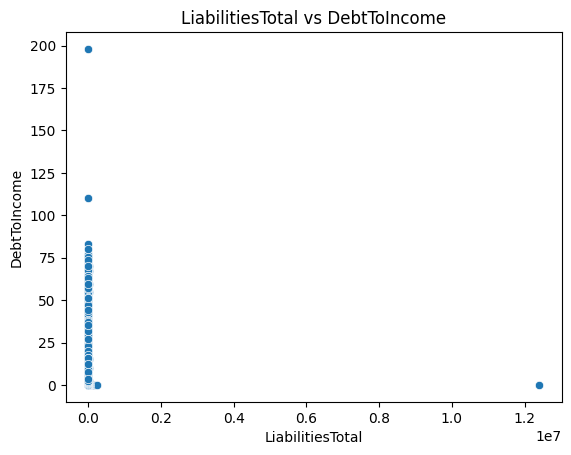

In [355]:
sns.scatterplot(x="LiabilitiesTotal",y="DebtToIncome",data=df).set(title="LiabilitiesTotal vs DebtToIncome")
plt.show()

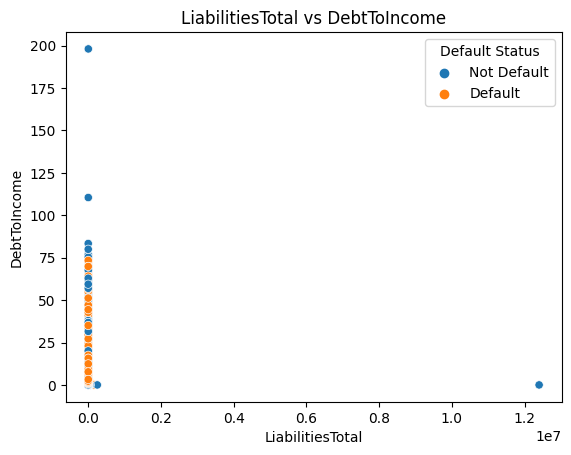

In [356]:
sns.scatterplot(x="LiabilitiesTotal",y="DebtToIncome",hue="Default Status",data=df).set(title="LiabilitiesTotal vs DebtToIncome")
plt.show()

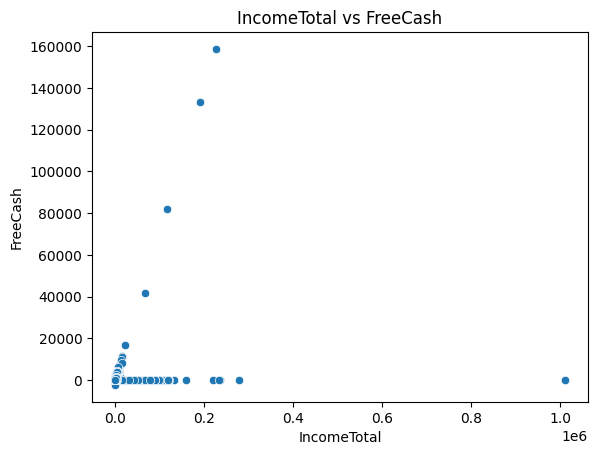

In [357]:
sns.scatterplot(x="IncomeTotal",y="FreeCash",data=df).set(title="IncomeTotal vs FreeCash")
plt.show()

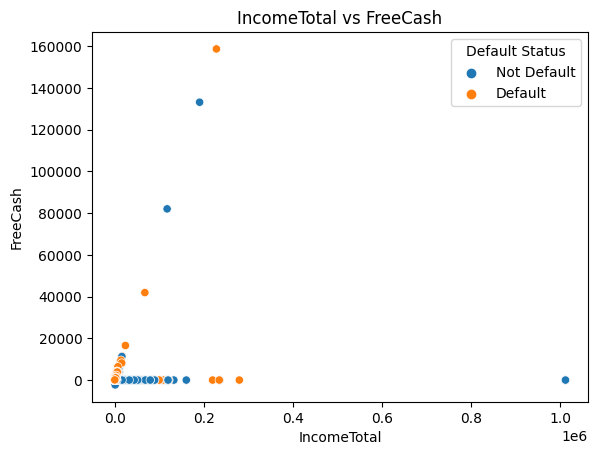

In [358]:
sns.scatterplot(x="IncomeTotal",y="FreeCash",hue="Default Status",data=df).set(title="IncomeTotal vs FreeCash")
plt.show()

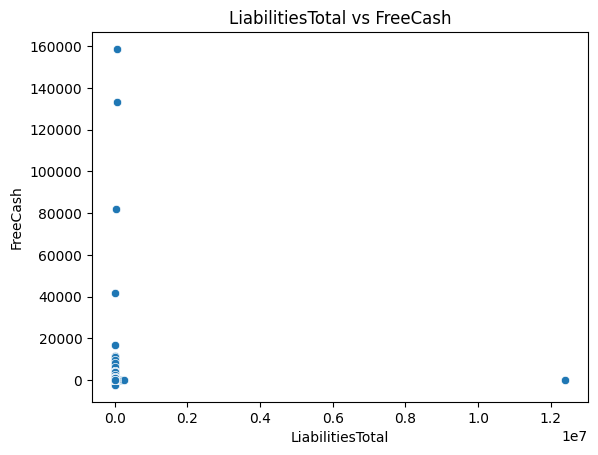

In [359]:
sns.scatterplot(x="LiabilitiesTotal",y="FreeCash",data=df).set(title="LiabilitiesTotal vs FreeCash")
plt.show()

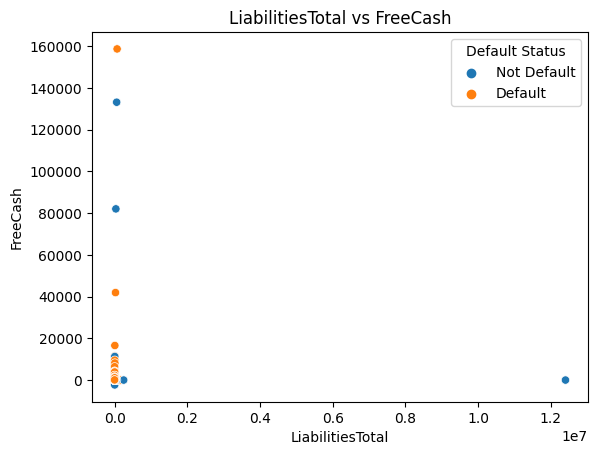

In [360]:
sns.scatterplot(x="LiabilitiesTotal",y="FreeCash",hue="Default Status",data=df).set(title="LiabilitiesTotal vs FreeCash")
plt.show()

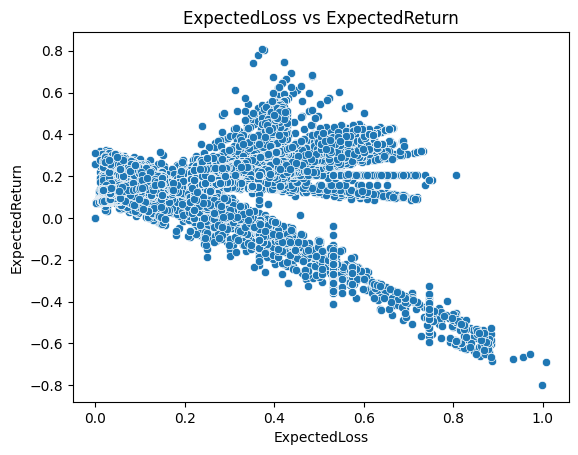

In [361]:
sns.scatterplot(x="ExpectedLoss",y="ExpectedReturn",data=df).set(title="ExpectedLoss vs ExpectedReturn")
plt.show()

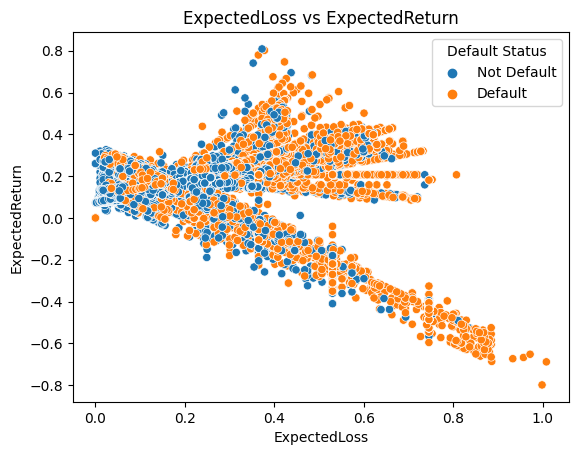

In [362]:
sns.scatterplot(x="ExpectedLoss",y="ExpectedReturn",hue="Default Status",data=df).set(title="ExpectedLoss vs ExpectedReturn")
plt.show()

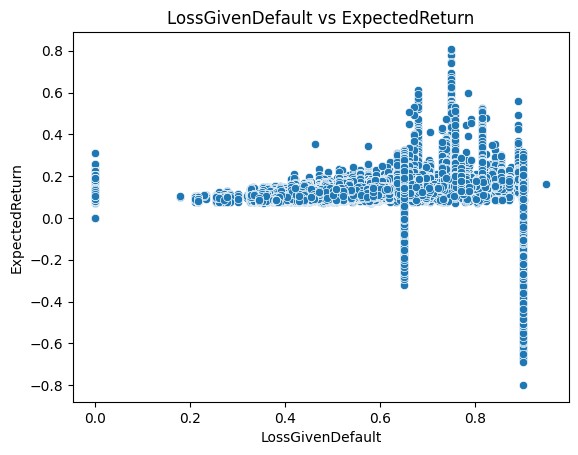

In [363]:
sns.scatterplot(x="LossGivenDefault",y="ExpectedReturn",data=df).set(title="LossGivenDefault vs ExpectedReturn")
plt.show()

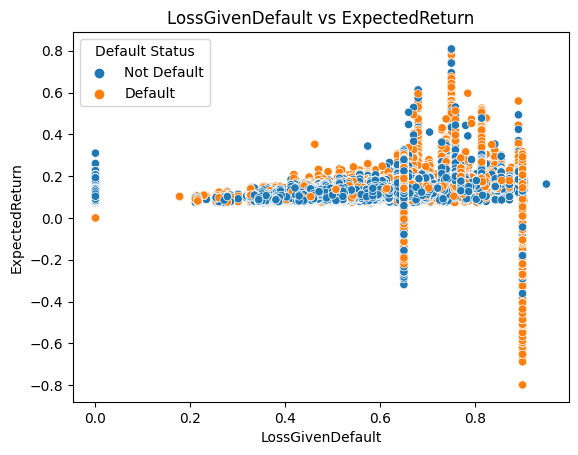

In [364]:
sns.scatterplot(x="LossGivenDefault",y="ExpectedReturn",hue="Default Status",data=df).set(title="LossGivenDefault vs ExpectedReturn")
plt.show()

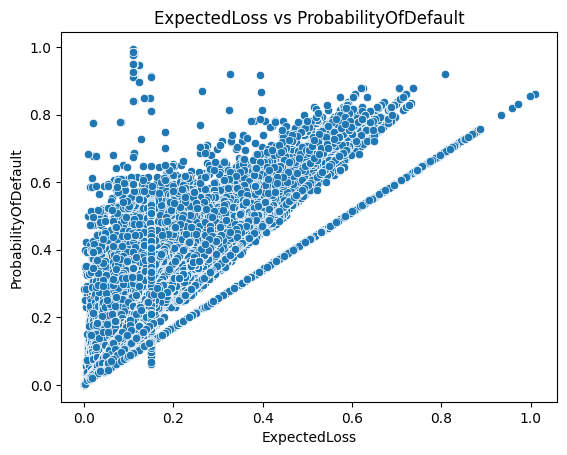

In [365]:
sns.scatterplot(x="ExpectedLoss",y="ProbabilityOfDefault",data=df).set(title="ExpectedLoss vs ProbabilityOfDefault")
plt.show()

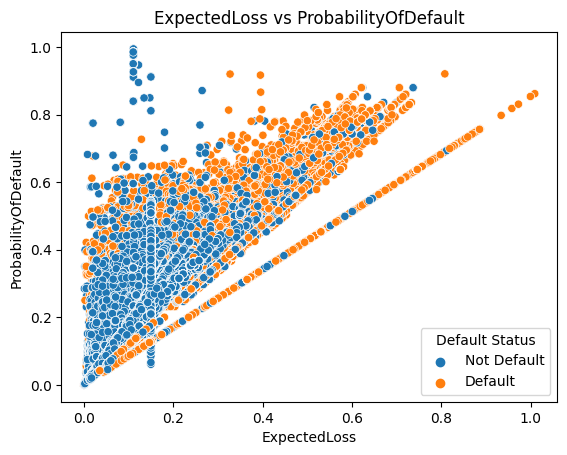

In [366]:
sns.scatterplot(x="ExpectedLoss",y="ProbabilityOfDefault",hue="Default Status",data=df).set(title="ExpectedLoss vs ProbabilityOfDefault")
plt.show()

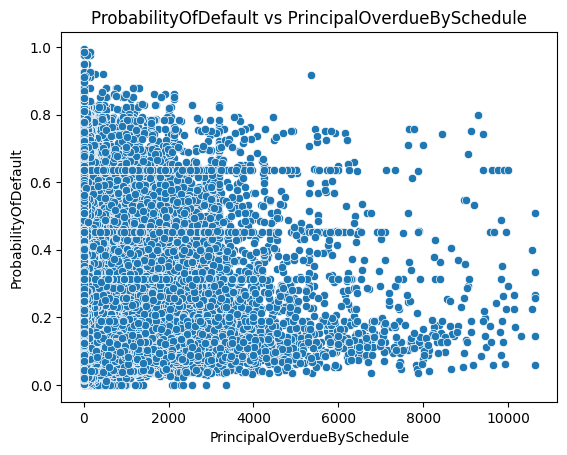

In [367]:
sns.scatterplot(y="ProbabilityOfDefault",x="PrincipalOverdueBySchedule",data=df).set(title="ProbabilityOfDefault vs PrincipalOverdueBySchedule")
plt.show()

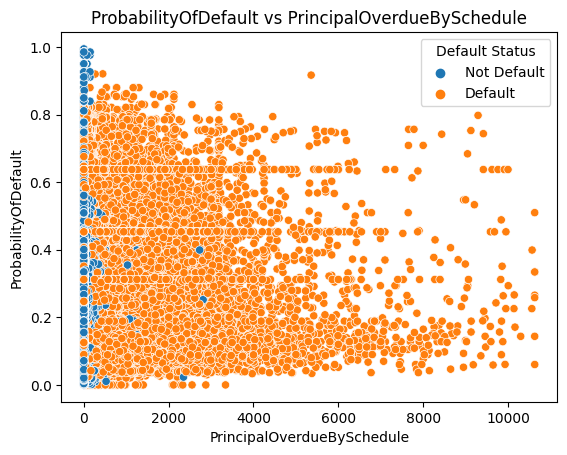

In [368]:
sns.scatterplot(y="ProbabilityOfDefault",x="PrincipalOverdueBySchedule",hue="Default Status",data=df).set(title="ProbabilityOfDefault vs PrincipalOverdueBySchedule")
plt.show()

* principal overdue by schedule and probability of efault is high for default customers

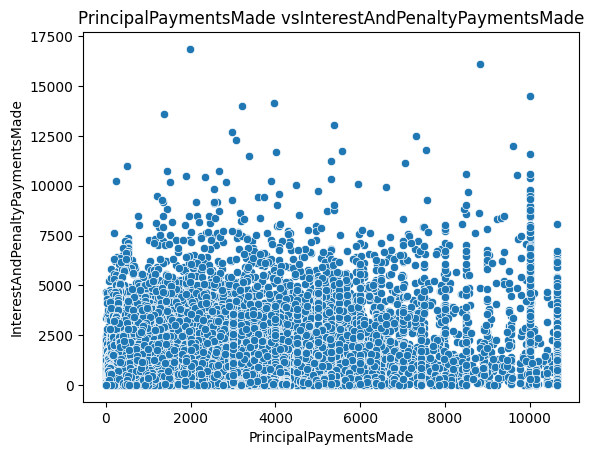

In [369]:
sns.scatterplot(y="InterestAndPenaltyPaymentsMade",x="PrincipalPaymentsMade",data=df).set(title="PrincipalPaymentsMade vsInterestAndPenaltyPaymentsMade")
plt.show()

C:\Users\Biji\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


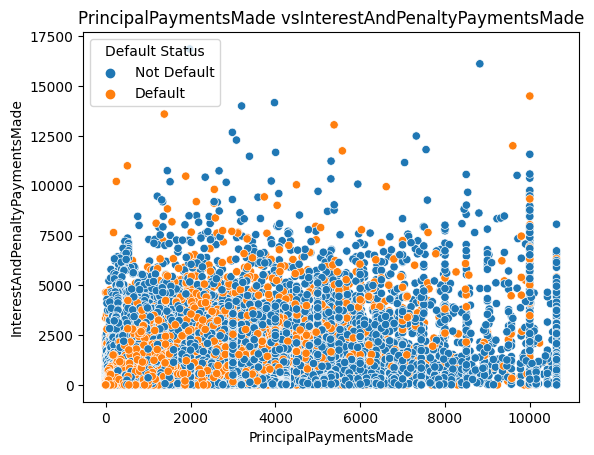

In [370]:
sns.scatterplot(y="InterestAndPenaltyPaymentsMade",x="PrincipalPaymentsMade",hue="Default Status",data=df).set(title="PrincipalPaymentsMade vsInterestAndPenaltyPaymentsMade")
plt.show()

In [371]:
df.shape

(134529, 69)

In [372]:
df.head(2)

,ListedOnUTC,BiddingStartedOn,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,LoanApplicationStartedDate,LoanDate,FirstPaymentDate,MaturityDate_Original,MaturityDate_Last,ApplicationSignedHour,ApplicationSignedWeekday,VerificationType,LanguageCode,Age,DateOfBirth,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,ActiveScheduleFirstPaymentReached,PlannedInterestTillDate,LastPaymentOn,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,PrincipalOverdueBySchedule,RecoveryStage,StageActiveSince,ModelVersion,Rating,Status,Restructured,WorseLateCategory,CreditScoreEsMicroL,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,NextPaymentNr,NrOfScheduledPayments,Default Status
0,2009-06-11 16:40:39,2009-06-11 16:40:39,0,0,115.0410,True,2009-06-11 16:40:39,2009-06-16,2009-07-27,2010-06-25,2010-06-25,17,5,2.0,1,61,1947-11-26,1.0,EE,319.5582,115.0408,30.0,12,119.083443,HARJU,TALLINN,7,3.0,1.0,3.0,UpTo3Years,7.0,1.0,6000.0,10500.0,0,0.0,0,0.0,0.0,25,True,319.08,2010-07-06,0.149255,0.506748,0.136558,0.252434,0.0,1.0,NaN,6.0,E,Repaid,False,91-120,M1,1000.0,115.0408,20.4222,0.0,0.0,1,83.0852,0.0000,0,3.0,60.0,Not Default
1,2009-06-10 15:48:57,2009-06-10 15:48:57,0,0,140.6057,False,2009-06-10 15:48:57,2009-06-15,2009-07-15,2009-07-15,2009-07-15,20,4,2.0,1,48,1960-11-05,1.0,EE,191.7349,140.6057,25.0,1,119.083443,IDA-VIRU,KOHTLA-JARVE,7,5.0,4.0,3.0,MoreThan5Years,16.0,1.0,8300.0,10800.0,0,0.0,0,0.0,0.0,15,True,45.83,2009-07-07,0.149255,0.506748,0.136558,0.252434,0.0,1.0,NaN,6.0,E,Repaid,False,180+,M1,1000.0,140.6057,2.0227,0.0,0.0,2,255.6467,258.6256,0,3.0,60.0,Not Default


<Axes: xlabel='Default Status'>

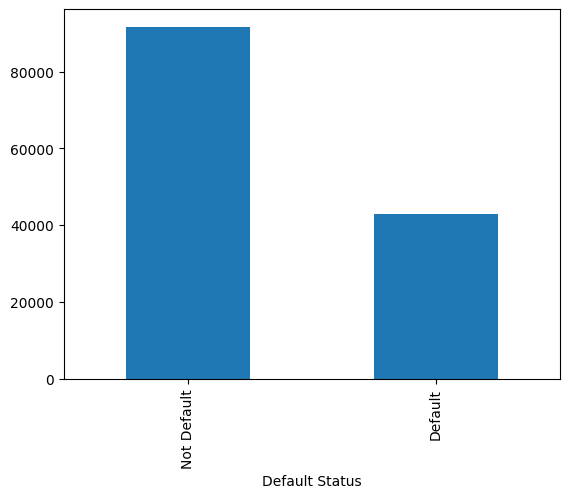

In [373]:
df["Default Status"].value_counts().plot(kind="bar")

In [374]:
df_income=df[df["IncomeFromPrincipalEmployer"]==0][["IncomeFromPrincipalEmployer","IncomeTotal"]]
df_income[df_income["IncomeTotal"]==0]#58 NUMBER

,IncomeFromPrincipalEmployer,IncomeTotal
889,0.0,0.0
915,0.0,0.0
919,0.0,0.0
922,0.0,0.0
930,0.0,0.0
956,0.0,0.0
1132,0.0,0.0
1137,0.0,0.0
1148,0.0,0.0
1166,0.0,0.0


<Axes: xlabel='NoOfPreviousLoansBeforeLoan', ylabel='Density'>

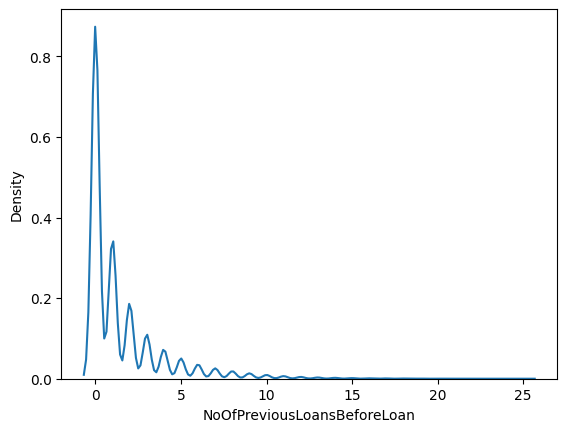

In [375]:
sns.kdeplot(df["NoOfPreviousLoansBeforeLoan"])

<Axes: xlabel='NoOfPreviousLoansBeforeLoan', ylabel='Amount'>

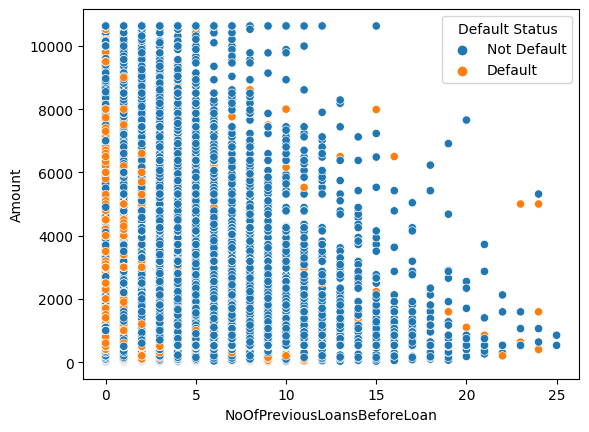

In [376]:
sns.scatterplot(x="NoOfPreviousLoansBeforeLoan",y="Amount",hue="Default Status",data=df)

<Axes: xlabel='MaritalStatus', ylabel='Amount'>

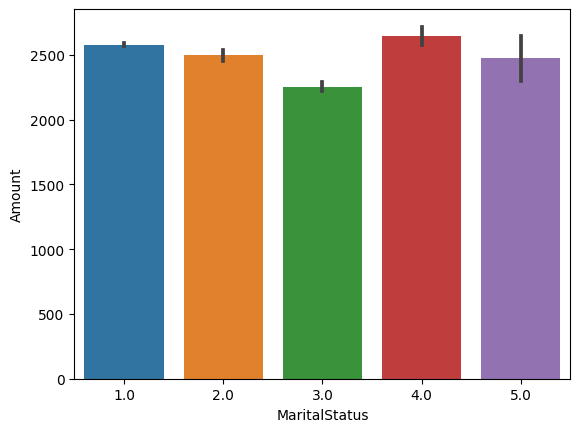

In [377]:
sns.barplot(x="MaritalStatus",y="Amount",data=df)

<Axes: xlabel='Education', ylabel='Amount'>

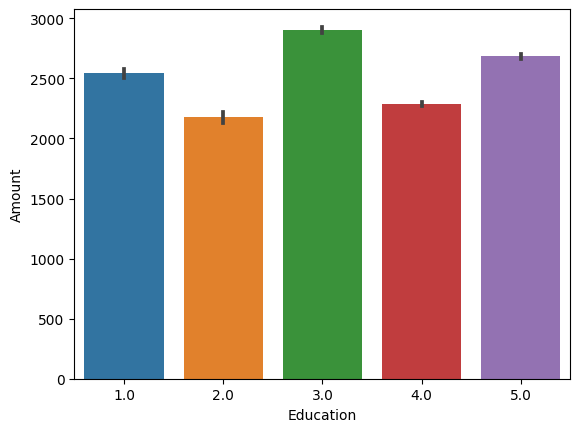

In [378]:
sns.barplot(x="Education",y="Amount",data=df)

<Axes: xlabel='Rating', ylabel='Amount'>

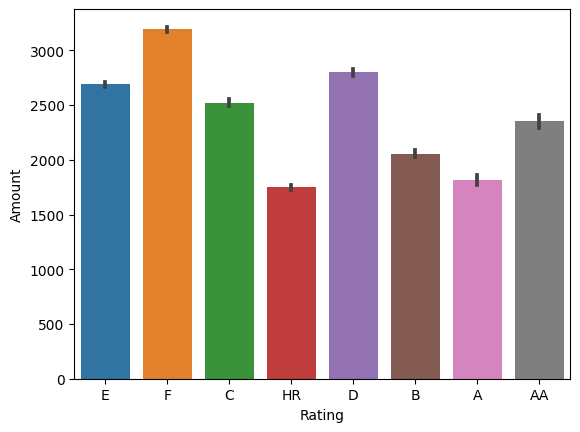

In [379]:
sns.barplot(x="Rating",y="Amount",data=df)

In [380]:
df["CreditScoreEsMicroL"].value_counts()

CreditScoreEsMicroL
M1     126334
M5       2432
M2       1723
M3       1644
M4       1540
M6        560
M8        102
M9         70
M7         69
M10        55
Name: count, dtype: int64

In [381]:
df["CreditScoreEeMini"].value_counts()

CreditScoreEeMini
1000.0    118854
800.0       5718
900.0       4887
700.0       2532
600.0       2462
500.0         76
Name: count, dtype: int64

[Text(0.5, 1.0, 'Restructured vs Default Status')]

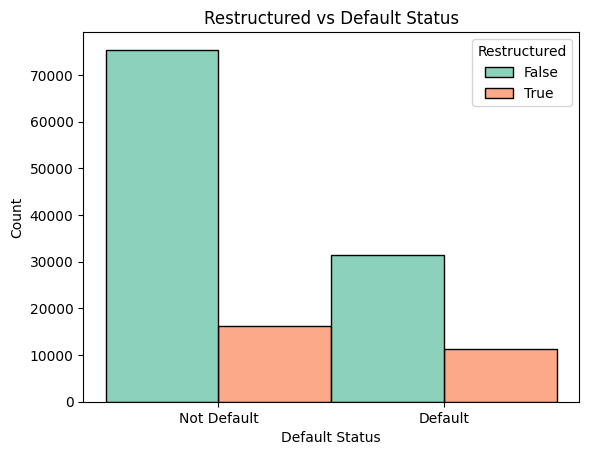

In [382]:
sns.histplot(x="Default Status",hue="Restructured",data=df,palette="Set2",multiple="dodge",stat="count").set(title="Restructured vs Default Status")

<Axes: xlabel='Restructured', ylabel='Amount'>

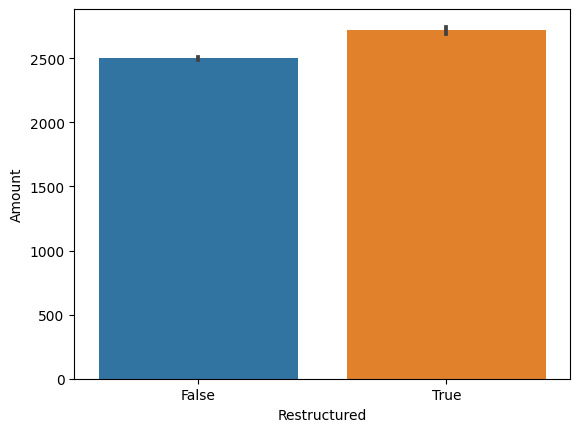

In [383]:
sns.barplot(x="Restructured",y="Amount",data=df)

<Axes: xlabel='ModelVersion', ylabel='Amount'>

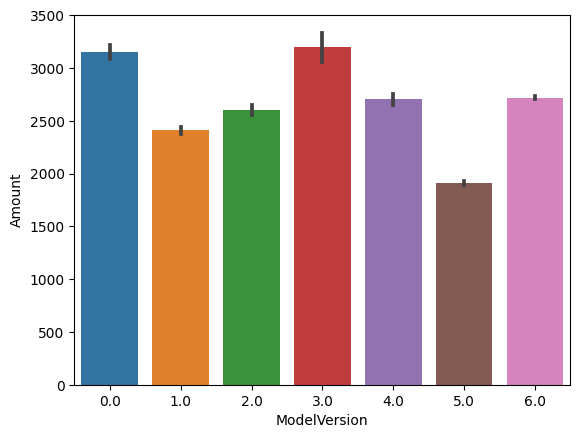

In [384]:
sns.barplot(x="ModelVersion",y="Amount",data=df)

<Axes: xlabel='Rating', ylabel='Amount'>

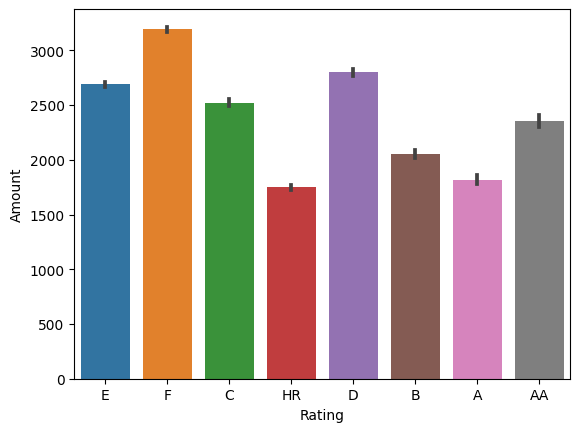

In [385]:
sns.barplot(x="Rating",y="Amount",data=df)

### drop unwanted columns

In [386]:
date=["ListedOnUTC","BiddingStartedOn","LoanApplicationStartedDate","LoanDate","FirstPaymentDate","MaturityDate_Original",
      "MaturityDate_Last","DateOfBirth","LastPaymentOn","StageActiveSince"]

In [387]:
col=["ApplicationSignedHour","ApplicationSignedWeekday","LanguageCode","Country","County",	
"City","ActiveScheduleFirstPaymentReached","MonthlyPaymentDay","Status","Restructured","WorseLateCategory"]

In [388]:
df.drop(date,axis=1,inplace=True)

In [389]:
df.drop(col,axis=1,inplace=True)

In [390]:
df.isnull().sum()

BidsPortfolioManager                      0
BidsApi                                   0
BidsManual                                0
NewCreditCustomer                         0
VerificationType                          0
Age                                       0
Gender                                    0
AppliedAmount                             0
Amount                                    0
Interest                                  0
LoanDuration                              0
MonthlyPayment                            0
UseOfLoan                                 0
Education                                 0
MaritalStatus                             0
EmploymentStatus                          0
EmploymentDurationCurrentEmployer         0
OccupationArea                            0
HomeOwnershipType                         0
IncomeFromPrincipalEmployer               0
IncomeTotal                               0
ExistingLiabilities                       0
LiabilitiesTotal                

In [391]:
df.duplicated().sum()

0

In [392]:
df.shape

(134529, 48)

In [393]:
df[df["LiabilitiesTotal"]==12400000.0]

,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,VerificationType,Age,Gender,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,PlannedInterestTillDate,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,PrincipalOverdueBySchedule,RecoveryStage,ModelVersion,Rating,CreditScoreEsMicroL,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,NextPaymentNr,NrOfScheduledPayments,Default Status
119195,302,0,99.0,True,4.0,46,2.0,531.0,531.0,75.46,48,30.28,1,1.0,1.0,1.0,MoreThan5Years,1.0,8.0,0.0,1900.0,1,12400000.0,0,0.0,0.0,6.14,0.248892,0.0,0.196666,0.35475,6.14,1.0,6.0,F,M1,1000.0,0.0,0.0,531.0,49.53,0,0.0,197.98,0,3.0,48.0,Not Default


In [394]:
df[df["IncomeTotal"]==0]

,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,VerificationType,Age,Gender,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,PlannedInterestTillDate,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,PrincipalOverdueBySchedule,RecoveryStage,ModelVersion,Rating,CreditScoreEsMicroL,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,NextPaymentNr,NrOfScheduledPayments,Default Status
889,0,0,639.1165,True,0.0,0,0.0,639.1165,639.1100,49.00,9,0.000000,110,1.0,1.0,1.0,MoreThan5Years,1.0,0.0,0.0,0.0,1,0.00,1,0.000000,0.000000,2149.4600,0.000000,0.000000,0.000000,0.000000,0.0,1.0,0.0,E,M1,1000.0,0.0900,0.0000,0.0,0.0,1,159.7781,0.0000,0,3.0,60.0,Default
915,0,0,2403.0780,True,4.0,0,0.0,2403.0780,2403.1114,25.00,24,119.083443,101,4.0,1.0,1.0,MoreThan5Years,1.0,1.0,0.0,0.0,1,794.07,1,7.769024,122.239119,8428.9800,0.149255,0.506748,0.136558,0.252434,0.0,1.0,6.0,E,M1,1000.0,2403.1114,539.0104,0.0,0.0,1,792.5477,0.0000,0,3.0,60.0,Not Default
919,0,0,313.1670,True,4.0,0,0.0,830.8514,313.1400,49.00,12,119.083443,102,4.0,1.0,1.0,MoreThan5Years,1.0,1.0,0.0,0.0,0,0.00,0,7.769024,122.239119,1540.2800,0.149255,0.506748,0.136558,0.252434,0.0,1.0,6.0,E,M1,1000.0,0.0100,0.0000,0.0,0.0,5,1220.7081,0.0000,0,3.0,60.0,Default
922,0,0,83.0851,True,4.0,0,0.0,639.1165,83.0800,49.00,12,119.083443,110,4.0,1.0,1.0,MoreThan5Years,1.0,1.0,0.0,0.0,0,0.00,0,7.769024,122.239119,405.0600,0.149255,0.506748,0.136558,0.252434,0.0,1.0,6.0,E,M1,1000.0,0.0000,0.0000,0.0,0.0,7,1757.5281,0.0000,0,3.0,60.0,Default
930,0,0,639.1165,True,0.0,0,0.0,639.1165,639.1300,49.00,12,0.000000,102,1.0,1.0,1.0,MoreThan5Years,1.0,0.0,0.0,0.0,1,5500.00,1,0.000000,0.000000,3098.8000,0.000000,0.000000,0.000000,0.000000,0.0,1.0,0.0,E,M1,1000.0,0.0000,0.0000,0.0,0.0,8,1840.6081,0.0000,0,3.0,60.0,Default
956,0,0,651.8988,True,0.0,0,0.0,1278.2330,651.8800,49.00,12,0.000000,102,1.0,1.0,1.0,MoreThan5Years,1.0,0.0,0.0,0.0,1,2038.64,1,0.000000,0.000000,3194.4800,0.000000,0.000000,0.000000,0.000000,0.0,1.0,0.0,E,M1,1000.0,0.0000,0.0000,0.0,0.0,1,1316.6342,0.0000,0,3.0,60.0,Default
1132,0,0,127.8234,True,4.0,0,0.0,639.1165,127.8300,49.00,12,119.083443,110,4.0,1.0,1.0,MoreThan5Years,1.0,1.0,0.0,0.0,1,2600.00,1,7.769024,122.239119,644.8700,0.149255,0.506748,0.136558,0.252434,0.0,1.0,6.0,E,M1,1000.0,0.0700,0.0000,0.0,0.0,3,990.6181,0.0000,0,3.0,60.0,Default
1137,0,0,102.2586,True,4.0,0,0.0,102.2586,102.2600,49.00,1,119.083443,102,4.0,1.0,1.0,MoreThan5Years,1.0,1.0,0.0,0.0,0,0.00,0,7.769024,122.239119,113.2600,0.149255,0.506748,0.136558,0.252434,0.0,1.0,6.0,E,M1,1000.0,0.0100,0.0000,0.0,0.0,4,1118.4481,0.0000,0,3.0,60.0,Default
1148,0,0,115.0409,True,4.0,0,0.0,639.1165,115.0300,49.00,12,119.083443,110,4.0,1.0,1.0,MoreThan5Years,1.0,1.0,0.0,0.0,1,0.00,1,7.769024,122.239119,548.8900,0.149255,0.506748,0.136558,0.252434,0.0,1.0,6.0,E,M1,1000.0,0.0000,0.0000,0.0,0.0,9,2479.7381,0.0000,0,3.0,60.0,Default
1166,0,0,447.3818,True,4.0,0,0.0,447.3815,447.4136,42.00,18,119.083443,102,4.0,1.0,1.0,MoreThan5Years,1.0,1.0,0.0,0.0,0,0.00,0,7.769024,122.239119,234.4154,0.149255,0.506748,0.136558,0.252434,0.0,1.0,6.0,E,M1,1000.0,101.1036,49.5954,0.0,0.0,0,0.0000,0.0000,0,3.0,60.0,Default


In [395]:
mmm(df["Age"])

mean 40.819295467891685
median 40.0
mode 0    34
Name: Age, dtype: int64


In [396]:
df["Age"]=df["Age"].replace([0,1,2],18)

In [397]:
df

,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,VerificationType,Age,Gender,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,PlannedInterestTillDate,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,PrincipalOverdueBySchedule,RecoveryStage,ModelVersion,Rating,CreditScoreEsMicroL,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,NextPaymentNr,NrOfScheduledPayments,Default Status
0,0,0,115.0410,True,2.0,61,1.0,319.5582,115.0408,30.00,12,119.083443,7,3.0,1.0,3.0,UpTo3Years,7.0,1.0,6000.0,10500.0,0,0.00,0,0.00,0.00,319.0800,0.149255,0.506748,0.136558,0.252434,0.00,1.0,6.0,E,M1,1000.0,115.0408,20.4222,0.00,0.00,1,83.0852,0.0000,0,3.0,60.0,Not Default
1,0,0,140.6057,False,2.0,48,1.0,191.7349,140.6057,25.00,1,119.083443,7,5.0,4.0,3.0,MoreThan5Years,16.0,1.0,8300.0,10800.0,0,0.00,0,0.00,0.00,45.8300,0.149255,0.506748,0.136558,0.252434,0.00,1.0,6.0,E,M1,1000.0,140.6057,2.0227,0.00,0.00,2,255.6467,258.6256,0,3.0,60.0,Not Default
2,0,0,319.5580,True,2.0,58,1.0,319.5582,319.5409,25.00,20,119.083443,2,4.0,1.0,3.0,UpTo4Years,9.0,1.0,5000.0,7000.0,0,0.00,0,0.00,0.00,197.2926,0.149255,0.506748,0.136558,0.252434,116.35,1.0,6.0,E,M1,1000.0,203.1909,59.7626,116.35,414.07,0,0.0000,0.0000,0,3.0,60.0,Default
3,0,0,57.5205,True,2.0,23,1.0,127.8233,57.5205,45.00,15,119.083443,0,2.0,3.0,1.0,UpTo2Years,1.0,1.0,11000.0,11600.0,0,0.00,0,0.00,0.00,293.1000,0.149255,0.506748,0.136558,0.252434,0.00,1.0,6.0,E,M1,1000.0,57.5205,18.7323,0.00,0.00,1,134.2144,0.0000,0,3.0,60.0,Not Default
4,0,0,319.5582,True,2.0,25,1.0,319.5582,319.5436,30.00,12,119.083443,6,4.0,2.0,3.0,UpTo2Years,7.0,1.0,6800.0,6800.0,0,0.00,0,0.00,0.00,833.8100,0.149255,0.506748,0.136558,0.252434,0.00,1.0,6.0,E,M1,1000.0,319.5436,220.4200,0.00,0.00,1,146.9966,0.0000,0,3.0,60.0,Default
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134524,2515,0,485.0000,True,3.0,37,0.0,3000.0000,3000.0000,31.01,60,107.680000,0,3.0,3.0,3.0,MoreThan5Years,1.0,5.0,1400.0,1400.0,1,500.00,0,7.69,792.32,3000.0000,0.146732,0.900000,0.163368,0.125412,0.00,2.0,1.0,E,M1,1000.0,2308.1900,0.0000,0.00,0.00,0,0.0000,0.0000,0,3.0,60.0,Default
134525,1880,0,1120.0000,False,3.0,35,0.0,3000.0000,3000.0000,18.25,60,85.330000,2,3.0,3.0,3.0,MoreThan5Years,8.0,1.0,2265.0,2265.0,5,1777.46,0,31.58,520.67,16.3200,0.053246,0.900000,0.129254,0.045510,0.00,1.0,1.0,B,M1,1000.0,3000.0000,1990.0300,0.00,0.00,1,3000.0000,389.3600,0,3.0,60.0,Not Default
134526,1975,0,525.0000,True,1.0,40,0.0,2500.0000,2500.0000,24.83,60,80.420000,0,3.0,1.0,5.0,MoreThan5Years,6.0,1.0,2500.0,2500.0,2,1350.00,0,3.22,1069.58,2428.4400,0.104219,0.900000,0.144081,0.089076,558.68,2.0,1.0,D,M1,1000.0,1869.7600,199.3300,630.24,1227.98,0,0.0000,0.0000,0,0.0,60.0,Default
134527,1840,0,1160.0000,False,4.0,47,1.0,3000.0000,3000.0000,17.74,60,84.510000,7,5.0,1.0,3.0,MoreThan5Years,17.0,4.0,521.0,540.0,8,732.05,2,44.35,50.49,2588.2100,0.035612,0.650000,0.141788,0.042144,167.41,2.0,1.0,B,M1,1000.0,2257.5400,561.5300,0.00,0.00,1,500.0000,96.8000,0,3.0,60.0,Default


# Feature engineering
### Encoding

In [398]:
label_encod=["NewCreditCustomer","Gender","Default Status"]

In [399]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for i in label_encod:
    le.fit(df[i])
    df[i]=le.transform (df[i])

In [400]:
encod=["UseOfLoan","Education","MaritalStatus","EmploymentStatus",
       "EmploymentDurationCurrentEmployer","OccupationArea","HomeOwnershipType","ModelVersion",
       "Rating","CreditScoreEsMicroL","CreditScoreEeMini"]

In [401]:
df.replace({"VerificationType":{4.0:3,1.0:2,3.0:1,2.0:1,0.0:0}},inplace=True)

In [402]:
df.replace({"UseOfLoan":{1:3,7:2,2:2,0:2,6:1,3:1,5:1,8:1,4:1,102:0,110:0,104:0,101:0,107:0,108:0,106:0}},inplace=True)

In [403]:
df.replace({"Education":{4.0:3,5.0:2,3.0:2,1.0:1,2.0:0}},inplace=True)

In [404]:
df.replace({"MaritalStatus":{1.0:2,3.0:1,2.0:1,4.0:1,5.0:0}},inplace=True)

In [405]:
df.replace({"EmploymentStatus":{1.0:2,3.0:1,5.0:0,6.0:0,4.0:0,2.0:0}},inplace=True)

In [406]:
df.replace({"EmploymentDurationCurrentEmployer":{"MoreThan5Years":3,"UpTo5Years":2,"UpTo1Year":2,"Retiree":1,"UpTo2Years":1,"UpTo3Years":1,"Other":1,"UpTo4Years":1,"TrialPeriod":0}},inplace=True)

In [407]:
df.replace({"OccupationArea":{1.0:2,7.0:1,6.0:1,3.0:1,8.0:1,17.0:1,9.0:1,10.0:1,15.0:1,16.0:1,11.0:1,19.0:1,14.0:0,18.0:0,13.0:0,12.0:0,4.0:0,5.0:0,2.0:0}},inplace=True)

In [408]:
df.replace({"HomeOwnershipType":{1.0:3,3.0:2,2.0:2,8.0:2,10.0:1,4.0:1,7.0:1,6.0:1,5.0:1,9.0:0,0.0:0}},inplace=True)

In [409]:
df.replace({"ModelVersion":{6.0:2,5.0:1,1.0:1,0.0:0,4.0:0,2.0:0,3.0:0}},inplace=True)

In [410]:
df.replace({"Rating":{"E":2,"F":2,"D":2,"C":1,"B":1,"HR":1,"A":0,"AA":0}},inplace=True)

In [411]:
df.replace({"CreditScoreEsMicroL":{"M1":3,"M2":2,"M3":2,"M4":2,"M5":2,"M6":1,"M8":1,"M7":0,"M9":0,"M10":0}},inplace=True)

In [412]:
df.replace({"CreditScoreEeMini":{1000.0:2,600.0:1,700.0:1,800.0:1,900.0:1,500.0:0}},inplace=True)

In [413]:
df.dtypes

BidsPortfolioManager                        int64
BidsApi                                     int64
BidsManual                                float64
NewCreditCustomer                           int64
VerificationType                          float64
Age                                         int64
Gender                                      int64
AppliedAmount                             float64
Amount                                    float64
Interest                                  float64
LoanDuration                                int64
MonthlyPayment                            float64
UseOfLoan                                   int64
Education                                 float64
MaritalStatus                             float64
EmploymentStatus                          float64
EmploymentDurationCurrentEmployer           int64
OccupationArea                            float64
HomeOwnershipType                         float64
IncomeFromPrincipalEmployer               float64


In [414]:
df

,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,VerificationType,Age,Gender,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,PlannedInterestTillDate,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,PrincipalOverdueBySchedule,RecoveryStage,ModelVersion,Rating,CreditScoreEsMicroL,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,NextPaymentNr,NrOfScheduledPayments,Default Status
0,0,0,115.0410,1,1.0,61,1,319.5582,115.0408,30.00,12,119.083443,2,2.0,2.0,1.0,1,1.0,3.0,6000.0,10500.0,0,0.00,0,0.00,0.00,319.0800,0.149255,0.506748,0.136558,0.252434,0.00,1.0,2.0,2,3,2.0,115.0408,20.4222,0.00,0.00,1,83.0852,0.0000,0,3.0,60.0,1
1,0,0,140.6057,0,1.0,48,1,191.7349,140.6057,25.00,1,119.083443,2,2.0,1.0,1.0,3,1.0,3.0,8300.0,10800.0,0,0.00,0,0.00,0.00,45.8300,0.149255,0.506748,0.136558,0.252434,0.00,1.0,2.0,2,3,2.0,140.6057,2.0227,0.00,0.00,2,255.6467,258.6256,0,3.0,60.0,1
2,0,0,319.5580,1,1.0,58,1,319.5582,319.5409,25.00,20,119.083443,2,3.0,2.0,1.0,1,1.0,3.0,5000.0,7000.0,0,0.00,0,0.00,0.00,197.2926,0.149255,0.506748,0.136558,0.252434,116.35,1.0,2.0,2,3,2.0,203.1909,59.7626,116.35,414.07,0,0.0000,0.0000,0,3.0,60.0,0
3,0,0,57.5205,1,1.0,23,1,127.8233,57.5205,45.00,15,119.083443,2,0.0,1.0,2.0,1,2.0,3.0,11000.0,11600.0,0,0.00,0,0.00,0.00,293.1000,0.149255,0.506748,0.136558,0.252434,0.00,1.0,2.0,2,3,2.0,57.5205,18.7323,0.00,0.00,1,134.2144,0.0000,0,3.0,60.0,1
4,0,0,319.5582,1,1.0,25,1,319.5582,319.5436,30.00,12,119.083443,1,3.0,1.0,1.0,1,1.0,3.0,6800.0,6800.0,0,0.00,0,0.00,0.00,833.8100,0.149255,0.506748,0.136558,0.252434,0.00,1.0,2.0,2,3,2.0,319.5436,220.4200,0.00,0.00,1,146.9966,0.0000,0,3.0,60.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134524,2515,0,485.0000,1,1.0,37,0,3000.0000,3000.0000,31.01,60,107.680000,2,2.0,1.0,1.0,3,2.0,1.0,1400.0,1400.0,1,500.00,0,7.69,792.32,3000.0000,0.146732,0.900000,0.163368,0.125412,0.00,2.0,1.0,2,3,2.0,2308.1900,0.0000,0.00,0.00,0,0.0000,0.0000,0,3.0,60.0,0
134525,1880,0,1120.0000,0,1.0,35,0,3000.0000,3000.0000,18.25,60,85.330000,2,2.0,1.0,1.0,3,1.0,3.0,2265.0,2265.0,5,1777.46,0,31.58,520.67,16.3200,0.053246,0.900000,0.129254,0.045510,0.00,1.0,1.0,1,3,2.0,3000.0000,1990.0300,0.00,0.00,1,3000.0000,389.3600,0,3.0,60.0,1
134526,1975,0,525.0000,1,2.0,40,0,2500.0000,2500.0000,24.83,60,80.420000,2,2.0,2.0,0.0,3,1.0,3.0,2500.0,2500.0,2,1350.00,0,3.22,1069.58,2428.4400,0.104219,0.900000,0.144081,0.089076,558.68,2.0,1.0,2,3,2.0,1869.7600,199.3300,630.24,1227.98,0,0.0000,0.0000,0,0.0,60.0,0
134527,1840,0,1160.0000,0,3.0,47,1,3000.0000,3000.0000,17.74,60,84.510000,2,2.0,2.0,1.0,3,1.0,1.0,521.0,540.0,8,732.05,2,44.35,50.49,2588.2100,0.035612,0.650000,0.141788,0.042144,167.41,2.0,1.0,1,3,2.0,2257.5400,561.5300,0.00,0.00,1,500.0000,96.8000,0,3.0,60.0,0


## Outliers handling

<Axes: >

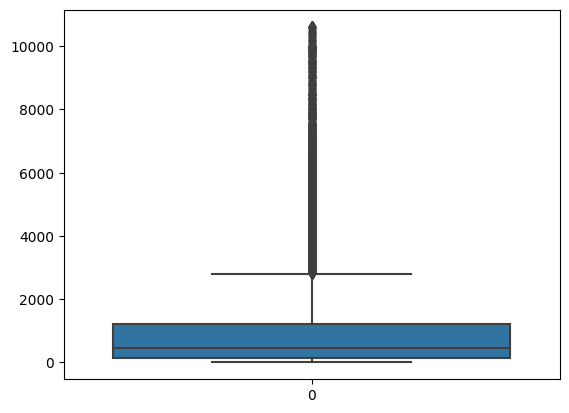

In [415]:
sns.boxplot(df["BidsPortfolioManager"])

<Axes: >

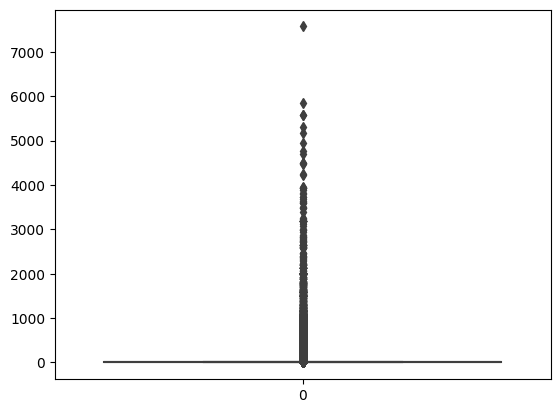

In [416]:
sns.boxplot(df["BidsApi"])

<Axes: >

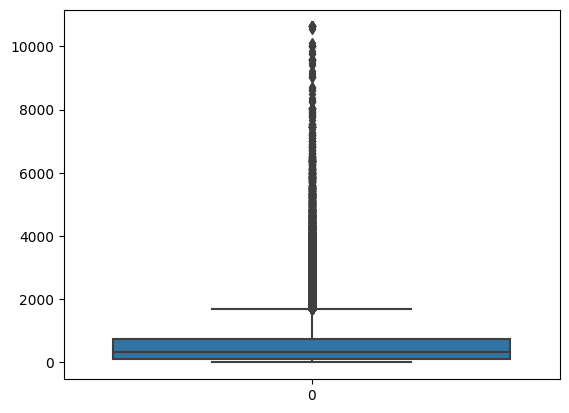

In [417]:
sns.boxplot(df["BidsManual"])

<Axes: >

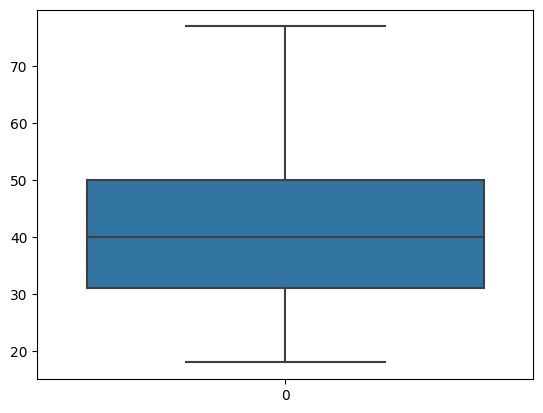

In [418]:
sns.boxplot(df["Age"])

<Axes: >

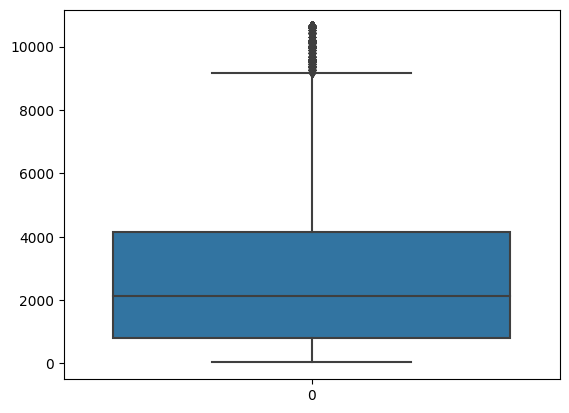

In [419]:
sns.boxplot(df["AppliedAmount"])

<Axes: >

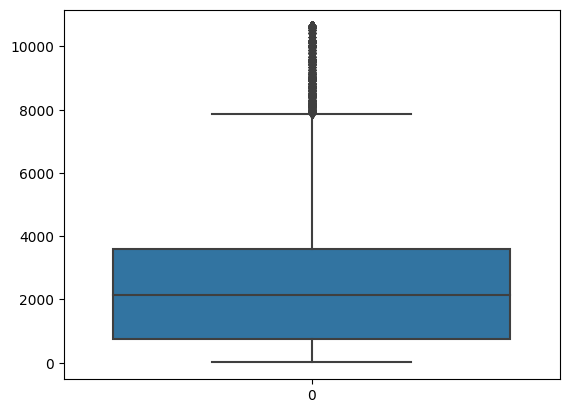

In [420]:
sns.boxplot(df["Amount"])

<Axes: >

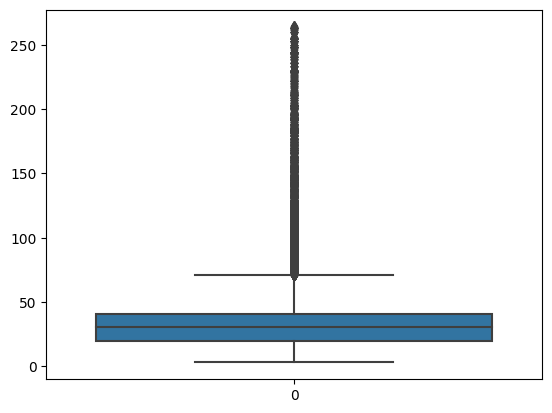

In [421]:
sns.boxplot(df["Interest"])

<Axes: >

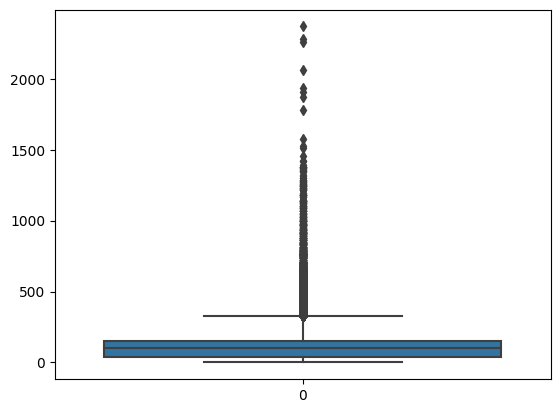

In [422]:
sns.boxplot(df["MonthlyPayment"])

<Axes: >

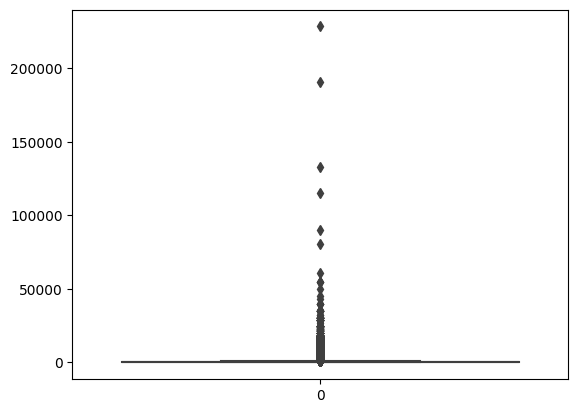

In [423]:
sns.boxplot(df["IncomeFromPrincipalEmployer"])

<Axes: >

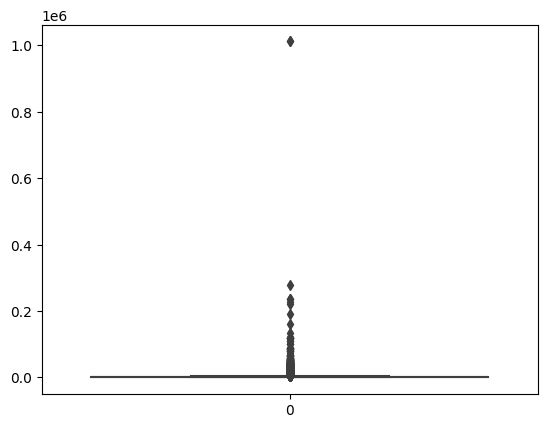

In [424]:
sns.boxplot(df["IncomeTotal"])

<Axes: >

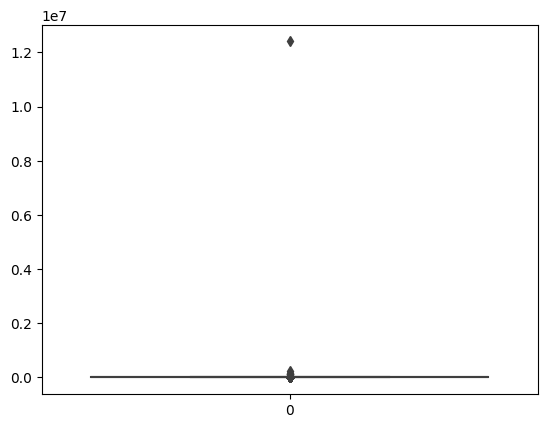

In [425]:
sns.boxplot(df["LiabilitiesTotal"])

<Axes: >

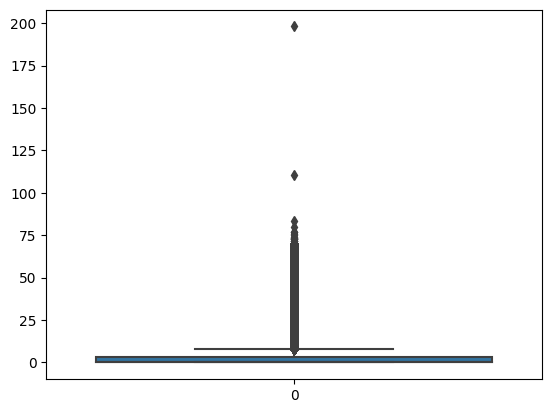

In [426]:
sns.boxplot(df["DebtToIncome"])

<Axes: >

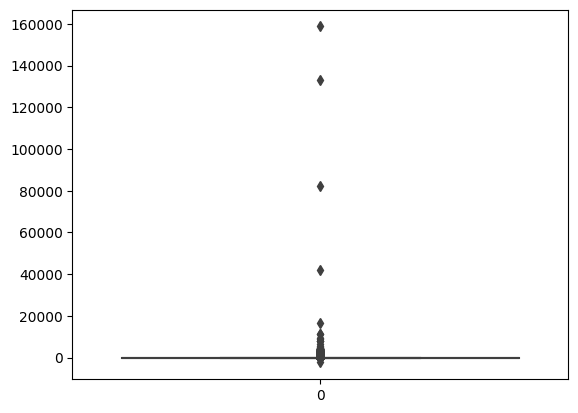

In [427]:
sns.boxplot(df["FreeCash"])

<Axes: >

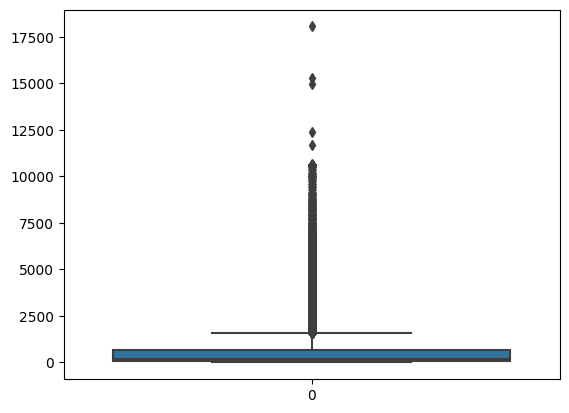

In [428]:
sns.boxplot(df["PlannedInterestTillDate"])

<Axes: >

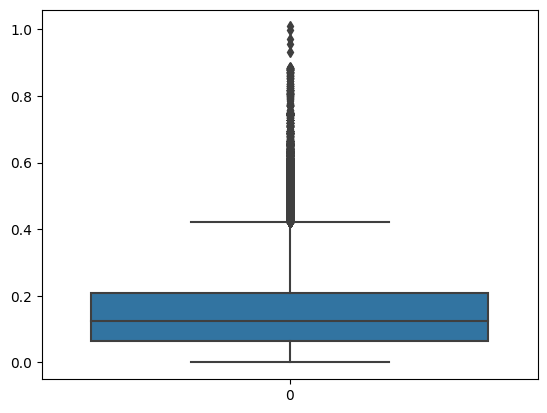

In [429]:
sns.boxplot(df["ExpectedLoss"])

<Axes: >

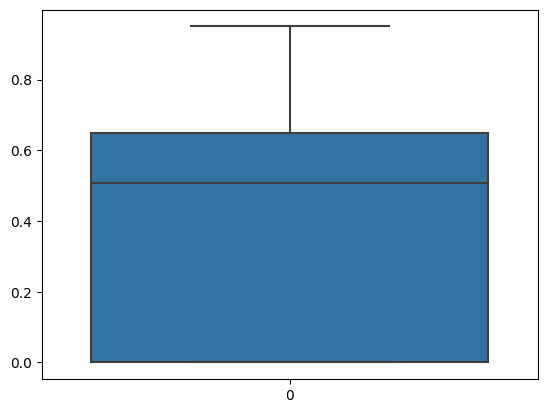

In [430]:
sns.boxplot(df["LossGivenDefault"])

<Axes: >

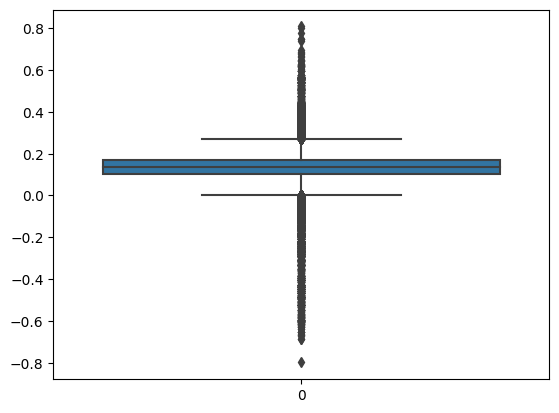

In [431]:
sns.boxplot(df["ExpectedReturn"])

<Axes: >

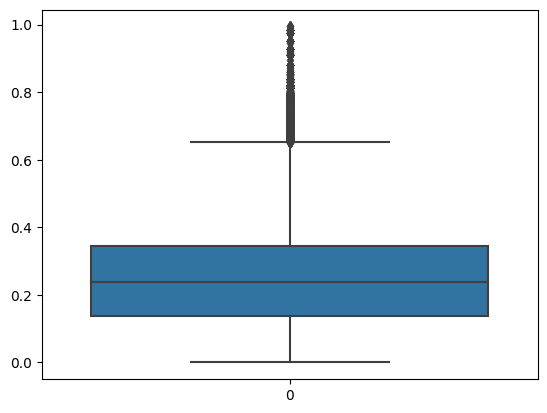

In [432]:
sns.boxplot(df["ProbabilityOfDefault"])

<Axes: >

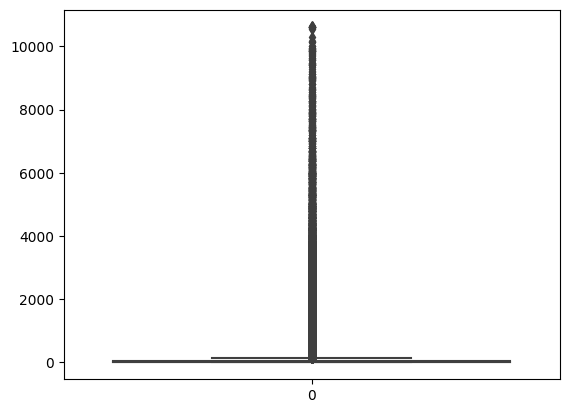

In [433]:
sns.boxplot(df["PrincipalOverdueBySchedule"])

<Axes: >

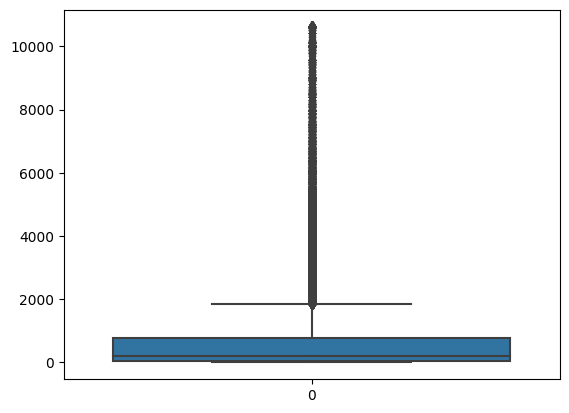

In [434]:
sns.boxplot(df["PrincipalPaymentsMade"])

<Axes: >

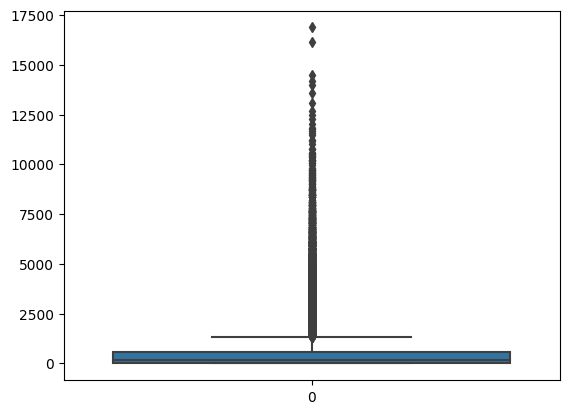

In [435]:
sns.boxplot(df["InterestAndPenaltyPaymentsMade"])

<Axes: >

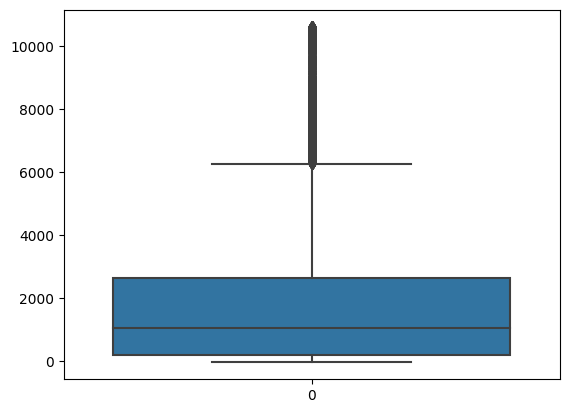

In [436]:
sns.boxplot(df["PrincipalBalance"])

<Axes: >

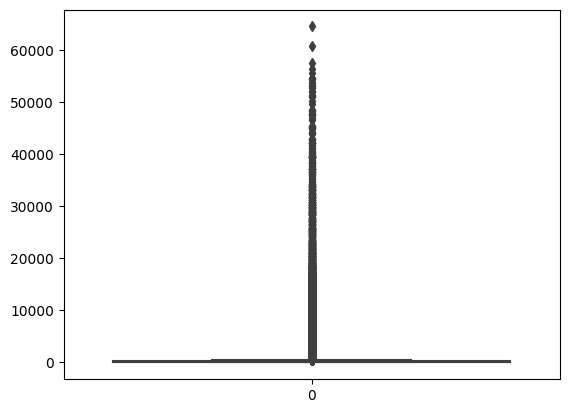

In [437]:
sns.boxplot(df["InterestAndPenaltyBalance"])

<Axes: >

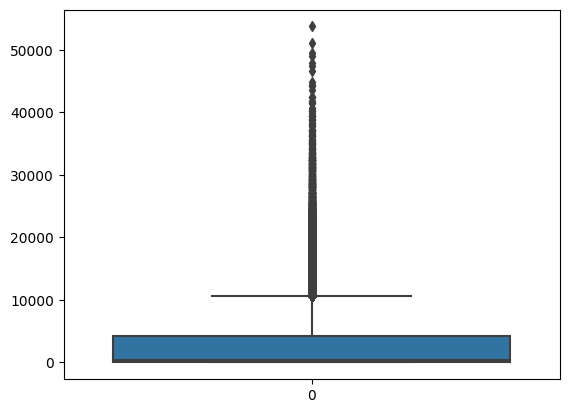

In [438]:
sns.boxplot(df["AmountOfPreviousLoansBeforeLoan"])

<Axes: >

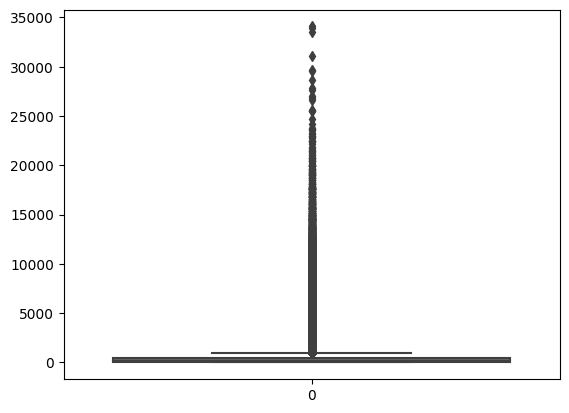

In [439]:
sns.boxplot(df["PreviousRepaymentsBeforeLoan"])

In [440]:
outlier=["BidsApi","BidsManual","AppliedAmount","Interest","MonthlyPayment","DebtToIncome","PlannedInterestTillDate",
         "ExpectedLoss","ExpectedReturn","ProbabilityOfDefault","PrincipalPaymentsMade","InterestAndPenaltyPaymentsMade",
        "PrincipalBalance","AmountOfPreviousLoansBeforeLoan","IncomeFromPrincipalEmployer","IncomeTotal","LiabilitiesTotal",
         "FreeCash","PrincipalOverdueBySchedule","InterestAndPenaltyBalance"]

In [441]:
for i in outlier:
    q1=np.quantile(df[i],0.25)
    q3=np.quantile(df[i],0.75)
    iqr=q3-q1
    lb=q1-(1.5*iqr)
    ub=q3+(1.5*iqr)
    print(i,"--","q1:",q1," q3:",q3," iqr:",iqr," upper bound:",ub," lower bound:",lb)
    for j in df[i]:
        if j>ub:
            df[i]=df[i].replace(j,ub)
        elif j<lb:
            df[i]=df[i].replace(j,lb)
        else:
            continue

BidsApi -- q1: 0.0  q3: 5.0  iqr: 5.0  upper bound: 12.5  lower bound: -7.5
BidsManual -- q1: 96.0  q3: 729.0  iqr: 633.0  upper bound: 1678.5  lower bound: -853.5
AppliedAmount -- q1: 800.0  q3: 4145.0  iqr: 3345.0  upper bound: 9162.5  lower bound: -4217.5
Interest -- q1: 20.0  q3: 40.4  iqr: 20.4  upper bound: 71.0  lower bound: -10.599999999999998
MonthlyPayment -- q1: 37.38  q3: 153.1  iqr: 115.72  upper bound: 326.67999999999995  lower bound: -136.2
DebtToIncome -- q1: 0.0  q3: 3.07  iqr: 3.07  upper bound: 7.674999999999999  lower bound: -4.6049999999999995
PlannedInterestTillDate -- q1: 64.32  q3: 673.61  iqr: 609.29  upper bound: 1587.545  lower bound: -849.615
ExpectedLoss -- q1: 0.06473473126886523  q3: 0.2072851541616092  iqr: 0.14255042289274397  upper bound: 0.42111078850072514  lower bound: -0.14909090307025072
ExpectedReturn -- q1: 0.103821084986613  q3: 0.1704406673230376  iqr: 0.0666195823364246  upper bound: 0.27037004082767446  lower bound: 0.003891711481976104
Prob

<Axes: >

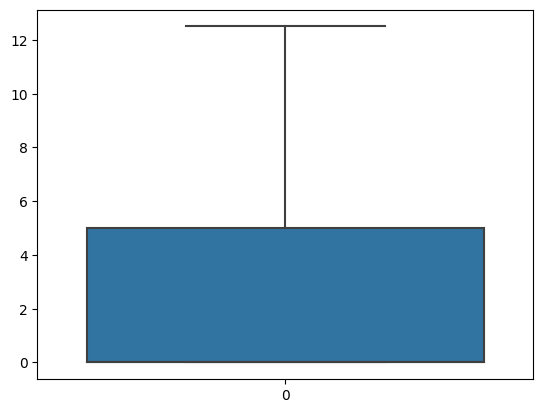

In [442]:
sns.boxplot(df["BidsApi"])

<Axes: >

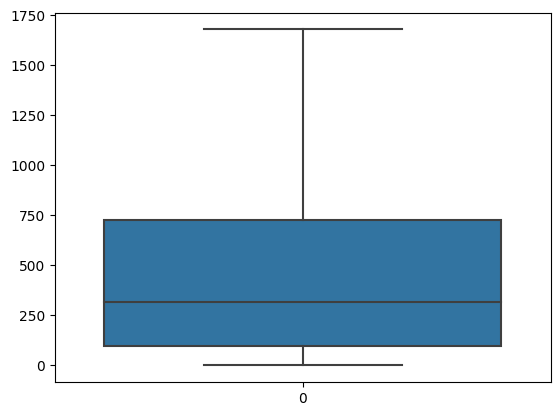

In [443]:
sns.boxplot(df["BidsManual"])

<Axes: >

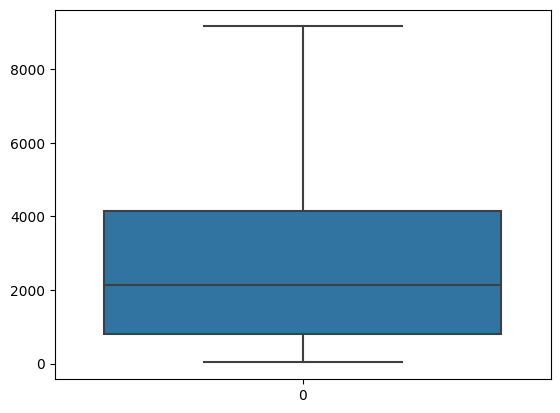

In [444]:
sns.boxplot(df["AppliedAmount"])

<Axes: >

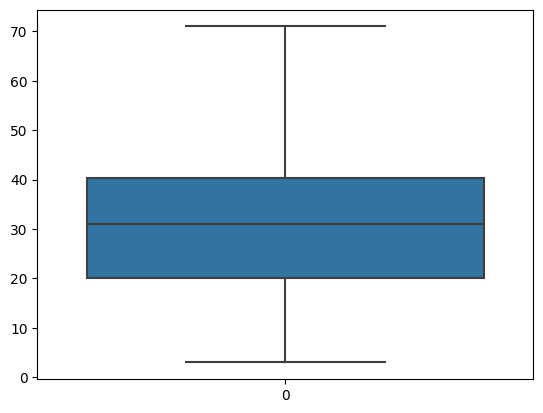

In [445]:
sns.boxplot(df["Interest"])

<Axes: >

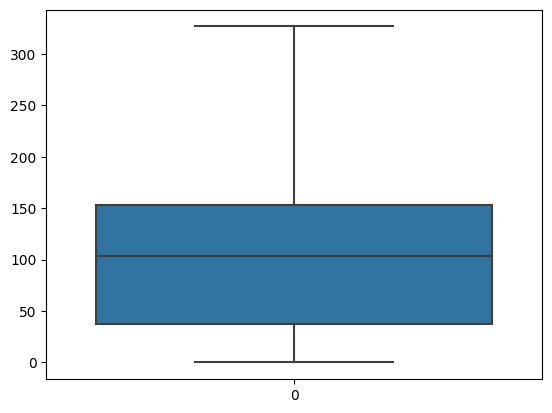

In [446]:
sns.boxplot(df["MonthlyPayment"])

<Axes: >

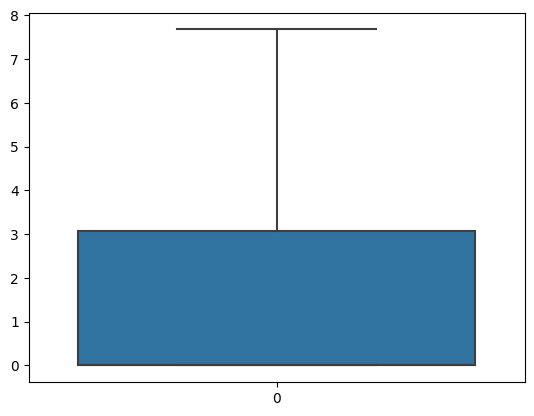

In [447]:
sns.boxplot(df["DebtToIncome"])

<Axes: >

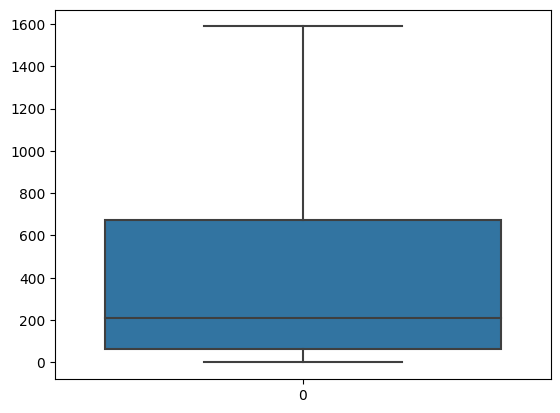

In [448]:
sns.boxplot(df["PlannedInterestTillDate"])

<Axes: >

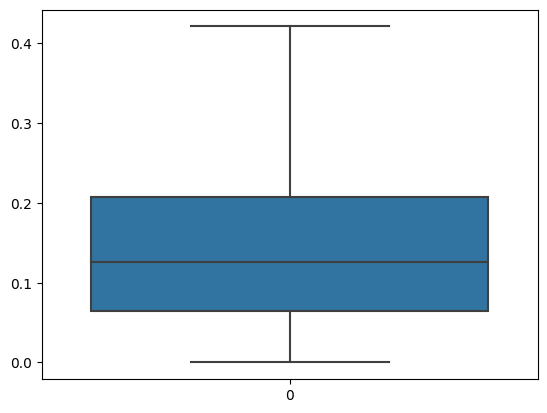

In [449]:
sns.boxplot(df["ExpectedLoss"])

<Axes: >

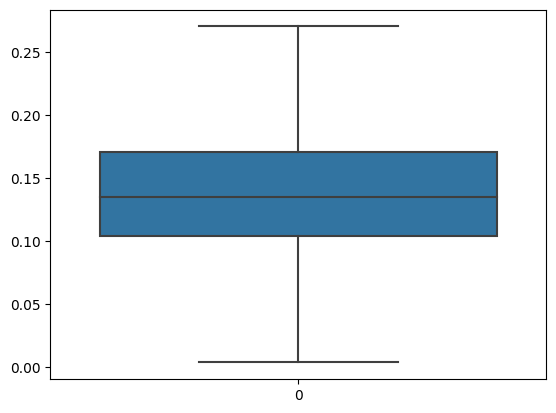

In [450]:
sns.boxplot(df["ExpectedReturn"])

<Axes: >

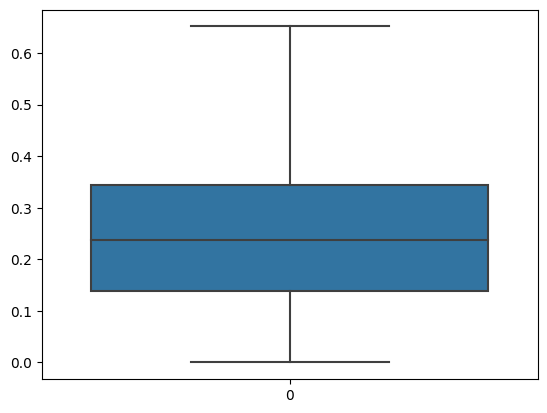

In [451]:
sns.boxplot(df["ProbabilityOfDefault"])

<Axes: >

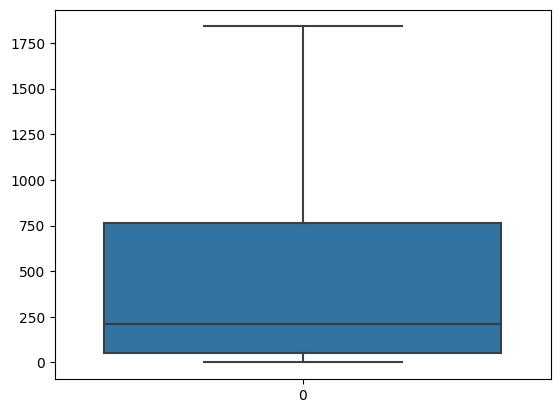

In [452]:
sns.boxplot(df["PrincipalPaymentsMade"])

<Axes: >

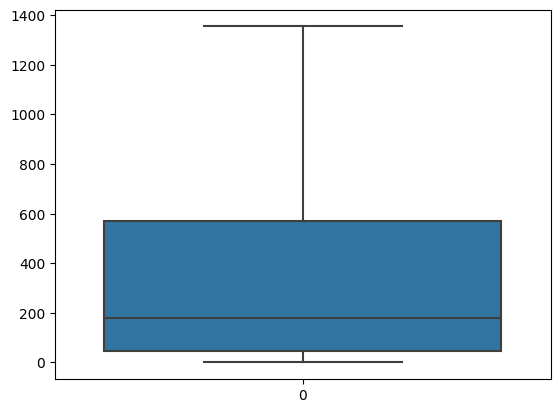

In [453]:
sns.boxplot(df["InterestAndPenaltyPaymentsMade"])

<Axes: >

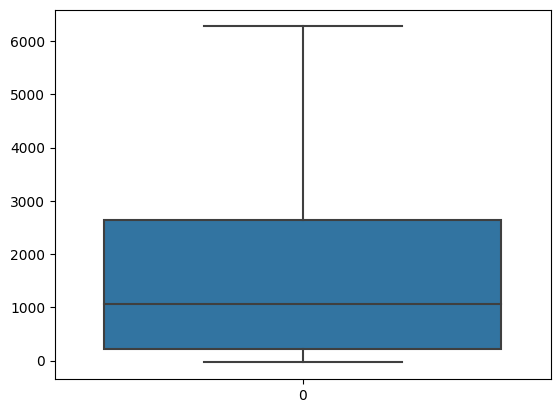

In [454]:
sns.boxplot(df["PrincipalBalance"])

<Axes: >

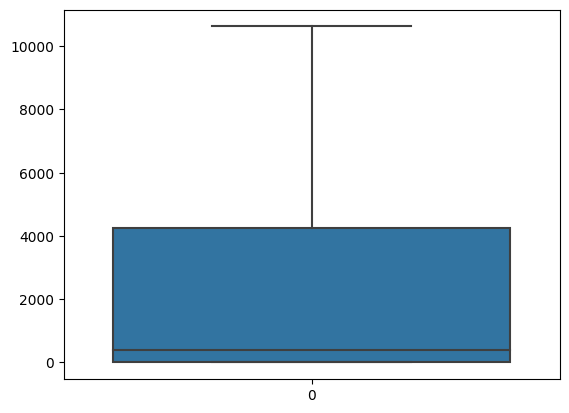

In [455]:
sns.boxplot(df["AmountOfPreviousLoansBeforeLoan"])

<Axes: >

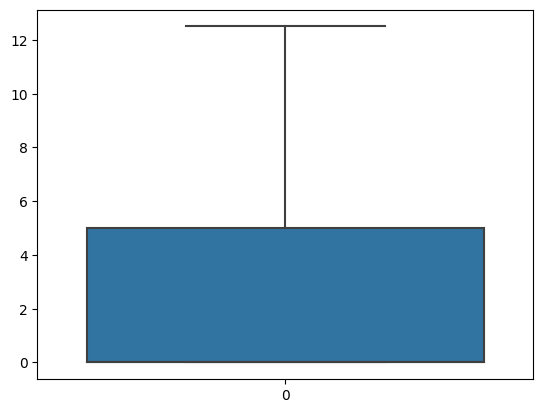

In [456]:
sns.boxplot(df["BidsApi"])

<Axes: >

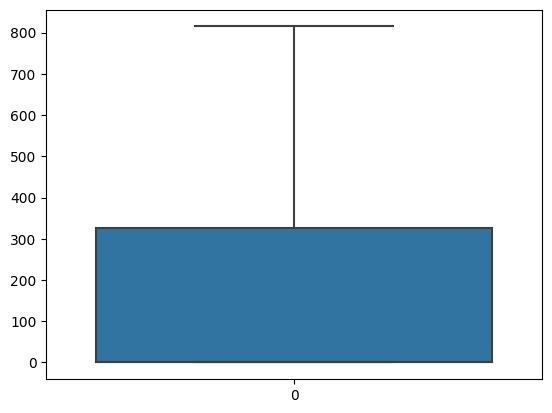

In [457]:
sns.boxplot(df["IncomeFromPrincipalEmployer"])

<Axes: >

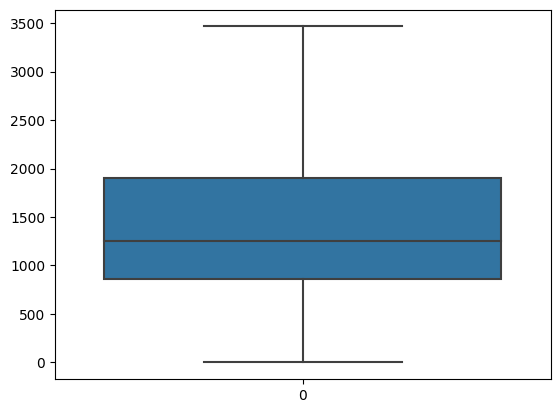

In [458]:
sns.boxplot(df["IncomeTotal"])

<Axes: >

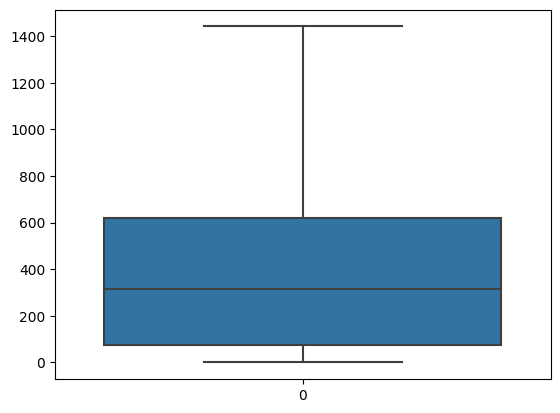

In [459]:
sns.boxplot(df["LiabilitiesTotal"])

<Axes: >

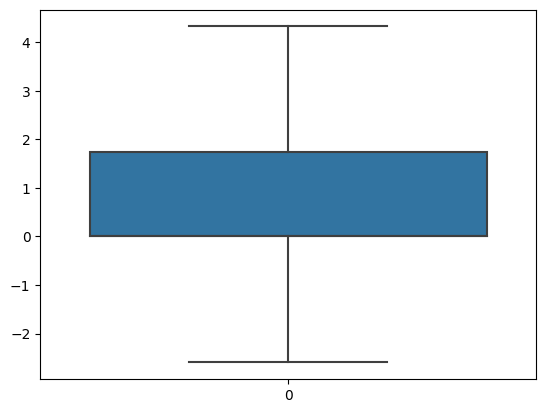

In [460]:
sns.boxplot(df["FreeCash"])

<Axes: >

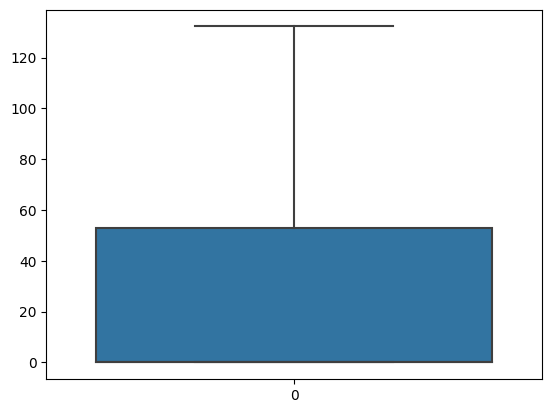

In [461]:
sns.boxplot(df["PrincipalOverdueBySchedule"])

<Axes: >

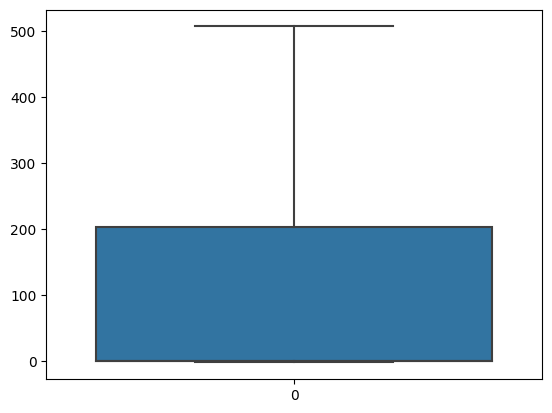

In [462]:
sns.boxplot(df["InterestAndPenaltyBalance"])

In [464]:
# n_outlier=["BidsApi","IncomeFromPrincipalEmployer","IncomeTotal","LiabilitiesTotal","FreeCash","PrincipalOverdueBySchedule",
#           "InterestAndPenaltyBalance"]
# for i in n_outlier:
#     nq1=np.quantile(df[i],0.25)
#     nq3=np.quantile(df[i],0.75)
#     iqrn=q3-q1
#     nlb=q1-(1.5*iqr)
#     nub=q3+(1.5*iqr)
#     print(i,"--","q1:",nq1," q3:",nq3," iqr:",iqrn," upper bound:",nub," lower bound:",nlb)

In [465]:
df.corr()

,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,VerificationType,Age,Gender,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,PlannedInterestTillDate,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,PrincipalOverdueBySchedule,RecoveryStage,ModelVersion,Rating,CreditScoreEsMicroL,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,NextPaymentNr,NrOfScheduledPayments,Default Status
BidsPortfolioManager,1.000000,0.197387,0.036929,0.054073,-0.070138,-0.008456,-0.025450,0.519872,0.496150,-0.081704,0.129095,0.348283,-0.346430,-0.024944,-0.293626,-0.380048,-0.012789,-0.333609,-0.058392,0.383567,0.058555,0.173638,0.289488,0.300321,0.451496,0.426765,0.480283,0.010397,0.366598,-0.001133,-0.071875,0.240088,0.170301,-0.474401,-0.001640,-0.029184,0.013738,0.445126,0.470095,0.189312,0.243147,-0.135164,-0.093656,0.052449,0.027525,0.022586,0.155261,-0.214164
BidsApi,0.197387,1.000000,0.109335,-0.100877,-0.014854,-0.039829,-0.077333,0.126434,0.095578,-0.095729,-0.040401,0.138351,-0.052227,0.024225,-0.040366,-0.056871,0.010714,-0.049166,0.022269,0.048407,-0.026660,0.047769,0.064706,-0.015192,0.087885,0.066685,0.152021,-0.109926,0.075167,-0.054673,-0.012764,0.058802,0.043798,-0.263889,-0.027679,0.056546,-0.096645,0.145058,0.127161,0.040038,0.041506,0.031729,0.082449,0.107539,0.007845,0.080054,-0.050800,-0.039412
BidsManual,0.036929,0.109335,1.000000,0.052543,-0.013276,0.042266,-0.108904,0.354405,0.365682,-0.035980,-0.101391,0.325114,0.056343,0.023476,0.063204,0.052143,0.045150,0.042879,0.024642,-0.039374,0.101696,-0.094240,-0.019286,0.032947,-0.044073,-0.040984,0.239816,-0.034842,0.029232,-0.064916,-0.012583,0.067411,-0.005930,0.087169,0.093213,0.037519,-0.031388,0.213319,0.262292,0.267733,0.062375,-0.081728,-0.035697,-0.026756,-0.004395,0.004285,-0.149052,-0.001866
NewCreditCustomer,0.054073,-0.100877,0.052543,1.000000,0.119206,-0.046622,0.190230,0.122746,0.125501,0.402815,0.073851,0.195454,-0.101642,-0.063037,-0.098737,-0.114872,-0.056789,-0.081998,-0.081949,0.099792,0.093894,-0.377794,-0.169525,0.063616,0.102485,0.115479,0.079323,0.376802,0.038764,0.301538,0.267252,0.096240,0.095495,-0.007617,0.313275,-0.075256,0.046143,0.034448,0.108661,0.099179,0.169953,-0.649390,-0.720311,-0.370458,-0.132288,-0.115222,0.110763,-0.115041
VerificationType,-0.070138,-0.014854,-0.013276,0.119206,1.000000,0.012636,0.090069,0.046104,0.078337,0.169118,0.110877,0.024261,0.310457,-0.016620,0.248356,0.313406,0.002840,0.268340,-0.060686,-0.345780,-0.040973,-0.034214,-0.148028,0.049686,-0.259902,-0.275006,-0.145617,0.066538,-0.247065,0.090262,0.113631,-0.098299,-0.068320,0.206869,0.067375,0.075206,0.013768,-0.091896,-0.035697,0.117314,-0.062694,-0.110879,-0.084063,-0.039426,-0.059927,-0.037656,-0.075121,0.112002
Age,-0.008456,-0.039829,0.042266,-0.046622,0.012636,1.000000,0.021099,0.087672,0.095504,-0.020715,0.044425,0.067092,0.149182,-0.022008,0.165657,0.097273,0.130090,0.125416,0.169576,-0.163019,0.117899,0.029040,0.059908,-0.048296,-0.122871,-0.124374,-0.015769,-0.069460,-0.047190,-0.004741,-0.078676,-0.000524,-0.031650,0.102489,-0.061791,0.038591,0.036367,-0.042919,0.052997,0.121892,-0.005766,0.050506,0.100723,0.024468,-0.001823,0.065510,-0.092138,0.037520
Gender,-0.025450,-0.077333,-0.108904,0.190230,0.090069,0.021099,1.000000,-0.010907,-0.014538,0.290003,0.077860,0.042191,-0.072552,-0.005273,-0.072415,-0.079559,0.000419,-0.047856,-0.043226,0.060729,-0.047875,-0.070862,-0.021418,0.054213,0.086339,0.077169,-0.056486,0.221794,-0.177287,0.227018,0.101642,-0.037164,-0.023712,0.008098,0.114509,-0.075123,0.066273,

### Heatmap

<Axes: >

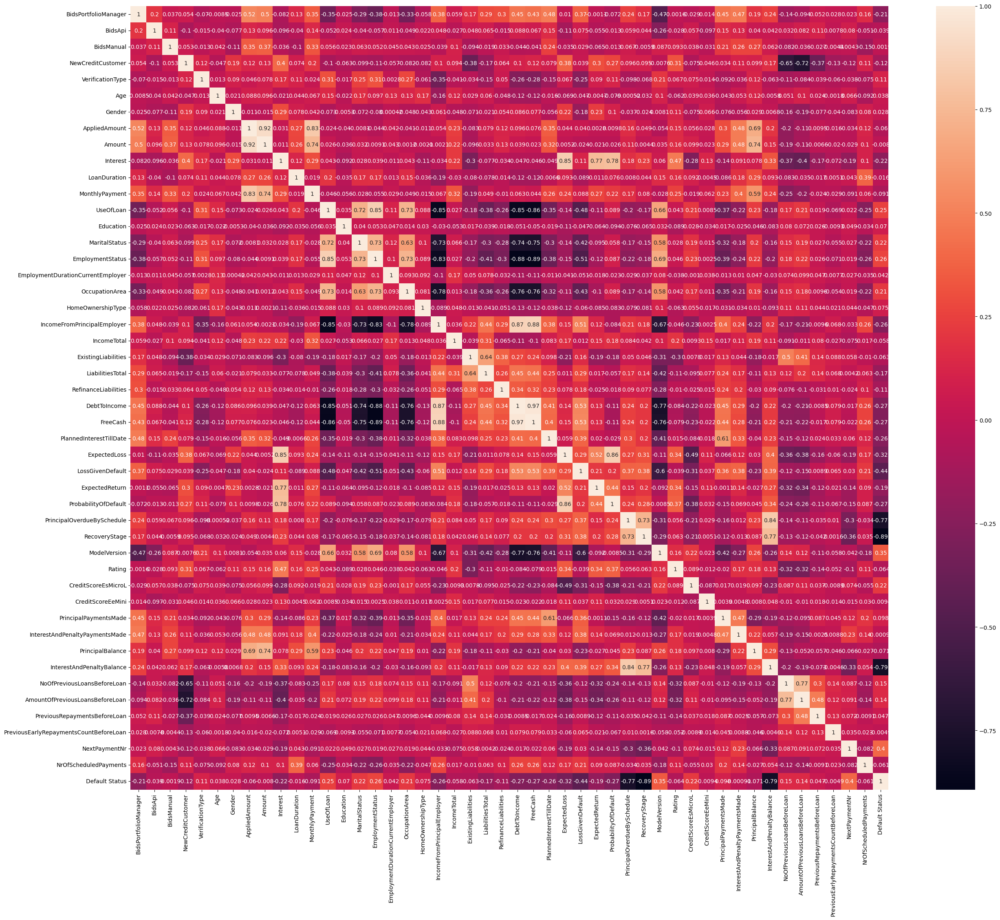

In [466]:
plt.figure(figsize=(30,25))
sns.heatmap(df.corr(),annot=True)

In [467]:
df

,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,VerificationType,Age,Gender,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeFromPrincipalEmployer,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,PlannedInterestTillDate,ExpectedLoss,LossGivenDefault,ExpectedReturn,ProbabilityOfDefault,PrincipalOverdueBySchedule,RecoveryStage,ModelVersion,Rating,CreditScoreEsMicroL,CreditScoreEeMini,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,NextPaymentNr,NrOfScheduledPayments,Default Status
0,0,0.0,115.0410,1,1.0,61,1,319.5582,115.0408,30.00,12,119.083443,2,2.0,2.0,1.0,1,1.0,3.0,815.0,3464.5,0,0.00,0,0.000,0.000,319.0800,0.149255,0.506748,0.136558,0.252434,0.000,1.0,2.0,2,3,2.0,115.0408,20.4222,0.00,0.00,1,83.0852,0.0000,0,3.0,60.0,1
1,0,0.0,140.6057,0,1.0,48,1,191.7349,140.6057,25.00,1,119.083443,2,2.0,1.0,1.0,3,1.0,3.0,815.0,3464.5,0,0.00,0,0.000,0.000,45.8300,0.149255,0.506748,0.136558,0.252434,0.000,1.0,2.0,2,3,2.0,140.6057,2.0227,0.00,0.00,2,255.6467,258.6256,0,3.0,60.0,1
2,0,0.0,319.5580,1,1.0,58,1,319.5582,319.5409,25.00,20,119.083443,2,3.0,2.0,1.0,1,1.0,3.0,815.0,3464.5,0,0.00,0,0.000,0.000,197.2926,0.149255,0.506748,0.136558,0.252434,116.350,1.0,2.0,2,3,2.0,203.1909,59.7626,116.35,414.07,0,0.0000,0.0000,0,3.0,60.0,0
3,0,0.0,57.5205,1,1.0,23,1,127.8233,57.5205,45.00,15,119.083443,2,0.0,1.0,2.0,1,2.0,3.0,815.0,3464.5,0,0.00,0,0.000,0.000,293.1000,0.149255,0.506748,0.136558,0.252434,0.000,1.0,2.0,2,3,2.0,57.5205,18.7323,0.00,0.00,1,134.2144,0.0000,0,3.0,60.0,1
4,0,0.0,319.5582,1,1.0,25,1,319.5582,319.5436,30.00,12,119.083443,1,3.0,1.0,1.0,1,1.0,3.0,815.0,3464.5,0,0.00,0,0.000,0.000,833.8100,0.149255,0.506748,0.136558,0.252434,0.000,1.0,2.0,2,3,2.0,319.5436,220.4200,0.00,0.00,1,146.9966,0.0000,0,3.0,60.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134524,2515,0.0,485.0000,1,1.0,37,0,3000.0000,3000.0000,31.01,60,107.680000,2,2.0,1.0,1.0,3,2.0,1.0,815.0,1400.0,1,500.00,0,7.675,4.325,1587.5450,0.146732,0.900000,0.163368,0.125412,0.000,2.0,1.0,2,3,2.0,1839.7200,0.0000,0.00,0.00,0,0.0000,0.0000,0,3.0,60.0,0
134525,1880,0.0,1120.0000,0,1.0,35,0,3000.0000,3000.0000,18.25,60,85.330000,2,2.0,1.0,1.0,3,1.0,3.0,815.0,2265.0,5,1441.14,0,7.675,4.325,16.3200,0.053246,0.900000,0.129254,0.045510,0.000,1.0,1.0,1,3,2.0,1839.7200,1353.9300,0.00,0.00,1,3000.0000,389.3600,0,3.0,60.0,1
134526,1975,0.0,525.0000,1,2.0,40,0,2500.0000,2500.0000,24.83,60,80.420000,2,2.0,2.0,0.0,3,1.0,3.0,815.0,2500.0,2,1350.00,0,3.220,4.325,1587.5450,0.104219,0.900000,0.144081,0.089076,132.275,2.0,1.0,2,3,2.0,1839.7200,199.3300,630.24,507.25,0,0.0000,0.0000,0,0.0,60.0,0
134527,1840,0.0,1160.0000,0,3.0,47,1,3000.0000,3000.0000,17.74,60,84.510000,2,2.0,2.0,1.0,3,1.0,1.0,521.0,540.0,8,732.05,2,7.675,4.325,1587.5450,0.035612,0.650000,0.141788,0.042144,132.275,2.0,1.0,1,3,2.0,1839.7200,561.5300,0.00,0.00,1,500.0000,96.8000,0,3.0,60.0,0


In [468]:
drops=["AppliedAmount","ExpectedLoss","ModelVersion","NoOfPreviousLoansBeforeLoan","OccupationArea",
      "MaritalStatus","PrincipalOverdueBySchedule","ExpectedReturn","ProbabilityOfDefault","PrincipalBalance","PlannedInterestTillDate"]
df.drop(drops,inplace=True,axis=1)

<Axes: >

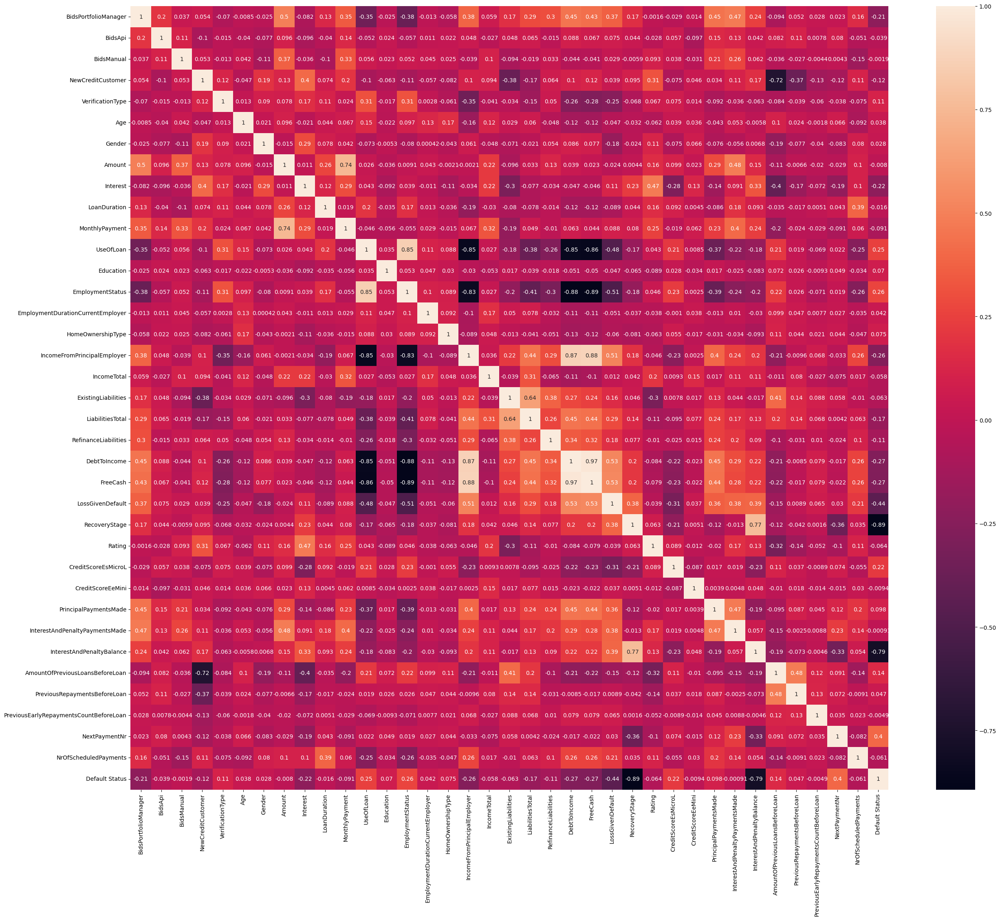

In [469]:
plt.figure(figsize=(30,25))
sns.heatmap(df.corr(),annot=True)

## Model building
### Best feature selection

In [470]:
x=df.drop("Default Status",axis=1)
y=df["Default Status"]

In [471]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.2,random_state=10)

In [472]:
from sklearn.feature_selection import mutual_info_classif

In [473]:
mutual_info=mutual_info_classif(xtrain,ytrain)

In [474]:
mutual_info

array([5.04912424e-02, 2.44035441e-03, 2.41450421e-02, 1.73772797e-02,
       2.02780552e-02, 1.96352003e-04, 2.37759875e-03, 9.10046821e-02,
       9.03936592e-02, 5.49240729e-03, 7.91364894e-02, 4.66757688e-02,
       1.15250042e-02, 4.40284220e-02, 5.98531632e-03, 7.27469064e-03,
       3.71189449e-02, 2.38796298e-02, 2.57378856e-03, 3.29247571e-02,
       8.38676312e-03, 3.80834013e-02, 3.61125557e-02, 1.34163507e-01,
       4.69044333e-01, 1.79663759e-02, 3.80919640e-02, 8.31650628e-03,
       9.69624104e-02, 5.41872907e-02, 3.64391615e-01, 2.34012861e-02,
       5.49287389e-02, 1.20157945e-03, 4.44219839e-01, 1.34906205e-02])

In [475]:
mutual_info=pd.Series(mutual_info)
mutual_info.index=xtrain.columns
mutual_info.sort_values(ascending=False)

RecoveryStage                             0.469044
NextPaymentNr                             0.444220
InterestAndPenaltyBalance                 0.364392
LossGivenDefault                          0.134164
PrincipalPaymentsMade                     0.096962
Amount                                    0.091005
Interest                                  0.090394
MonthlyPayment                            0.079136
PreviousRepaymentsBeforeLoan              0.054929
InterestAndPenaltyPaymentsMade            0.054187
BidsPortfolioManager                      0.050491
UseOfLoan                                 0.046676
EmploymentStatus                          0.044028
CreditScoreEsMicroL                       0.038092
DebtToIncome                              0.038083
IncomeFromPrincipalEmployer               0.037119
FreeCash                                  0.036113
LiabilitiesTotal                          0.032925
BidsManual                                0.024145
IncomeTotal                    

<Axes: >

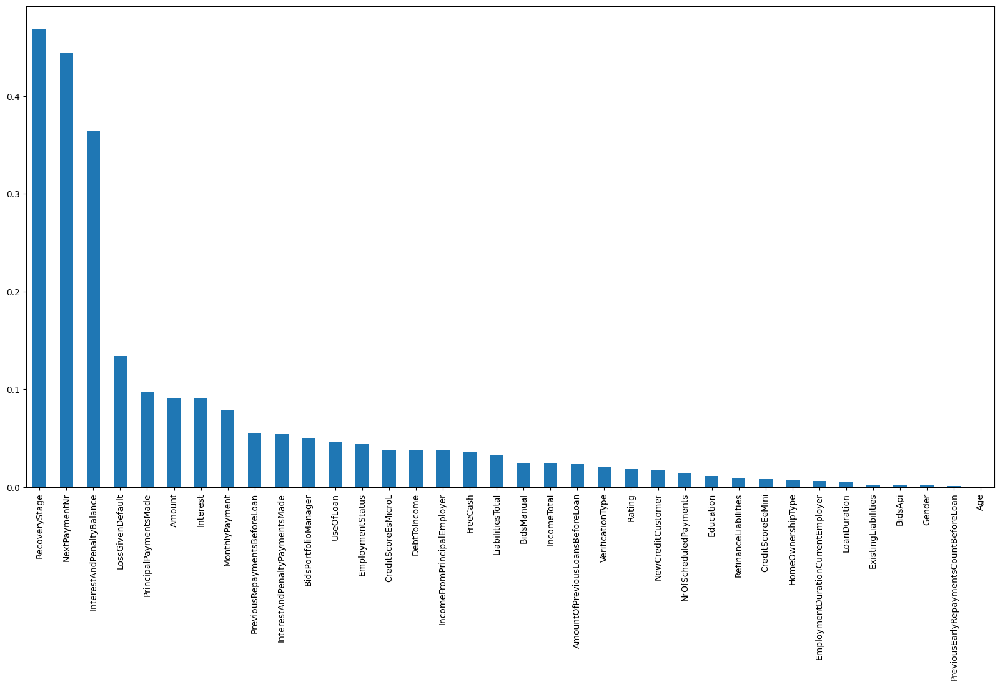

In [476]:
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20,10))

In [477]:
from sklearn.feature_selection import SelectKBest
best_columns=SelectKBest(mutual_info_classif,k=10)
best_columns.fit(xtrain,ytrain)

SelectKBest(score_func=<function mutual_info_classif at 0x000002088C2CAE80>)

In [478]:
select_features=xtrain.columns[best_columns.get_support()]
select_features

Index(['Amount', 'Interest', 'MonthlyPayment', 'LossGivenDefault',
       'RecoveryStage', 'PrincipalPaymentsMade',
       'InterestAndPenaltyPaymentsMade', 'InterestAndPenaltyBalance',
       'PreviousRepaymentsBeforeLoan', 'NextPaymentNr'],
      dtype='object')

In [479]:
xtrain[select_features]

,Amount,Interest,MonthlyPayment,LossGivenDefault,RecoveryStage,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,InterestAndPenaltyBalance,PreviousRepaymentsBeforeLoan,NextPaymentNr
110953,4253.0,27.83,182.98,0.000000,1.0,247.03,302.89,0.0,197.98,3.0
119405,4253.0,61.95,205.92,0.000000,1.0,35.02,255.36,0.0,413.11,3.0
23651,4945.0,14.48,199.77,0.580000,1.0,1839.72,1353.93,0.0,0.00,33.0
115533,2020.0,71.00,115.18,0.000000,1.0,0.00,0.00,204.7,197.98,3.0
109991,1063.0,45.43,43.41,0.000000,1.0,18.91,105.21,0.0,197.98,4.0
...,...,...,...,...,...,...,...,...,...,...
9372,635.0,19.58,219.99,0.650000,1.0,635.00,50.83,0.0,0.00,3.0
105595,2075.0,39.37,92.22,0.000000,1.0,1839.72,24.21,0.0,197.98,3.0
93553,2125.0,57.98,186.49,0.000000,1.0,1839.72,95.83,0.0,197.98,3.0
94735,955.0,16.58,26.70,0.000000,1.0,64.13,78.74,0.0,715.58,7.0


In [480]:
xtest[select_features]

,Amount,Interest,MonthlyPayment,LossGivenDefault,RecoveryStage,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,InterestAndPenaltyBalance,PreviousRepaymentsBeforeLoan,NextPaymentNr
116748,3827.0,8.04,132.30,0.000000,1.0,286.02,65.97,0.00,698.93,4.0
12410,2655.0,16.80,82.08,0.580000,1.0,1839.72,958.61,0.00,0.00,3.0
96034,635.0,10.00,15.61,0.000000,1.0,50.25,29.28,0.00,386.88,7.0
89854,2230.0,20.96,67.71,0.000000,1.0,1839.72,132.88,0.00,197.98,3.0
105766,4253.0,38.60,202.14,0.000000,1.0,1839.72,476.01,0.00,197.98,3.0
...,...,...,...,...,...,...,...,...,...,...
19202,1935.0,53.36,245.34,0.750000,2.0,0.00,0.00,507.25,0.00,0.0
13172,1550.0,41.58,223.10,0.580000,2.0,429.77,1353.93,507.25,0.00,0.0
131054,2126.0,71.00,113.31,0.000000,1.0,0.00,0.00,0.00,197.98,1.0
57895,3185.0,27.65,109.12,0.604019,1.0,409.34,998.97,64.70,102.15,3.0


### SMOTE Analysis

In [481]:
from imblearn.over_sampling import SMOTE
smote=SMOTE(random_state=42)
x_resampled,y_resampled=smote.fit_resample(xtrain[select_features],ytrain)

In [482]:
y_resampled.value_counts()

Default Status
1    73111
0    73111
Name: count, dtype: int64

## Logistic regression algorithm model

In [483]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
lr.fit(x_resampled,y_resampled)

C:\Users\Biji\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [484]:
ypred=lr.predict(xtest[select_features])

## Model validation

In [485]:
from sklearn.metrics import precision_score,recall_score,confusion_matrix,f1_score

In [486]:
f1_score(ytest,ypred)

0.9652023888520238

In [487]:
precision_score(ytest,ypred)

0.9483621948675152

In [488]:
recall_score(ytest,ypred)

0.9826514619250932

In [489]:
confusion_matrix(ytest,ypred)

array([[ 7413,   990],
       [  321, 18182]], dtype=int64)

In [490]:
lr.score(xtest[select_features],ytest)

0.9512748085928789

## Random forest classifier algorithm model

In [491]:
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier()
rfc.fit(x_resampled,y_resampled)

RandomForestClassifier()

In [492]:
ypred=rfc.predict(xtest[select_features])

## Model validation

In [493]:
f1_score(ytest,ypred)

0.9894651975275465

In [494]:
precision_score(ytest,ypred)

0.9840701341743733

In [495]:
recall_score(ytest,ypred)

0.9949197427444199

In [496]:
confusion_matrix(ytest,ypred)

array([[ 8105,   298],
       [   94, 18409]], dtype=int64)

In [497]:
rfc.score(xtest[select_features],ytest)

0.9854307589385267

## KNN classifier alorithm model

In [498]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()
knn.fit(x_resampled,y_resampled)

KNeighborsClassifier()

In [499]:
ypred=knn.predict(xtest[select_features])

## Model validation

In [500]:
f1_score(ytest,ypred)

0.9469889966935877

In [501]:
precision_score(ytest,ypred)

0.9497689589562381

In [502]:
recall_score(ytest,ypred)

0.944225260768524

In [503]:
confusion_matrix(ytest,ypred)

array([[ 7479,   924],
       [ 1032, 17471]], dtype=int64)

In [504]:
knn.score(xtest[select_features],ytest)

0.9273024604177507

## Adaboost classifier algorithm model

In [505]:
from sklearn.ensemble import AdaBoostClassifier
ab=AdaBoostClassifier()
ab.fit(x_resampled,y_resampled)

AdaBoostClassifier()

In [506]:
ypred=rfc.predict(xtest[select_features])

## Model validation

In [507]:
f1_score(ytest,ypred)

0.9894651975275465

In [508]:
precision_score(ytest,ypred)

0.9840701341743733

In [509]:
recall_score(ytest,ypred)

0.9949197427444199

In [510]:
confusion_matrix(ytest,ypred)

array([[ 8105,   298],
       [   94, 18409]], dtype=int64)

In [511]:
ab.score(xtest[select_features],ytest)

0.9832007730617706

## Conclusion
**Through the data cleaning, exploratory data analysis, feature engineering ,model building using appropriate and efficient algorithms and model validation through different parameters we finally developed a strong machine learning model which can classify if any new borrower is likely to default or not.**